:::{.content-hidden }
# Xenium analysis
:::

:::{.content-hidden }
## Initialization
:::

In [1]:
#| output: false
#| echo: false 

# rm(list = ls())
#Library the required

#.'C:/Users/ansaldoginee2/AppData/Local/Programs/R/R-4.4.2/library'
#"M:/LPD-MIS members' data/Eduard Ansaldo/Bioinformatics/analysis_templates/package_version_folder/"

#Xenium
suppressMessages(library(Seurat,lib.loc = "M:/LPD-MIS members' data/Eduard Ansaldo/Bioinformatics/analysis_templates/package_version_folder/"))
suppressMessages(library(arrow))
suppressMessages(library(sf))
suppressMessages(library(glmGamPoi))


suppressMessages(library(dplyr))
suppressMessages(library(cowplot))
suppressMessages(library(ggplot2))

suppressMessages(library(stringr))
suppressMessages(library(Stat2Data))
suppressMessages(library(tidyverse))
suppressMessages(library(patchwork))
# library(pheatmap))
suppressMessages(library(viridis)) 
suppressMessages(library(ggplot2))
suppressMessages(library(ggrepel))
suppressMessages(library(scRepertoire))
suppressMessages(library(circlize))
suppressMessages(library(scales))
suppressMessages(library(scCustomize))
suppressMessages(library(DESeq2)) 
suppressMessages(library(celldex))
suppressMessages(library(SingleR))
suppressMessages(library(gridExtra))

suppressMessages(library(DOSE))
suppressMessages(library(pathview))
suppressMessages(library(clusterProfiler))
suppressMessages(library(org.Mm.eg.db))
suppressMessages(library(enrichplot))
suppressMessages(library(msigdbr))
suppressMessages(library(pheatmap))
suppressMessages(library(UCell))
suppressMessages(library(VennDiagram))
suppressMessages(library(gprofiler2))
suppressMessages(library(scplotter))

source("M:/LPD-MIS members' data/Eduard Ansaldo/Bioinformatics/analysis_templates/function_template.r")

sessionInfo()



R version 4.4.2 (2024-10-31 ucrt)
Platform: x86_64-w64-mingw32/x64
Running under: Windows 11 x64 (build 22631)

Matrix products: default


locale:
[1] LC_COLLATE=English_United States.utf8 
[2] LC_CTYPE=English_United States.utf8   
[3] LC_MONETARY=English_United States.utf8
[4] LC_NUMERIC=C                          
[5] LC_TIME=English_United States.utf8    

time zone: America/New_York
tzcode source: internal

attached base packages:
[1] grid      stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] scplotter_0.1.1             gprofiler2_0.2.3           
 [3] VennDiagram_1.7.3           futile.logger_1.4.3        
 [5] UCell_2.10.1                pheatmap_1.0.12            
 [7] msigdbr_7.5.1               enrichplot_1.26.2          
 [9] org.Mm.eg.db_3.20.0         AnnotationDbi_1.68.0       
[11] clusterProfiler_4.14.3      pathview_1.46.0            
[13] DOSE_4.0.0                  gridExtra_2.3              
[15] Sing

In [2]:
options(future.globals.maxSize = 60500000000)

In [2]:
#| output: false
#| echo: false

packageVersion('seurat')
packageVersion('seurat',lib.loc = "M:/LPD-MIS members' data/Eduard Ansaldo/Bioinformatics/analysis_templates/package_version_folder/")

[1] '5.1.0'

[1] '5.1.0.9006'

:::{.content-hidden }
# Preprocessing
:::

In [3]:
#| output: false
#| echo: false

path <- './Merged_analysis/'
dir.create(path)

Warning message in dir.create(path):
"'.\Merged_analysis' already exists"


:::{.content-hidden }
## Read in Data for object with two sections in the same area
:::

In [4]:
#| output: false
#| echo: false

seurat_0038738_d28_5_d35_5 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0038738__d28_5_d35_5__20241107__191623',fov = 'fov', assay = 'Xenium' , cell.centroids = F, segmentations = 'cell') 

seurat_0038738_d28_5_d35_5 <-  subset(seurat_0038738_d28_5_d35_5, subset = nCount_Xenium > 0)
seurat_0038738_d28_5_d35_5$slide <- '0038738'



10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not 

:::{.content-hidden }
### Splitting both sections into different objects
:::

In [5]:
#| output: false
#| echo: false

# seurat_0038738_d28_5_d35_5$coordinate_x <- GetTissueCoordinates(seurat_0038738_d28_5_d35_5) |> pull(x)
#seurat_0038738_d28_5_d35_5$coordinate_y <- GetTissueCoordinates(seurat_0038738_d28_5_d35_5) |> pull(y)

# cells_to_keep_1 <- seurat_0038738_d28_5_d35_5 |> filter(coordinate_x  < 4500) |> row.names()
# cells_to_keep_2 <- seurat_0038738_d28_5_d35_5 |> filter(coordinate_x  > 4500) |> row.names()

xenium.obj <- seurat_0038738_d28_5_d35_5
cropped.coords <- Crop(xenium.obj[["fov"]], x = c(0, 4500), coords = "tissue")
xenium.obj[["zoom1"]] <- cropped.coords
seurat_0038738_d28_5 <- subset(seurat_0038738_d28_5_d35_5, cells = Cells(xenium.obj@images$zoom))


xenium.obj <- seurat_0038738_d28_5_d35_5
cropped.coords <- Crop(xenium.obj[["fov"]], x = c(4500, 9000), coords = "tissue")
xenium.obj[["zoom1"]] <- cropped.coords
seurat_0038738_d35_5 <- subset(seurat_0038738_d28_5_d35_5, cells = Cells(xenium.obj@images$zoom))





Warning message:
"Key 'Xenium_' taken, using 'zoom1_' instead"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Key 'Xenium_' taken, using 'zoom1_' instead"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"


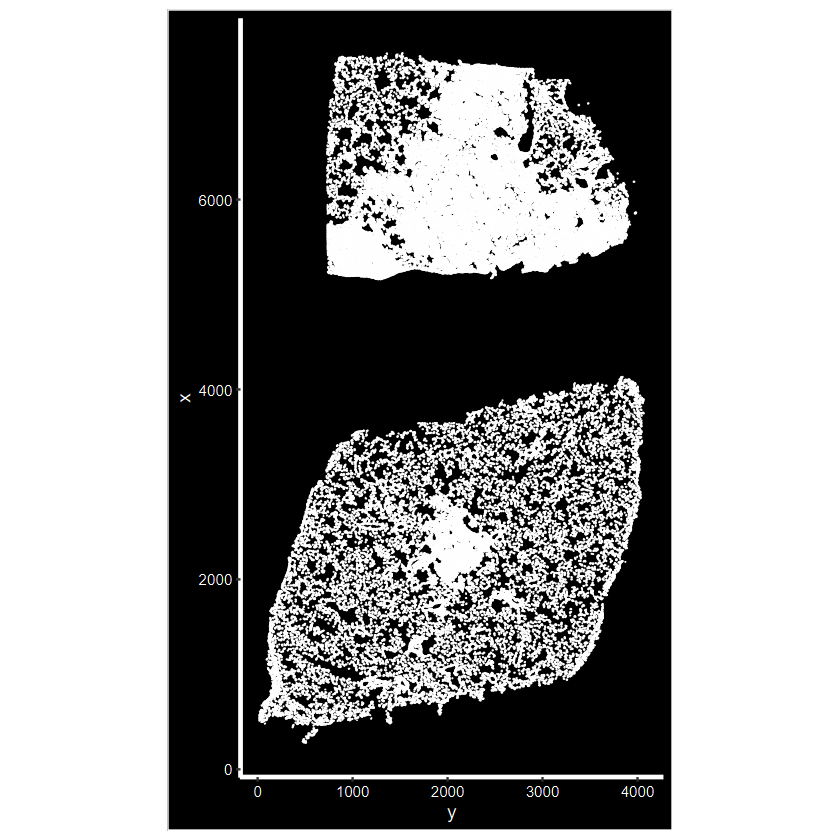

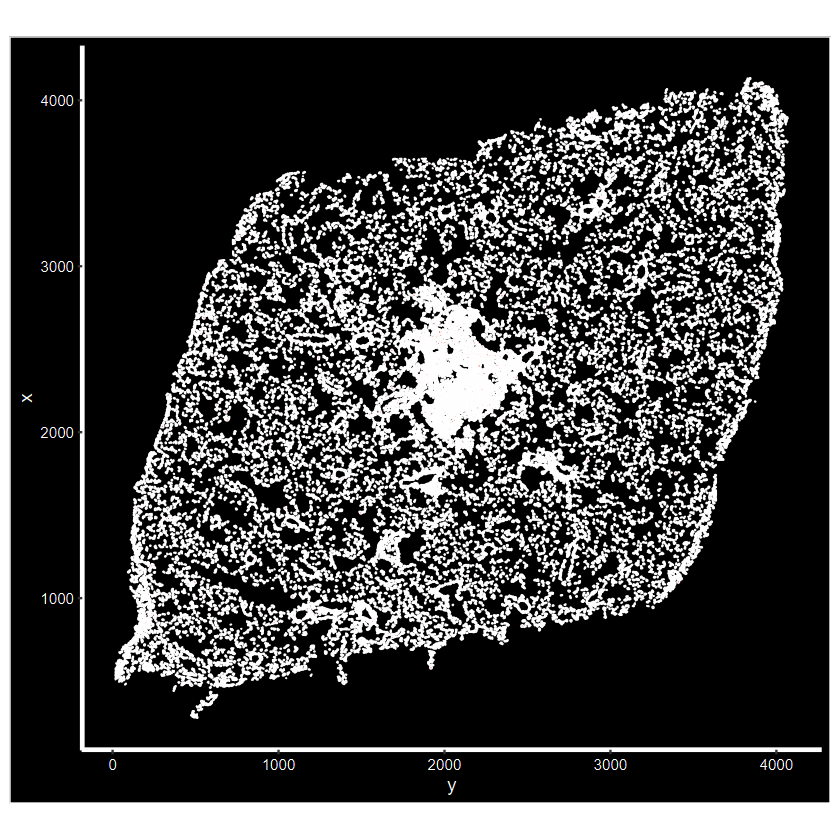

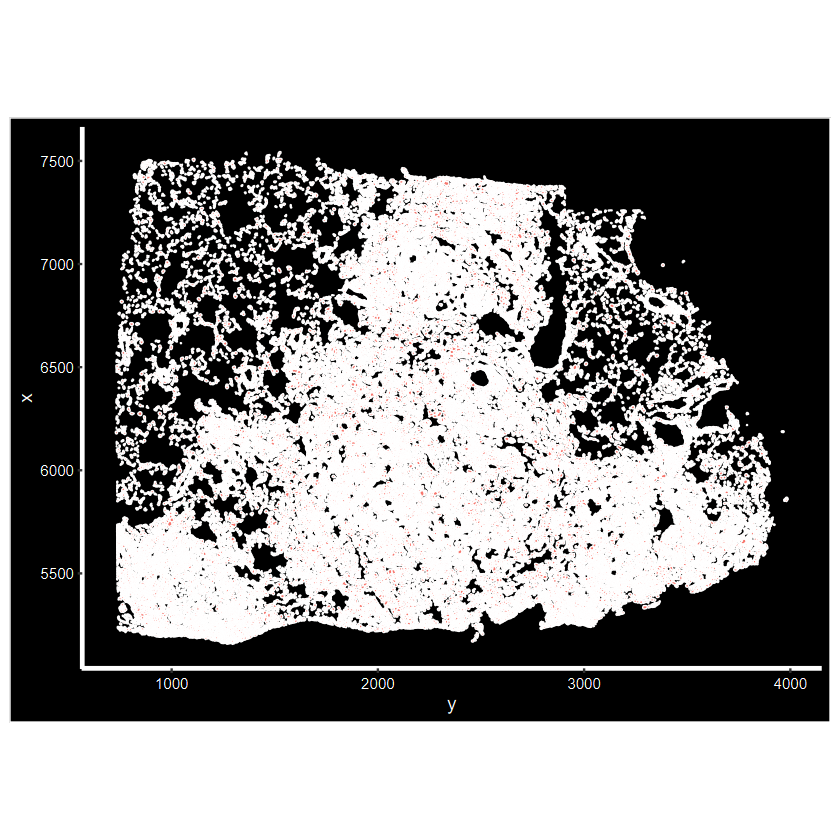

In [6]:
#| output: false
#| echo: false

ImageDimPlot(seurat_0038738_d28_5_d35_5, fov = "fov", axes = T, crop = T)
ImageDimPlot(seurat_0038738_d28_5, fov = "fov", axes = T, crop = T)
ImageDimPlot(seurat_0038738_d35_5, fov = "fov", axes = T, crop = T)

In [7]:
#| output: false
#| echo: false

seurat_0038738_d28_5$Sample <- 'd28_5'
names(seurat_0038738_d28_5@images) <- 'fov_d28_5'
seurat_0038738_d35_5$Sample <- 'd35_5'
names(seurat_0038738_d35_5@images) <- 'fov_d35_5'

:::{.content-hidden }
## Reading in the rest of the data and normalizing it
:::

In [8]:
#| output: false
#| echo: false

seurat_0037254_d56_5 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0038738__d56_5__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)   
seurat_0037254_d56_5$slide <- '0037254'
seurat_0037254_d56_5$Sample <- 'd56_5'
names(seurat_0037254_d56_5@images) <- 'fov_d56_5'
seurat_0037254_d28_4 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0037254__d28_2__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)  
seurat_0037254_d28_4$slide <- '0037254'
seurat_0037254_d28_4$Sample <- 'd28_4'
names(seurat_0037254_d28_4@images) <- 'fov_d28_4'
seurat_0037254_d28_3 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0037254__d28_3__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)  
seurat_0037254_d28_3$slide <- '0037254'
seurat_0037254_d28_3$Sample <- 'd28_3'
names(seurat_0037254_d28_3@images) <- 'fov_d28_3'
seurat_0037254_d35_2 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0037254__d35_2__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)  
seurat_0037254_d35_2$slide <- '0037254'
seurat_0037254_d35_2$Sample <- 'd35_2'
names(seurat_0037254_d35_2@images) <- 'fov_d35_2'
seurat_0037254_d35_3 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0037254__d35_3__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)  
seurat_0037254_d35_3$slide <- '0037254'
seurat_0037254_d35_3$Sample <- 'd35_3'
names(seurat_0037254_d35_3@images) <- 'fov_d35_3'
seurat_0037254_d42_2 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0037254__d42_2__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)  
seurat_0037254_d42_2$slide <- '0037254'
seurat_0037254_d42_2$Sample <- 'd42_2'
names(seurat_0037254_d42_2@images) <- 'fov_d42_2'
seurat_0037254_d42_3 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0037254__d42_3__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)  
seurat_0037254_d42_3$slide <- '0037254'
seurat_0037254_d42_3$Sample <- 'd42_3'
names(seurat_0037254_d42_3@images) <- 'fov_d42_3'
seurat_0037254_d56_2 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0037254__d56_2__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)  
seurat_0037254_d56_2$slide <- '0037254'
seurat_0037254_d56_2$Sample <- 'd56_2'
names(seurat_0037254_d56_2@images) <- 'fov_d56_2'
seurat_0037254_d56_3 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0037254__d56_3__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0) 
seurat_0037254_d56_3$slide <- '0037254'
seurat_0037254_d56_3$Sample <- 'd56_3'
names(seurat_0037254_d56_3@images) <- 'fov_d56_3'
seurat_0038738_d28_2 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0038738__d28_2__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)  
seurat_0038738_d28_2$slide <- '0038738'
seurat_0038738_d28_2$Sample <- 'd28_2'
names(seurat_0038738_d28_2@images) <- 'fov_d28_2'
seurat_0038738_d35_1 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0038738__d35_1__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)  
seurat_0038738_d35_1$slide <- '0038738'
seurat_0038738_d35_1$Sample <- 'd35_1'
names(seurat_0038738_d35_1@images) <- 'fov_d35_1'
seurat_0038738_d35_4 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0038738__d35_4__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)  
seurat_0038738_d35_4$slide <- '0038738'
seurat_0038738_d35_4$Sample <- 'd35_4'
names(seurat_0038738_d35_4@images) <- 'fov_d35_4'
seurat_0038738_d42_4 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0038738__d42_4__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)  
seurat_0038738_d42_4$slide <- '0038738'
seurat_0038738_d42_4$Sample <- 'd42_4'
names(seurat_0038738_d42_4@images) <- 'fov_d42_4'
seurat_0038738_d42_5 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0038738__d42_5__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0)  
seurat_0038738_d42_5$slide <- '0038738'
seurat_0038738_d42_5$Sample <- 'd42_5'
names(seurat_0038738_d42_5@images) <- 'fov_d42_5'
seurat_0038738_d56_1 <- LoadXenium('n:/Ivan/Xenium/20241107__191036__241107_ivan_granuloma/output-XETG00200__0038738__d56_1__20241107__191623',fov = 'fov', assay = 'Xenium', cell.centroids = F, segmentations = 'cell') |> subset(subset = nCount_Xenium > 0) 
seurat_0038738_d56_1$slide <- '0038738'
seurat_0038738_d56_1$Sample <- 'd56_1'
names(seurat_0038738_d56_1@images) <- 'fov_d56_1'

10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not 

:::{.content-hidden }
## Merging objects
:::

In [9]:
#| output: false
#| echo: false

object_list <- list(seurat_0037254_d56_5, seurat_0037254_d28_4, seurat_0037254_d28_3, seurat_0037254_d35_2, seurat_0037254_d35_3, seurat_0037254_d42_2, seurat_0037254_d42_3, seurat_0037254_d56_2, seurat_0037254_d56_3, seurat_0038738_d28_2, seurat_0038738_d28_5, seurat_0038738_d35_5, seurat_0038738_d35_1, seurat_0038738_d35_4, seurat_0038738_d42_4, seurat_0038738_d42_5, seurat_0038738_d56_1)

:::{.content-hidden }
### QC
:::

Warning message:
"Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead."
Warning message:

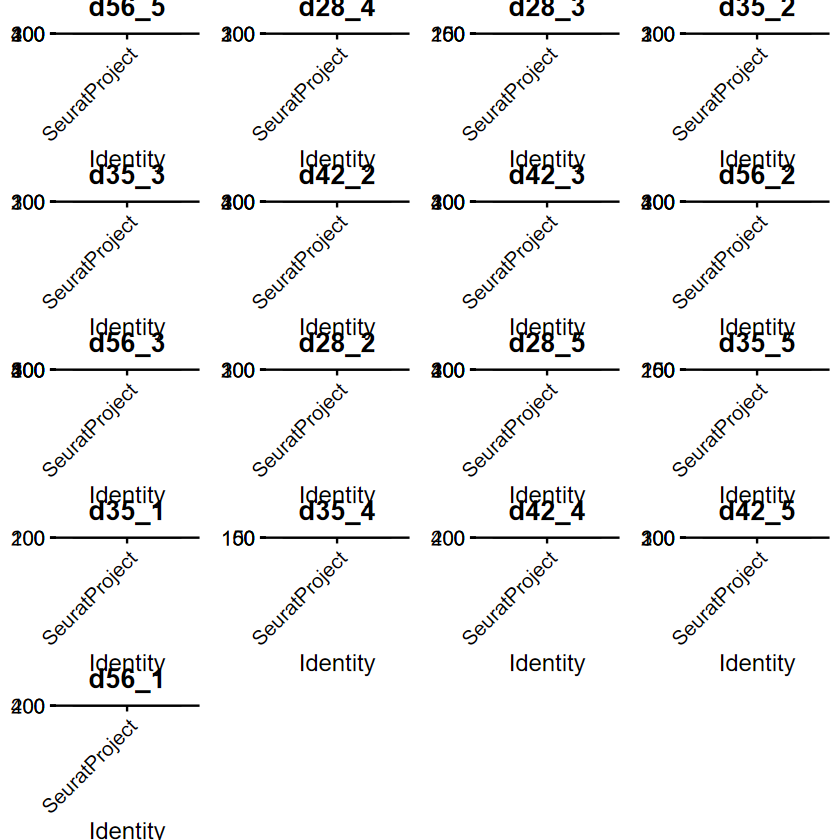

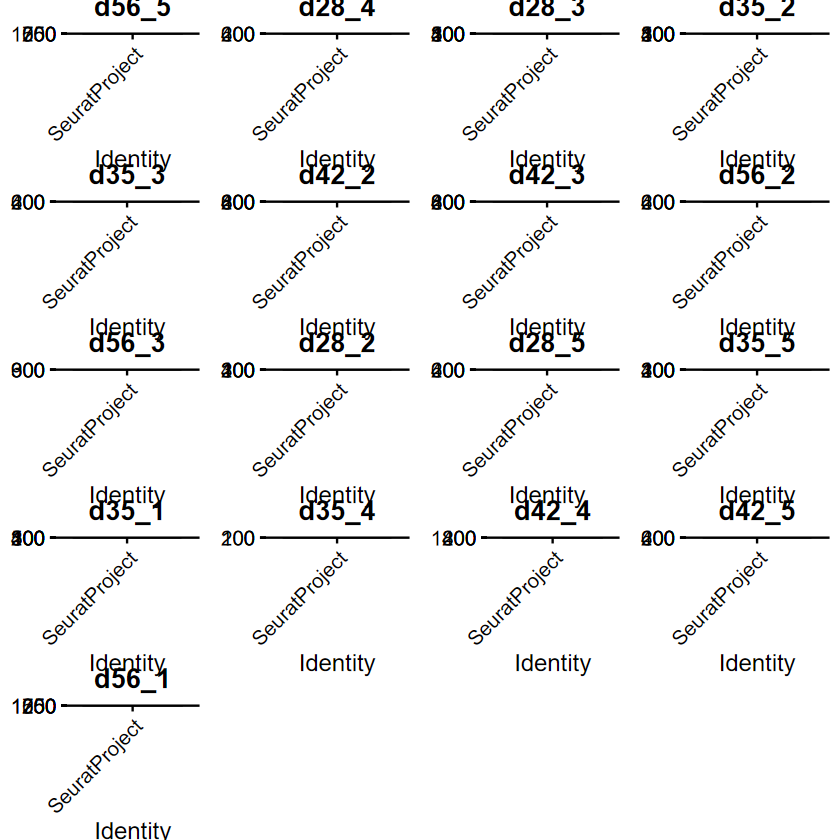

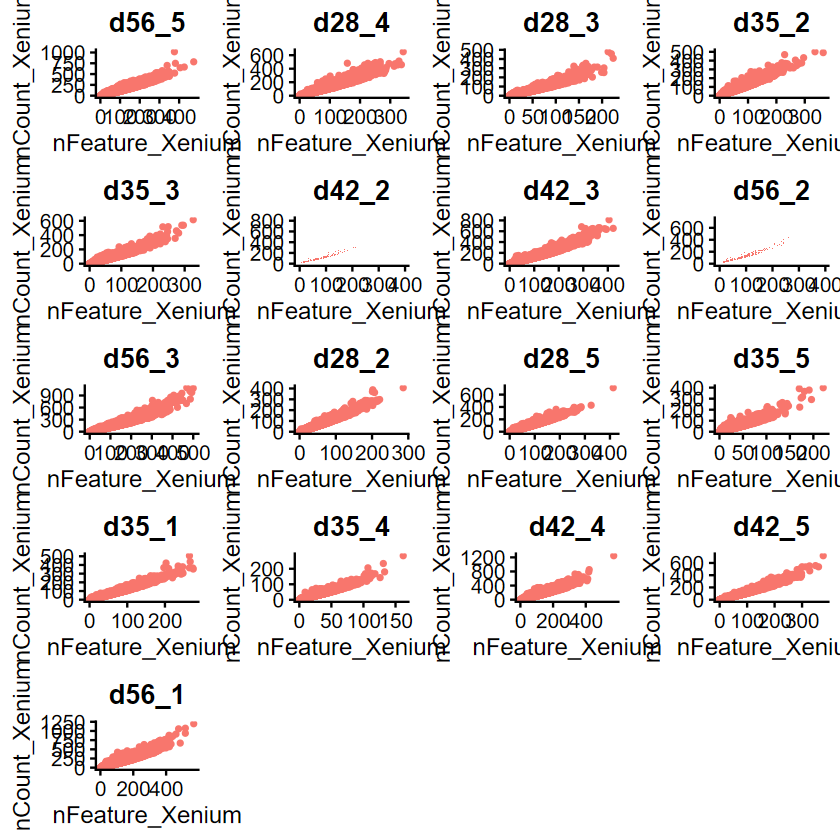

In [10]:
#| output: false
#| echo: false

p <- list()
p4 <- list()
p6 <- list()
i <- 1
for (object in object_list ) {
    sample <- unique(object$Sample)
    p2 <- VlnPlot(object, features = c("nFeature_Xenium"), ncol = 2, pt.size = 0) + ggtitle(sample) +NoLegend()
    p3 <- VlnPlot(object, features = c("nCount_Xenium"), ncol = 2, pt.size = 0) + ggtitle(sample)+NoLegend()
    plot5 <- FeatureScatter(object, feature1 = "nFeature_Xenium", feature2 = "nCount_Xenium") + ggtitle(sample)+NoLegend()
    p[[i]] <- p2
    p4[[i]] <- p3
    p6[[i]] <- plot5
    i <- i+1
}

plot <- grid.arrange(grobs = p)
ggsave('QC_plots_nFeature.pdf', path = path, plot = plot, height = 15, width = 10)
plot <- grid.arrange(grobs = p4)
ggsave('QC_plot_nCount.pdf', path = path, plot = plot, height = 15, width = 10)
plot <- grid.arrange(grobs = p6)
ggsave('QC_plot.pdf', path = path, plot = plot, height = 15, width = 10)

:::{.content-hidden }
### Merging
:::

In [ ]:
#| output: false
#| echo: false

options(future.globals.maxSize = 60500000000)
for (object in object_list) {
    if (exists('seurat')) {
        seurat <- merge(seurat, object)
    } else {
        seurat <- object
    }
}

Warning message:
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message:
"Key 'Xenium_' taken, using 'fovd284_' instead"
Warning message:
"Key 'Xenium_' taken, using 'fovd283_' instead"
Warning message:
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message:
"Key 'Xenium_' taken, using 'fovd352_' instead"
Warning message:
"Key 'Xenium_' taken, using 'fovd353_' instead"
Warning message:
"Key 'Xenium_' taken, using 'fovd422_' instead"
Warning message:
"Key 'Xenium_' taken, using 'fovd423_' instead"
Warning message:
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message:
"Key 'Xenium_' taken, using 'fovd562_' instead"
Warning message:
"Key 'Xenium_' taken, using 'fovd563_' instead"
Warning message:
"Key 'Xenium_' taken, using 'fovd282_' instead"
Warning message:
"Key 'Xenium_' taken, using 'fovd285_' instead"


:::{.content-hidden }
## QC filtering
:::

In [ ]:
#| output: false
#| echo: false

nrow(seurat@meta.data)
seurat <- seurat |> subset(subset = (nFeature_Xenium > 3 & nCount_Xenium > 6))
nrow(seurat@meta.data)


:::{.content-hidden }
## Saving object
:::

In [ ]:
#| output: false
#| echo: false

saveRDS(seurat, 'Xenium_Ivan_2024_merged.rds')

:::{.content-hidden }
# Analysis after clustering on the skyline server with a range of resolutions and dimensions
:::

## Initialization

In [14]:
path <- './Full_merged_analysis/'
# unlink(path, recursive = T)
dir.create(path)

Warning message in dir.create(path):
"'.\Full_merged_analysis' already exists"


In [11]:
seurat <- readRDS("Z:/xenium_Ivan/initial_merged_clustering/Xenium_Ivan_2024_merged_dim_25.rds")
#seurat <- readRDS("Xenium_Ivan_merged_clustered.rds")

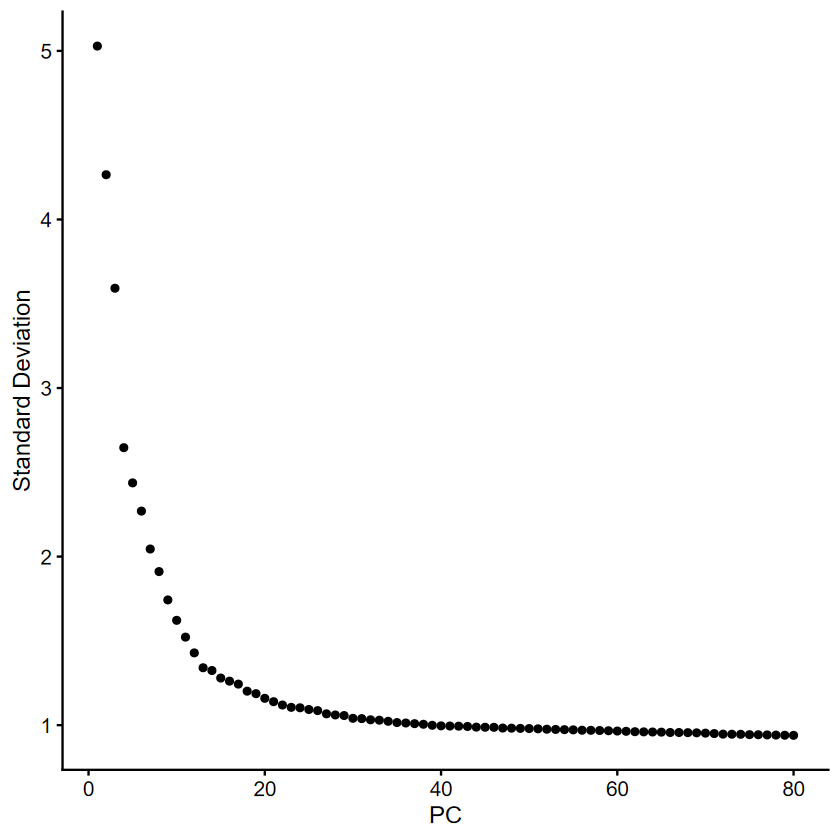

In [12]:
ElbowPlot(seurat,ndims = 80)

In [13]:
dimensions <- 25
resolutions <-c(0.05, 0.1, 0.15, 0.2, 0.3)


In [ ]:
p <- list()
i <- 1
for (resolution in resolutions ) {
    Idents(seurat) <- paste0('SCT_snn_res.', resolution) 
    p2 <- DimPlot(seurat, reduction = "umap", label = TRUE) + ggtitle(paste0('R ', resolution)) + theme(legend.position = "none")    
    p[[i]] <- p2
    i <- i+1
}

plot <- grid.arrange(grobs = p)
ggsave('clustering_results_by_resolution.pdf', path = path, plot = plot)

## Chosen resolution and dimensions

In [18]:
dimensions <- 25
resolution <- 0.3
#seurat <- readRDS('Z:/xenium_Ivan/Xenium_Ivan_2024_merged_dim_40.rds')

## Initial plots and calculations

In [19]:
seurat@meta.data <- seurat@meta.data |>
    mutate(Groups = case_when(
        str_detect(Sample, pattern = 'd28' ) ~ 'Day 28',
        str_detect(Sample, 'd35' ) ~ 'Day 35',
        str_detect(Sample, 'd42' ) ~ 'Day 42',
        str_detect(Sample, 'd56' ) ~ 'Day 56'
        
    )) |>

    mutate(
        Groups = factor(Groups, levels = c('Day 28', 'Day 35', 'Day 42', 'Day 56')),
        Sample = factor(Sample, levels = sort(unique(seurat$Sample)))
    ) |>
    mutate(Samples = Sample)




[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14"
[16] "15" "16" "17" "18" "19"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



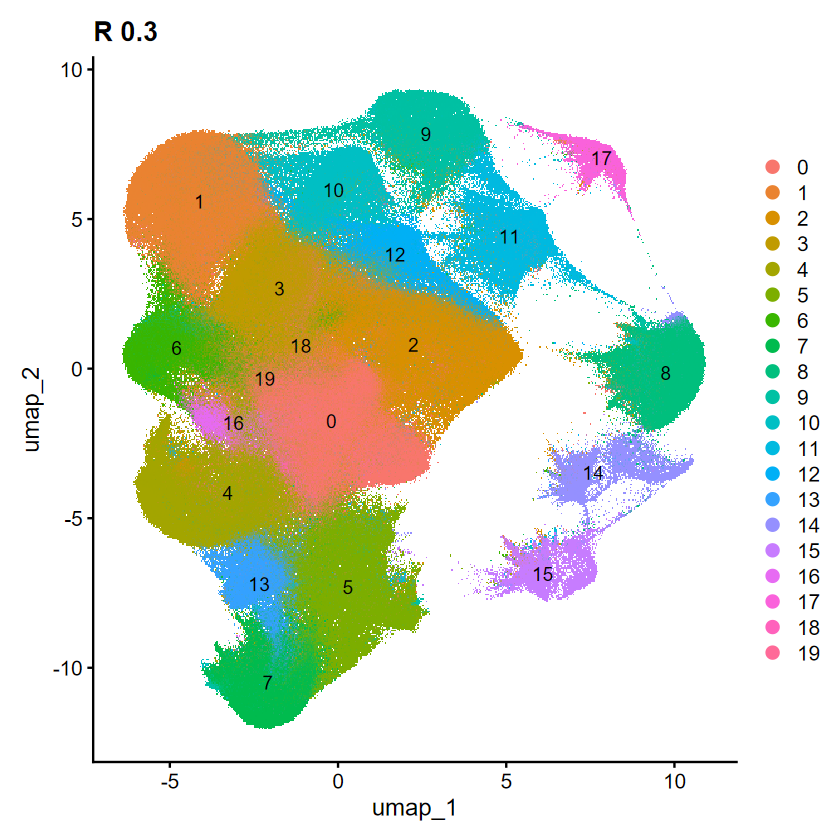

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



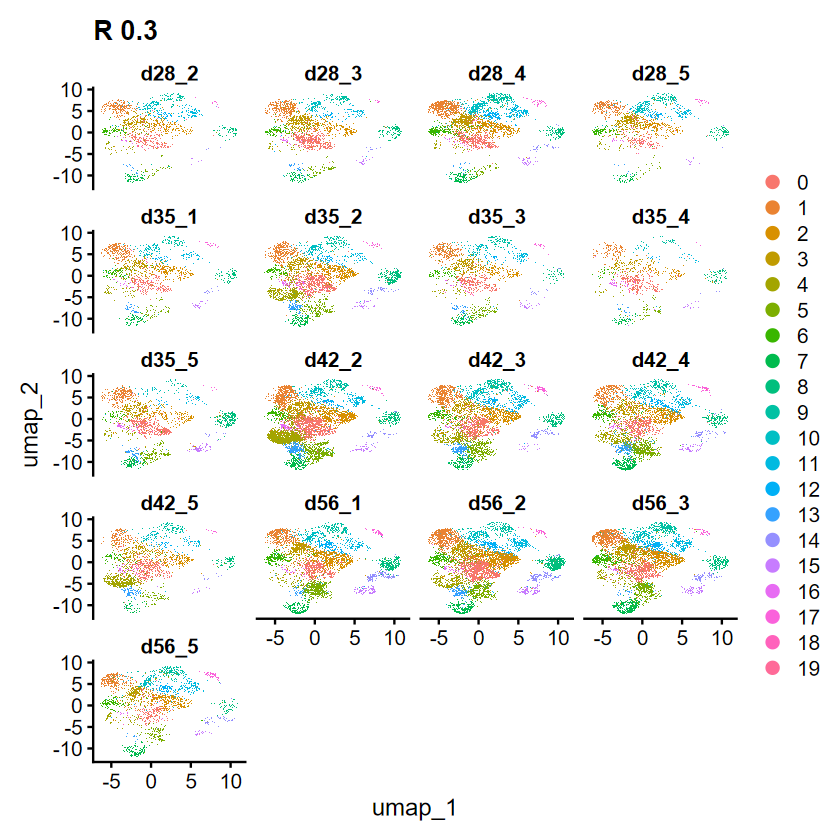

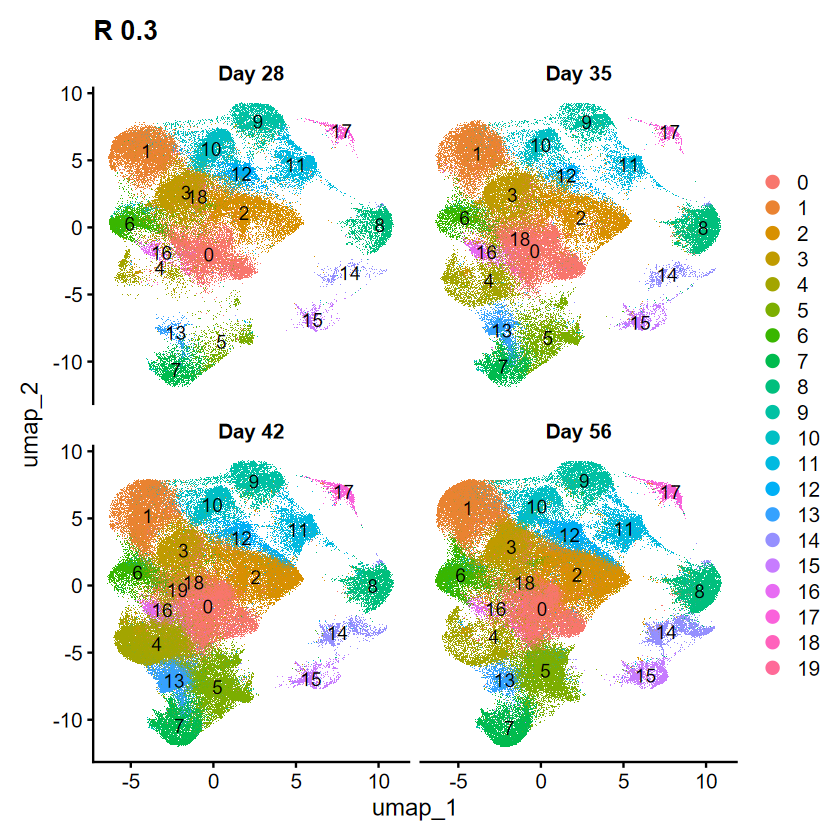

In [ ]:
Idents(seurat) <- paste0('SCT_snn_res.', resolution)
seurat[['seurat_clusters']]<- Idents(seurat)

seurat@meta.data <- seurat@meta.data |>
    mutate(
        seurat_clusters = factor(seurat_clusters, levels = c('0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19'))
    )

levels(seurat$seurat_clusters)
Idents(seurat) <- 'seurat_clusters'
DimPlot(seurat, reduction = "umap", label = TRUE) + ggtitle(paste0('R ', resolution))
ggsave('UMAP.pdf', path = path)
DimPlot(seurat, reduction = "umap", label = FALSE, split.by = 'Samples', ncol = 4) + ggtitle(paste0('R ', resolution))
ggsave('UMAP_by_sample.pdf', path = path, width = 12, height = 10)
DimPlot(seurat, reduction = "umap", label = TRUE, split.by = 'Groups', ncol = 2) + ggtitle(paste0('R ', resolution))
ggsave('UMAP_by_group.pdf', path = path, width = 10, height = 10)

Saving 7 x 7 in image


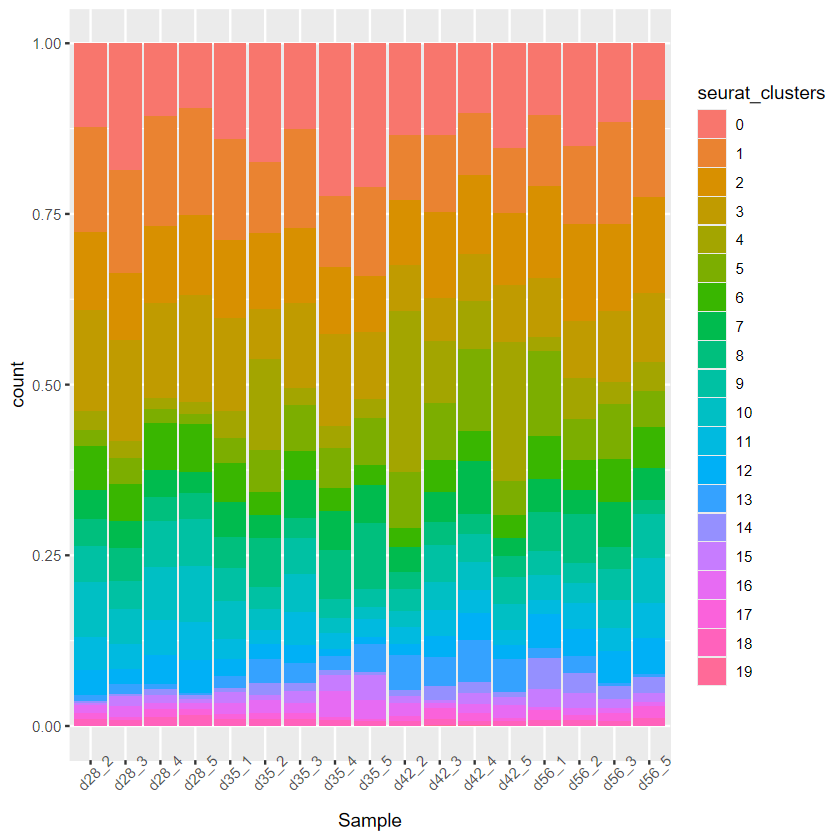

Saving 7 x 7 in image


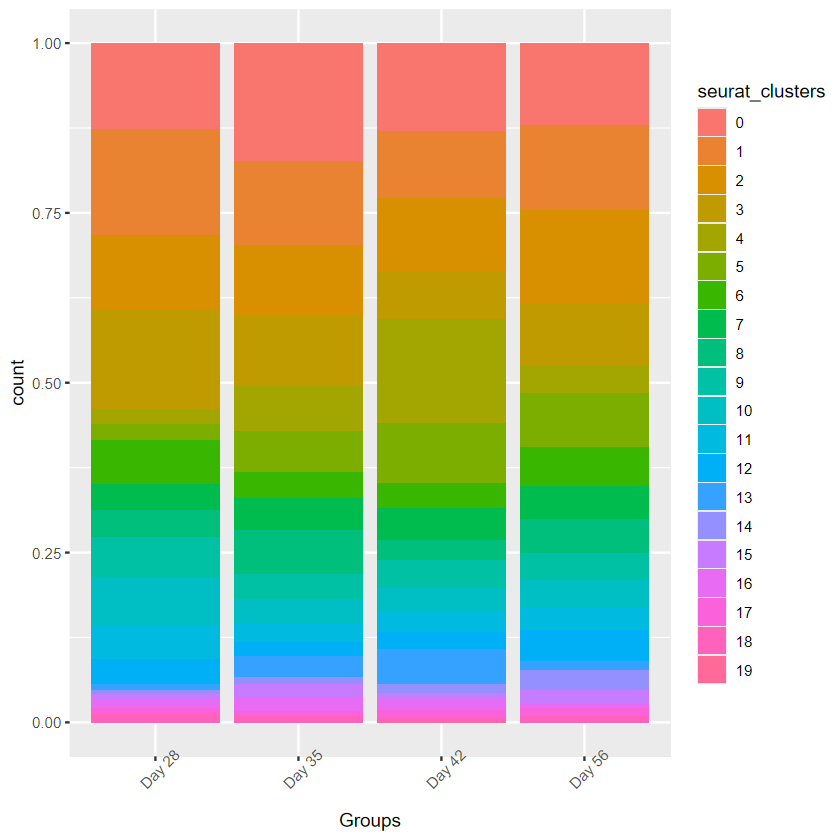

In [21]:

# Extracting cell counts for bar graphs
cell_counts <- FetchData(seurat,vars=c('seurat_clusters', "Sample")) 
cell_counts <- arrange(cell_counts, Sample)


counts <- cell_counts %>% add_count(Sample, name='total_cell_count_by_sample') #%>%  ungroup() %>% arrange( seurat_clusters , desc(hash.ID) ) #%>% arrange('seurat_clusters')

counts <- counts %>% 
    dplyr::count(seurat_clusters, Sample, total_cell_count_by_sample,name='cluster_count')  |> 
        mutate(frequency_within_sample=cluster_count*100/total_cell_count_by_sample)  |> 
        mutate(Sample = as.character(Sample)) |> 

        arrange( Sample, desc(Sample)) #%>% arrange('seurat_clusters')

new_counts <- counts |> 
    arrange(Sample) |>     
    pivot_wider(id_cols = seurat_clusters, names_from = 'Sample', values_from = frequency_within_sample)
    
write.csv(new_counts,file=paste0(path,"number of cells per cluster per condition.csv"),row.names=F)

# Barplot of proportion of cells in each cluster by sample
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Sample, fill=seurat_clusters), position=position_fill())+ theme(axis.text.x = element_text(angle = 45, vjust = 1))
ggsave(paste0(path, 'cells_per_cluster_per_sample.pdf'))
    
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Groups, fill=seurat_clusters), position=position_fill()) + theme(axis.text.x = element_text(angle = 45, vjust = 1)) 
ggsave(paste0(path, 'cells_per_cluster_per_group.pdf'))

## Top genes per cluster

In [22]:
#slot(object = seurat@assays$SCT@SCTModel.list[[3]], name="umi.assay") <- 'Xenium'
for (i in 1:17) {
    slot(object = seurat@assays$SCT@SCTModel.list[[i]], name="umi.assay") <- 'Xenium'
}

SCTResults(object=seurat, slot="umi.assay")

$`1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2`
[1] "Xenium"

$`2.1`
[1] "Xenium"

$`2.1.1`
[1] "Xenium"

$`2.1.1.1`
[1] "Xenium"

$`2.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

In [23]:
object_annotations <- ''
 
Idents(seurat) <- 'seurat_clusters'

seurat <- PrepSCTFindMarkers(seurat, assay = "SCT", verbose = TRUE)
seurat.markers <- FindAllMarkers(seurat, only.pos = TRUE, min.pct = 0.01)

# saveRDS(seurat.markers, file = 'seurat.markers.rds')



#Add gene annotations:
annotations <- read.csv("M:/LPD-MIS members' data/Eduard Ansaldo/Bioinformatics/analysis_templates/annotations.csv")
seurat.markers <- seurat.markers |>
                left_join(y= unique(annotations[,c('gene_name', 'description')]),
                    by = c('gene' = 'gene_name'))

                    

#Top10 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 10) -> top10

#Top25 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 25) -> top25

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 100) -> top100

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 3) -> top3

write.table(top100,file=paste0(path,'top100',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
# write.table(top25,file=paste0(path,'top25',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
write.table(top10,file=paste0(path,'top10',object_annotations, ".tsv"), sep="\t",row.names = FALSE)


# # #Top5 markers
# seurat.markers %>%
#     group_by(cluster) %>%
#     slice_head(n = 5) -> top5
# DoHeatmap(seurat, features = top5$gene, size = 1) + NoLegend() & theme(text=element_text(size=6))
# ggsave(paste0("Heatmap_Top5_per_cluster", object_annotations, ".pdf"), path = path)

# #Top10 markers
# seurat.markers %>%
#      group_by(cluster) %>%
#      slice_head(n = 10) -> top10
#  DoHeatmap(seurat, features = top10$gene, size = 1) + NoLegend() & theme(text=element_text(size=4)) 
#  ggsave(paste0("Heatmap_Top10_per_cluster", object_annotations, ".pdf"), path = path)

gene_list_plot <- top3 |> pull(gene)

pdf(paste0(path, 'Clustered_dotplot', object_annotations, '.pdf'))
Clustered_DotPlot(seurat, features=gene_list_plot, k=length(unique(seurat$seurat_clusters)), plot_km_elbow = FALSE, cluster_ident=FALSE, ggplot_default_colors = T)
dev.off()


    

Found 17 SCT models. Recorrecting SCT counts using minimum median counts: 16

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Warning message:
"Feature list contains duplicates, making unique."


pdf 
  2

## Further analysis

In [ ]:
levels(seurat$seurat_clusters)

In [ ]:
Idents(seurat) <- 'seurat_clusters'
#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 4) -> top3
    gene_list_plot <- top3 |> pull(gene)
gene_list_plot_3 <- gene_list_plot

gene_list_plot <- c(gene_list_plot_3, 'cCd3e', 'Cd3d', 'Cd4', 'Cd8b', 'Cd8a', 'Trbc1', 'Cd20', 'Cd19', 'Ighm', 'Igha', 'Ighg1')
gene_list_plot <- c(gene_list_plot, 'Cd68', 'Csf1r', 'Mafb', 'Itgam', 'Siglecf', 'Mertk', 'Maf', 'Spi1', 'Zeb2')

pdf(paste0(path, 'Clustered_dotplot_additional_markers', '.pdf'))
Clustered_DotPlot(seurat, features=gene_list_plot, k=length(unique(seurat$seurat_clusters)), plot_km_elbow = FALSE, cluster_ident=FALSE, ggplot_default_colors = T,column_label_size = 8,row_label_size = 6)
dev.off()

In [ ]:
ImageDimPlot(seurat, fov = 'fov_d56_2', split.by = 'seurat_clusters', size = 0.02, alpha = 0.1)
ggsave('D_56_ImageDimPlot.png', width = 10, height = 10, path = path)

## Automatic cell annotation

Warning message in ImmGenData(ensembl = FALSE):
"'ImmGenData' is deprecated.
Use 'celldex::ImmGenData' instead.
See help("Deprecated")"
Warning message:
"Layer 'data' is empty"
Warning message:
"Layer 'scale.data' is empty"
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



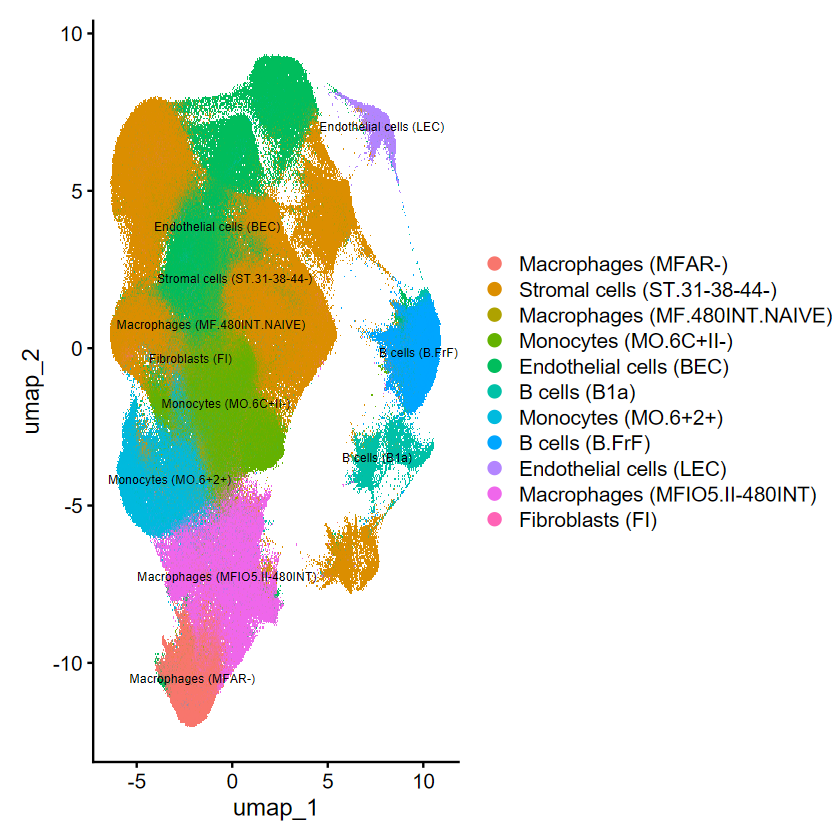

In [25]:
immgen <- ImmGenData(ensembl = FALSE)
predictions_cluster <- SingleR(test = as.SingleCellExperiment(seurat), assay.type.test = 1, ref = immgen, labels = immgen$label.fine, cluster = seurat$seurat_clusters)

row.names <- rownames(predictions_cluster)

predictions_cluster <- predictions_cluster |>
    as_tibble() |> 
    dplyr::select(c('labels')) 

predictions_cluster$cluster <- row.names

#predictions_cluster <- predictions_cluster |> rename('labels_per_cluster' = 'labels')

annotations <- seurat@meta.data |>
    left_join(predictions_cluster, by = join_by('seurat_clusters' == 'cluster')) |>
    pull(labels)

seurat$labels_per_cluster <- annotations

Idents(seurat) <- 'labels_per_cluster'
DimPlot(seurat, label = T, label.size = 2.5)
ggsave(paste0('UMAP_cluster_SingleR_annotations','.pdf'), path = path, width = 8, height = 5)
# DimPlot(seurat, label = T, label.size = 2.5, split.by = 'Groups')
# ggsave(paste0('UMAP_cluster_SingleR_annotations_by_group_R_0_15','.pdf'), path = path, width = 13, height = 5)

### Annotations per cell

In [ ]:
immgen <- ImmGenData(ensembl = FALSE)
predictions_cell_basis <- SingleR(test = as.SingleCellExperiment(seurat), assay.type.test = 1, ref = immgen, labels = immgen$label.main)

predictions_cell_basis <- predictions_cell_basis |>
    as_tibble() |> 
    dplyr::select(c('labels')) 

predictions_cell_basis <- predictions_cell_basis |> rename('labels_per_cell_coarse' = 'labels')

seurat$labels_per_cell_coarse <- predictions_cell_basis |> pull(labels_per_cell_coarse)
    
Idents(seurat) <- 'labels_per_cell_coarse'
DimPlot_scCustom(seurat, label = F)#+ theme(legend.position = 'none')
ggsave(paste0('UMAP_cell_SingleR_annotations_coarse','.pdf'), path = path, width = 5, height = 5)



In [ ]:
immgen <- ImmGenData(ensembl = FALSE)
predictions_cell_basis <- SingleR(test = as.SingleCellExperiment(seurat), assay.type.test = 1, ref = immgen, labels = immgen$label.fine)

predictions_cell_basis <- predictions_cell_basis |>
    as_tibble() |> 
    dplyr::select(c('labels')) 

predictions_cell_basis <- predictions_cell_basis |> rename('labels_per_cell_fine' = 'labels')

seurat$labels_per_cell_fine <- predictions_cell_basis |> pull(labels_per_cell_fine)
    
Idents(seurat) <- 'labels_per_cell_fine'
DimPlot_scCustom(seurat, label = F)#+ theme(legend.position = 'none')
ggsave(paste0('UMAP_cell_SingleR_annotations_fine','.pdf'), path =path, width = 35, height = 5)



## Renaming clusters

In [26]:
Idents(seurat) <- 'seurat_clusters'

seurat <- RenameIdents(seurat,
    '0' = 'T cells',
    '1' = 'Epithelial cells',
    '2' = 'Stromal cells',
    '3' = 'Endothelial cells',
    '4' = 'Mac/Mon',
    '5' = 'Mac/Mon',
    '6' = 'Epithelial cells',
    '7' = 'Mac/Mon',
    '8' = 'B cells',
    '9' = 'Endothelial cells',
    '10' = 'Endothelial cells',
    '11' = 'Stromal cells',
    '12' = 'Stromal cells',
    '13' = 'Mac/Mon',
    '14' = 'B cells',
    '15' = 'B cells',
    '16' = 'Other',
    '17' = 'Endothelial cells',
    '18' = 'Endothelial cells',
    '19' = 'Other'

)

seurat[['major_cell_types']] <- Idents(seurat)

seurat@meta.data <- seurat@meta.data |> mutate(major_cell_types = factor(major_cell_types, levels = str_sort(unique(seurat$major_cell_types))))

In [27]:
Idents(seurat) <- 'seurat_clusters'

seurat <- RenameIdents(seurat,
    '0' = 'T_cells',
    '1' = 'Epithelial_cells',
    '2' = 'Stromal_cells',
    '3' = 'Endothelial_cells',
    '4' = 'Mac/Mon',
    '5' = 'Mac/Mon',
    '6' = 'Epithelial_cells',
    '7' = 'Mac/Mon',
    '8' = 'B_cells',
    '9' = 'Endothelial_cells',
    '10' = 'Endothelial_cells',
    '11' = 'Stromal_cells',
    '12' = 'Stromal_cells',
    '13' = 'Mac/Mon',
    '14' = 'B_cells',
    '15' = 'B_cells',
    '16' = 'Other',
    '17' = 'Endothelial_cells',
    '18' = 'Endothelial_cells',
    '19' = 'Other'

)

seurat[['major_cell_types_no_spaces']] <- Idents(seurat)

seurat@meta.data <- seurat@meta.data |> mutate(major_cell_types_no_spaces = factor(major_cell_types_no_spaces, levels = str_sort(unique(seurat$major_cell_types_no_spaces))))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



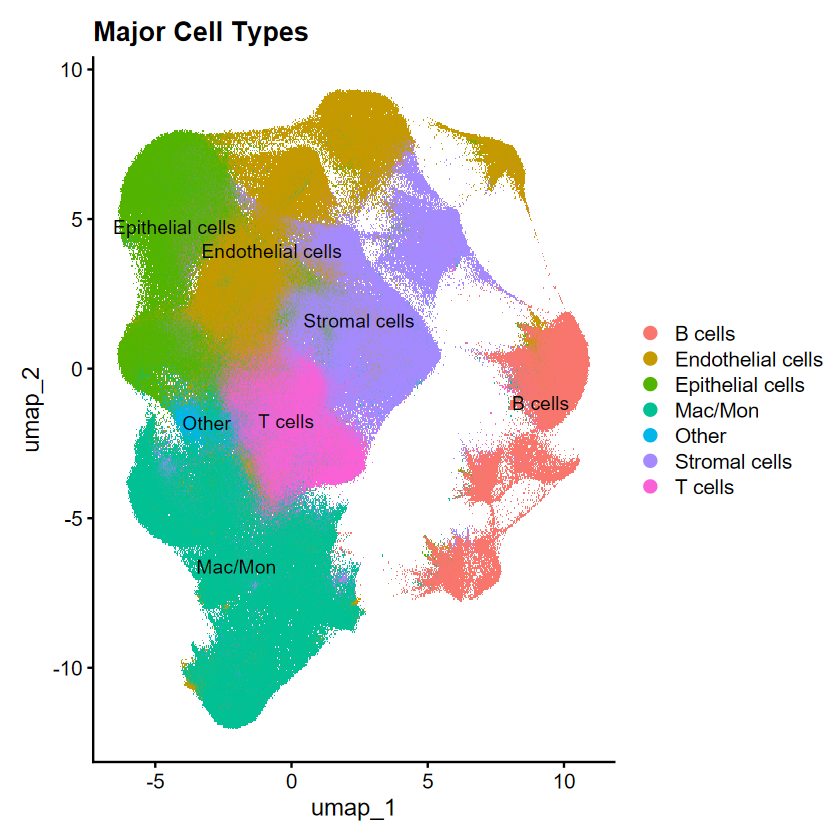

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



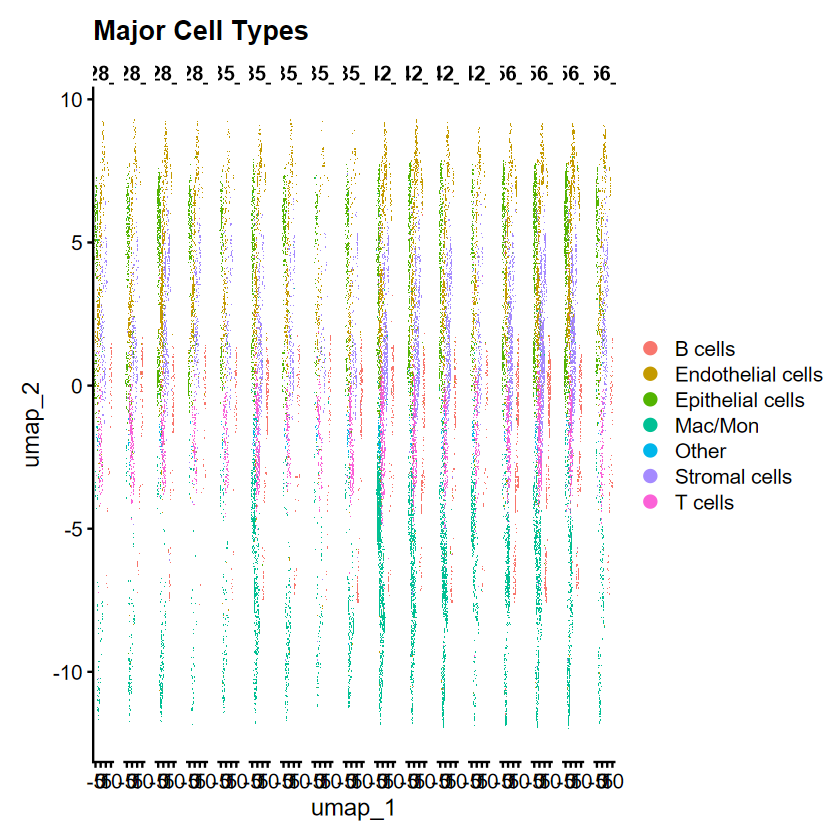

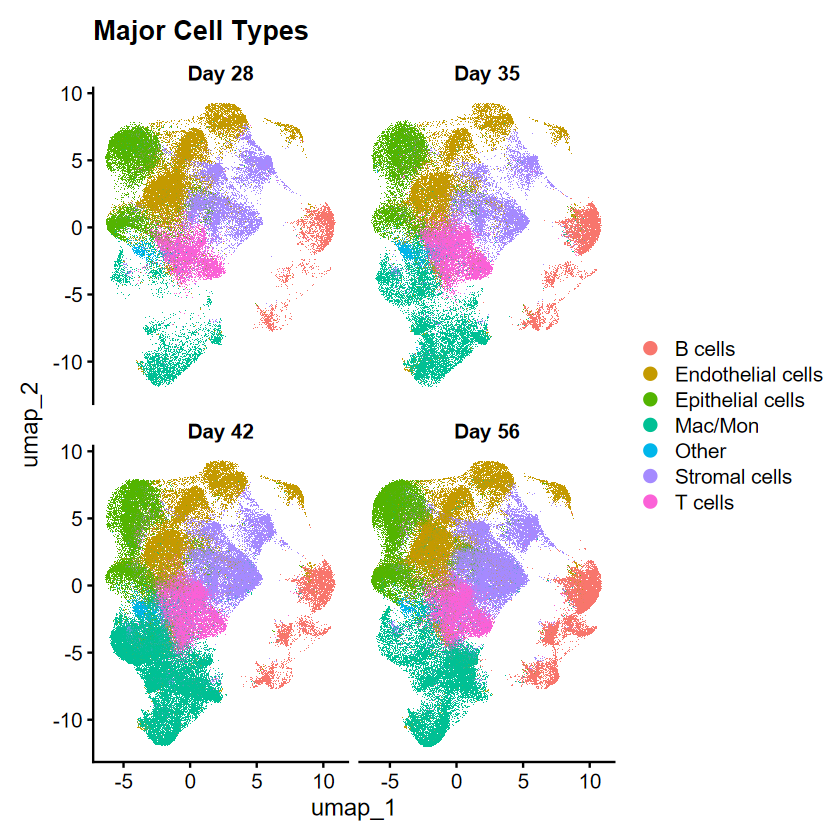

In [28]:
Idents(seurat) <- 'major_cell_types'
DimPlot(seurat, reduction = "umap", label = TRUE) + ggtitle(paste0('Major Cell Types'))
ggsave('UMAP_major_cell_types.pdf', path = path)
DimPlot(seurat, reduction = "umap", label = F, split.by = 'Sample') + ggtitle(paste0('Major Cell Types'))
ggsave('UMAP_major_cell_types_by_sample.pdf', path = path, width = 12, height = 5)
DimPlot(seurat, reduction = "umap", label = F, split.by = 'Groups', ncol = 2) + ggtitle(paste0('Major Cell Types'))
ggsave('UMAP_major_cell_types_by_group.pdf', path = path, width = 10, height = 10)



Saving 7 x 7 in image


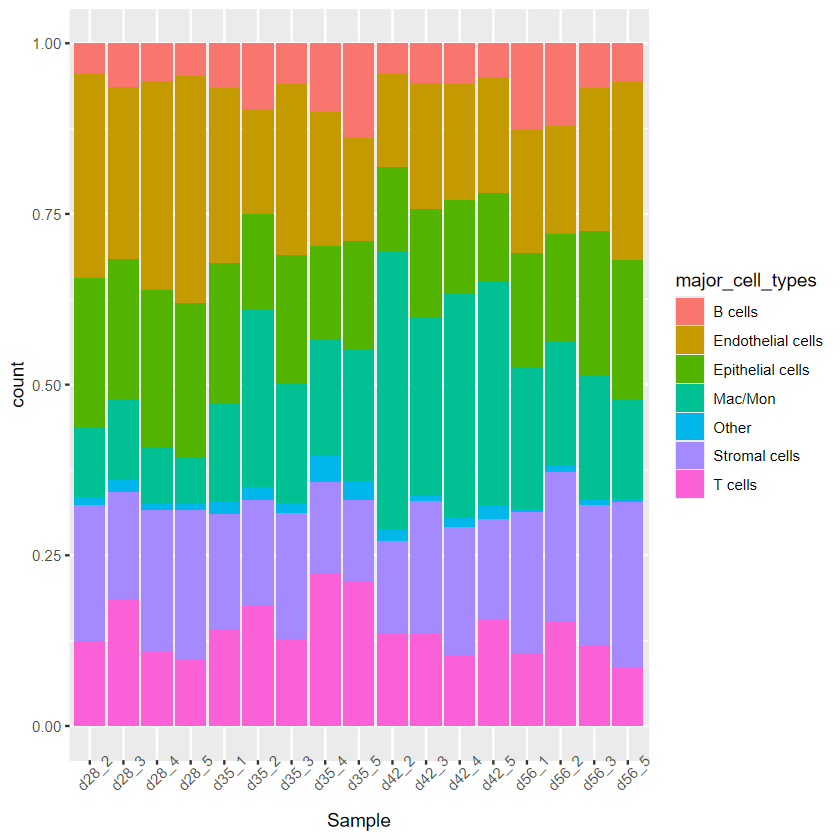

Saving 7 x 7 in image


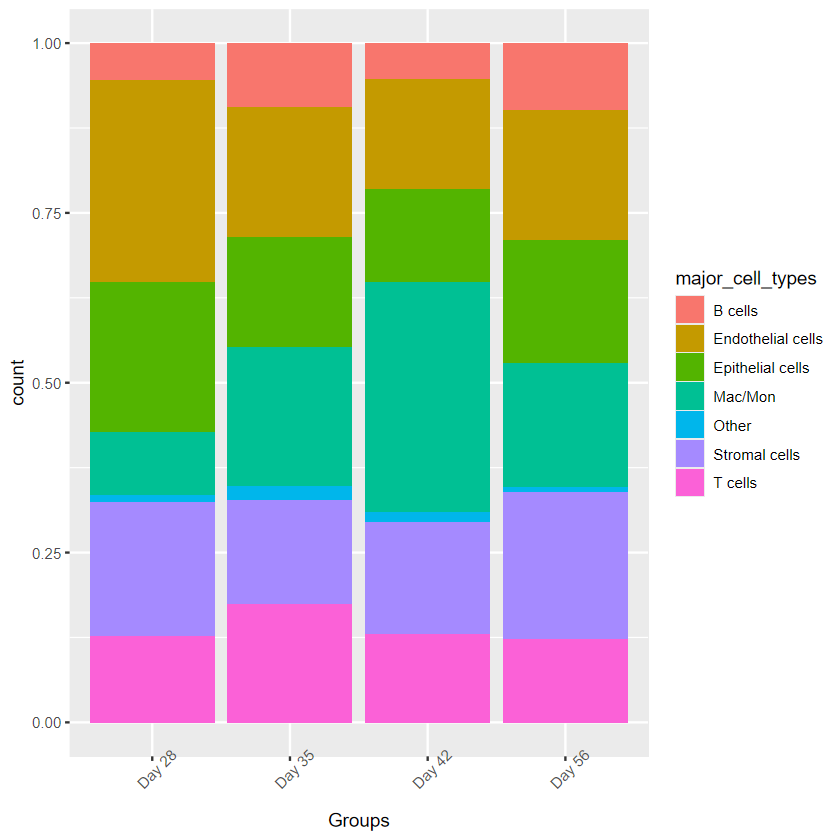

In [29]:

# Extracting cell counts for bar graphs
cell_counts <- FetchData(seurat,vars=c('major_cell_types', "Sample")) 
cell_counts <- arrange(cell_counts, Sample)


counts <- cell_counts %>% add_count(Sample, name='total_cell_count_by_sample') #%>%  ungroup() %>% arrange( major_cell_types , desc(hash.ID) ) #%>% arrange('major_cell_types')

counts <- counts %>% 
    dplyr::count(major_cell_types, Sample, total_cell_count_by_sample,name='cluster_count')  |> 
        mutate(frequency_within_sample=cluster_count*100/total_cell_count_by_sample)  |> 
        mutate(Sample = as.character(Sample)) |> 

        arrange( Sample, desc(Sample)) #%>% arrange('major_cell_types')

new_counts <- counts |> 
    arrange(Sample) |>     
    pivot_wider(id_cols = major_cell_types, names_from = 'Sample', values_from = frequency_within_sample)
    
write.csv(new_counts,file=paste0(path,"number of cells per cluster per condition.csv"),row.names=F)

# Barplot of proportion of cells in each cluster by sample
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Sample, fill=major_cell_types), position=position_fill())+ theme(axis.text.x = element_text(angle = 45, vjust = 1))
ggsave(paste0(path, 'cells_per_major_cell_type_per_sample.pdf'))
    
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Groups, fill=major_cell_types), position=position_fill()) + theme(axis.text.x = element_text(angle = 45, vjust = 1)) 
ggsave(paste0(path, 'cells_per_major_cell_type_per_group.pdf'))

## Extracting cluster annotations

In [30]:
local_path <- paste0(path, 'Xenium_explorer_annotations/')
unlink(local_path,recursive = T)
dir.create(local_path)
metadata_variable <- 'major_cell_types'

for (image in levels(seurat$Samples)) {
    local_path2 <- paste0(local_path, image, '/')
    dir.create(local_path2)

    seurat_small <- subset(seurat, subset = Samples == image)
    table <- seurat_small@meta.data  |> dplyr::select(all_of(metadata_variable)) |> rownames_to_column('cell_id')
    table <- table |>
        separate_wider_delim(cell_id, '_', names = 'cell_id', too_many = 'drop') |> rename('group' = metadata_variable)
    write.csv(table, paste0(local_path2, image, '_major_cell_types' ,'.csv'), row.names = F)    

}


Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating

In [31]:
levels(seurat$Samples)

[1] "d28_2" "d28_3" "d28_4" "d28_5" "d35_1" "d35_2" "d35_3" "d35_4" "d35_5"
[10] "d42_2" "d42_3" "d42_4" "d42_5" "d56_1" "d56_2" "d56_3" "d56_5"

## Saving objects

In [10]:
local_path <- 'Z:/xenium_Ivan/cell_type_subclustering/'

for (cell_type in unique(seurat$major_cell_types_no_spaces)) {
    if (cell_type %in% c('Stromal_cells', 'Epithelial_cells', 'Other')) {
        seurat_small <- subset(seurat, subset = (major_cell_types_no_spaces == cell_type | major_cell_types_no_spaces == 'Other'))    
        print(unique(seurat_small$major_cell_types_no_spaces))
        saveRDS(seurat_small, file = paste0(local_path, 'Xenium_Ivan_merged_', cell_type, '.rds'))
    } else {
        seurat_small <- subset(seurat, subset = major_cell_types_no_spaces == cell_type)    
        print(unique(seurat_small$major_cell_types_no_spaces))
        saveRDS(seurat_small, file = paste0(local_path, 'Xenium_Ivan_merged_', cell_type, '.rds'))
    }
}


Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not 

[1] Macrophages
7 Levels: B_cells Endothelial_cells Epithelial_cells Macrophages ... T_cells


Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not 

[1] Stromal_cells Other        
7 Levels: B_cells Endothelial_cells Epithelial_cells Macrophages ... T_cells


Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not 

[1] Epithelial_cells Other           
7 Levels: B_cells Endothelial_cells Epithelial_cells Macrophages ... T_cells


Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not 

[1] Endothelial_cells
7 Levels: B_cells Endothelial_cells Epithelial_cells Macrophages ... T_cells


Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not 

[1] T_cells
7 Levels: B_cells Endothelial_cells Epithelial_cells Macrophages ... T_cells


Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not 

[1] B_cells
7 Levels: B_cells Endothelial_cells Epithelial_cells Macrophages ... T_cells


Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not 

[1] Other
7 Levels: B_cells Endothelial_cells Epithelial_cells Macrophages ... T_cells


In [32]:
saveRDS(seurat, 'Xenium_Ivan_merged_clustered.rds')

## Writing scripts for subclustering

In [20]:
local_path <- 'Z:/xenium_Ivan/cell_type_subclustering/'

for (cell_type in unique(seurat$major_cell_types_no_spaces)) {

    text_to_write <- c("library(Seurat)",
        "options(future.globals.maxSize = 100000000000)",
        paste0("seurat <- readRDS('Xenium_Ivan_merged_", cell_type, ".rds')"),
        "seurat <- SCTransform(seurat, assay = 'Xenium')",
        "seurat <- RunPCA(seurat, npcs = 200, features = rownames(seurat))" ,
        "dimensions <- 30",
        "resolutions <- c(0.1, 0.2, 0.3, 0.4, 0.5, 1)",
        "seurat <- RunUMAP(seurat, dims = 1:dimensions)",
        "seurat <- FindNeighbors(seurat, reduction = 'pca', dims = 1:dimensions)",
        "seurat <- FindClusters(seurat, resolution = resolutions)",
        paste0("saveRDS(seurat, 'Xenium_Ivan_", cell_type,"_d30.rds')"))    

    file_connection <- file(paste0(local_path, 'Xenium_', cell_type, '.r'))
    writeLines(paste(text_to_write, collapse = '\n'), file_connection)
    close(file_connection)

    text_to_write <-c("#!/bin/bash",
        paste0("#SBATCH --job-name=job_", cell_type, "_d30"),
        paste0("#SBATCH --output=job_", cell_type, "_d30"),
        "#SBATCH --ntasks=1",
        "#SBATCH --cpus-per-task=1",
        "#SBATCH --mem-per-cpu=512G",
        "#SBATCH --begin=2024-12-14T13:00:00",
        "module load r r-seurat/5.0.2-cvsxfnf",
        paste0("Rscript ", 'Xenium_', cell_type, '.r'))

    file_connection <- file(paste0(local_path, 'job_command_EA_', cell_type, '.sh'))
    writeLines(paste(text_to_write, collapse = '\n'), file_connection)
    close(file_connection)

}


## Checking dimensionality after clustering cell types on skyline server

Saving 7 x 7 in image


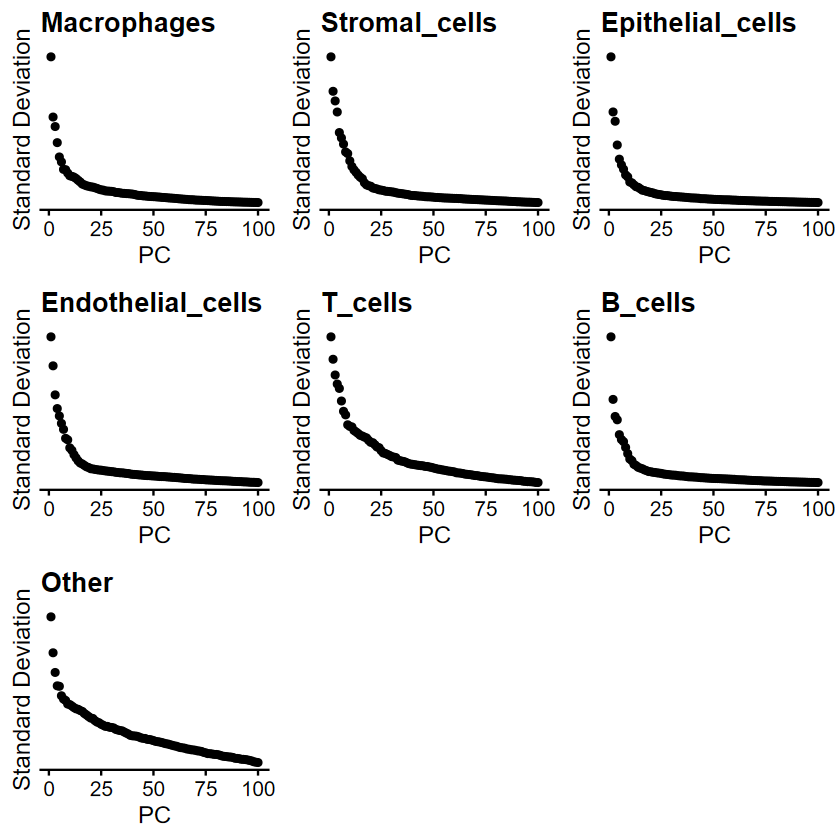

In [32]:
local_path <- 'Z:/xenium_Ivan/cell_type_subclustering/'

p <- list()
i <- 1

for ( cell_type in unique(seurat$major_cell_types_no_spaces) ) {
    seurat_small <- readRDS(paste0(local_path, 'Xenium_Ivan_', cell_type, '_d30.rds'))
    p2 <- ElbowPlot(seurat_small, ndims = 100) + ggtitle(cell_type) + theme(legend.position = "none") + scale_y_continuous(breaks = c(seq(0, 100, by = 20)))
    p[[i]] <- p2
    i <- i+1
}

plot <- grid.arrange(grobs = p)
ggsave('Checking_dimensionality_of_cell_type_subclustering.pdf', path = path, plot = plot)

# Macrophage analysis

## Initialization

In [8]:
path <- './Macrophage_analysis/'
#unlink(path, recursive = T)
dir.create(path)

Warning message in dir.create(path):
"'.\Macrophage_analysis' already exists"


In [115]:
seurat <- readRDS(paste0('Z:/xenium_Ivan/cell_type_subclustering/', "Xenium_Ivan_Macrophages_d30.rds"))
#seurat <- readRDS('Xenium_Ivan_Macrophages.rds')

## Preprocessing

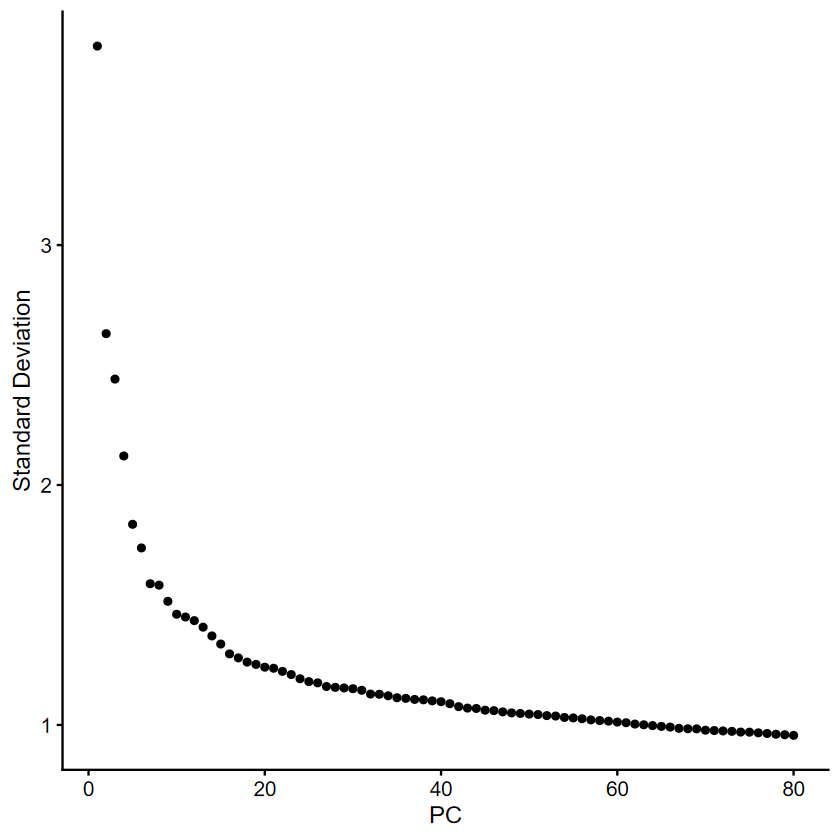

In [116]:
ElbowPlot(seurat,ndims = 80)

In [117]:
dimensions <- 30
resolutions <-c(0.1, 0.2, 0.3, 0.4, 0.5, 1)


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image


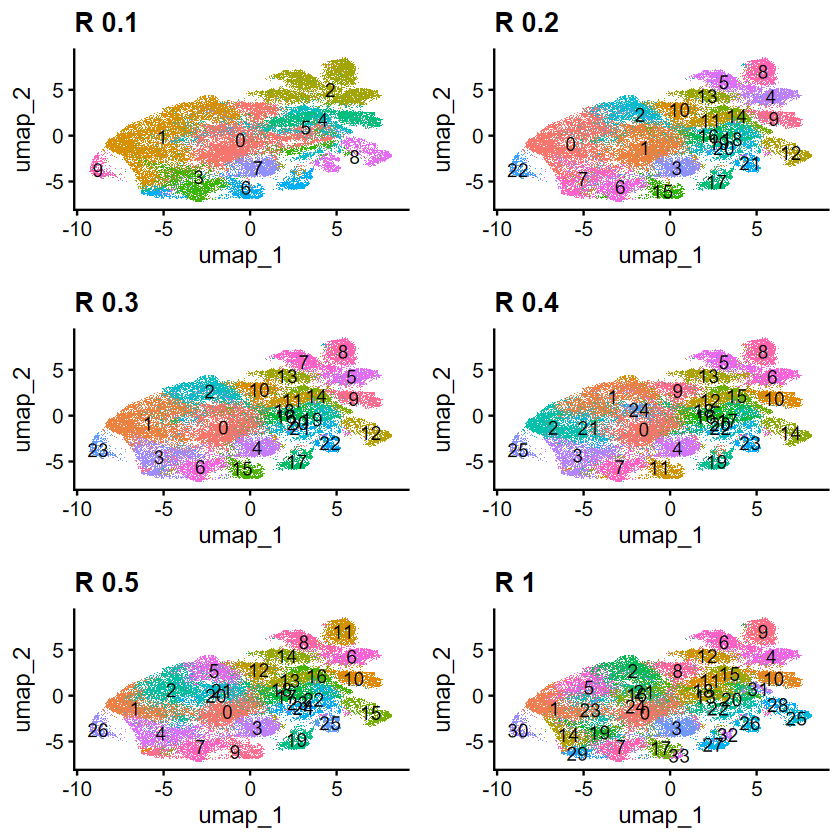

In [118]:
p <- list()
i <- 1
for (resolution in resolutions ) {
    Idents(seurat) <- paste0('SCT_snn_res.', resolution) 
    p2 <- DimPlot(seurat, reduction = "umap", label = TRUE) + ggtitle(paste0('R ', resolution)) + theme(legend.position = "none")    
    p[[i]] <- p2
    i <- i+1
}

plot <- grid.arrange(grobs = p)
ggsave('clustering_results_by_resolution.pdf', path = path, plot = plot)

## Chosen resolution and dimensions

In [119]:
dimensions <- 30
resolution <- 0.2
#seurat <- readRDS('Z:/xenium_Ivan/Xenium_Ivan_2024_merged_dim_40.rds')

## Initial plots and calculations

[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14"
[16] "15" "16" "17" "18" "19" "20" "21" "22"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



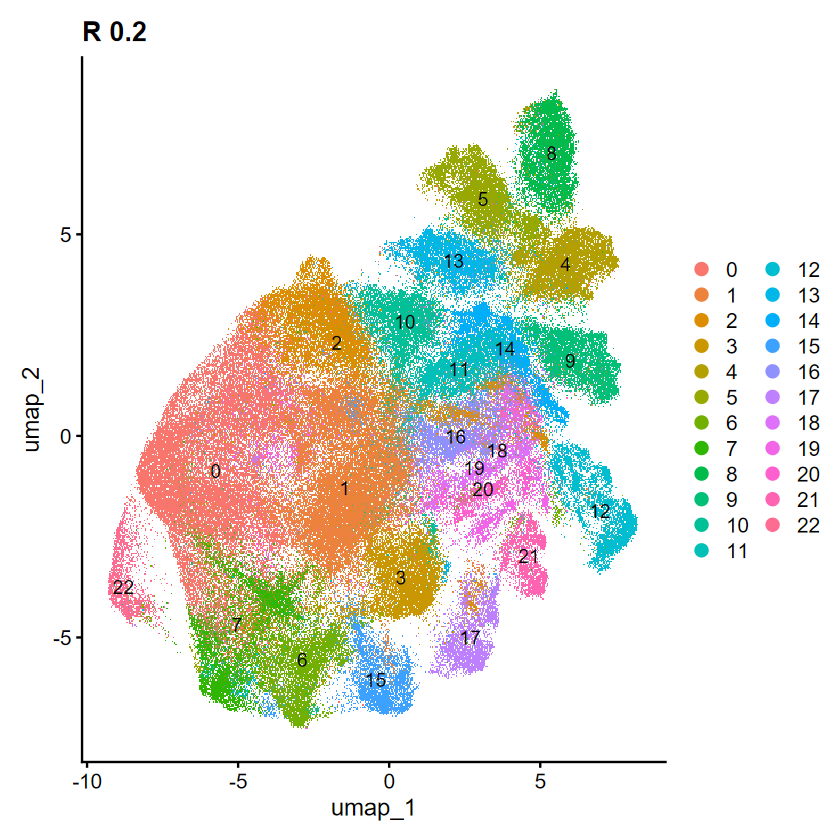

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



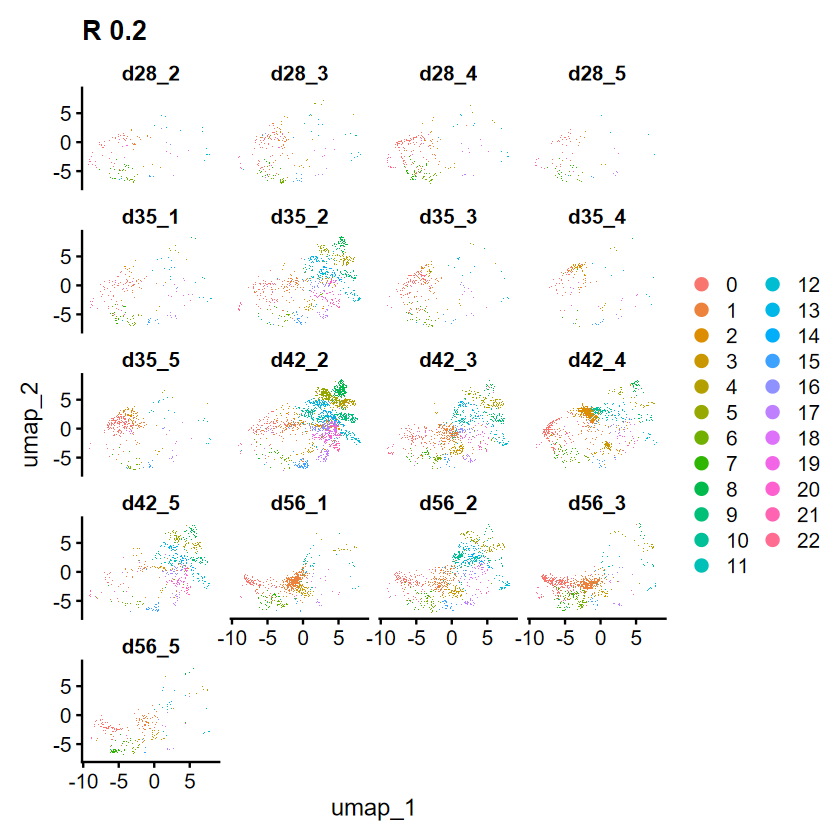

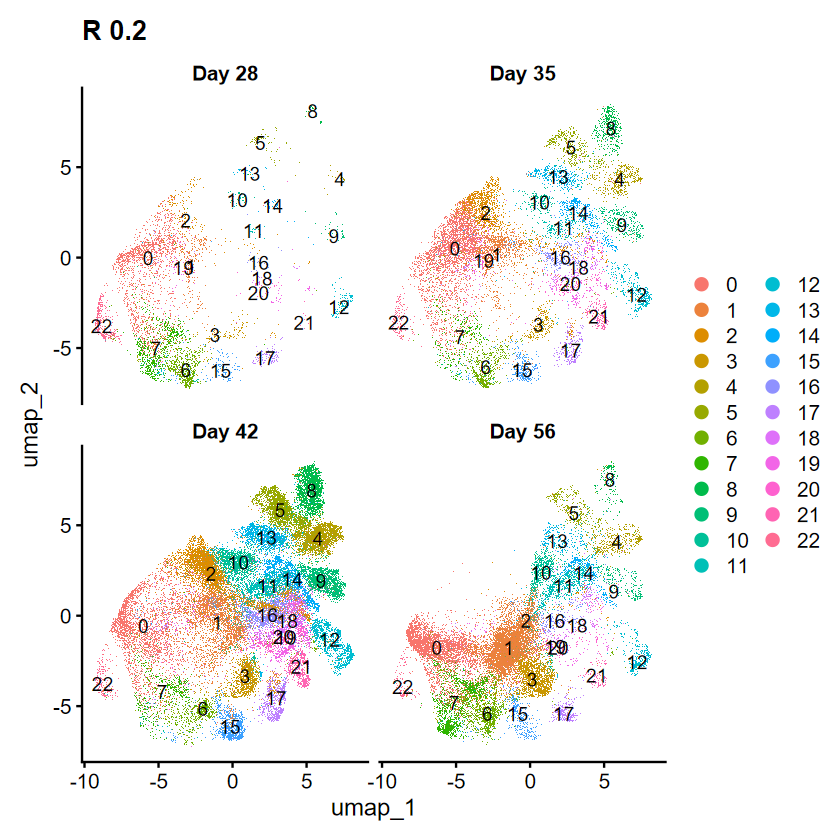

In [120]:
Idents(seurat) <- paste0('SCT_snn_res.', resolution)
seurat[['seurat_clusters']]<- Idents(seurat)

seurat@meta.data <- seurat@meta.data |>
    mutate(
        seurat_clusters = factor(seurat_clusters, levels = c('0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22'))
    )

levels(seurat$seurat_clusters)
Idents(seurat) <- 'seurat_clusters'
DimPlot(seurat, reduction = "umap", label = TRUE) + ggtitle(paste0('R ', resolution))
ggsave('UMAP.pdf', path = path)
DimPlot(seurat, reduction = "umap", label = FALSE, split.by = 'Samples', ncol = 4) + ggtitle(paste0('R ', resolution))
ggsave('UMAP_by_sample.pdf', path = path, width = 12, height = 10)
DimPlot(seurat, reduction = "umap", label = TRUE, split.by = 'Groups', ncol = 2) + ggtitle(paste0('R ', resolution))
ggsave('UMAP_by_group.pdf', path = path, width = 10, height = 10)

Saving 7 x 7 in image


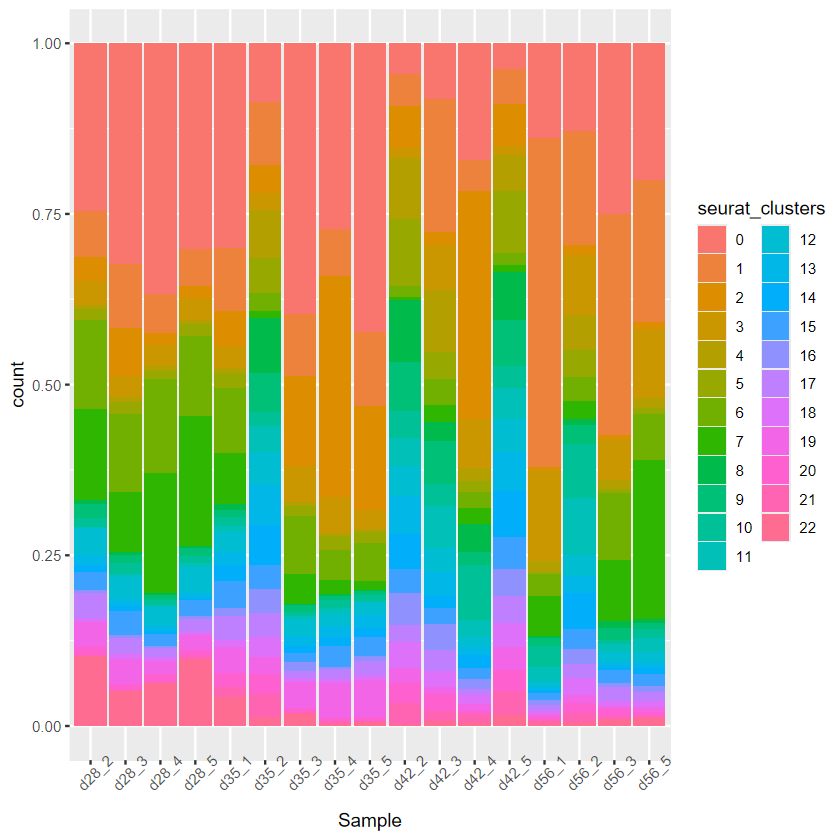

Saving 7 x 7 in image


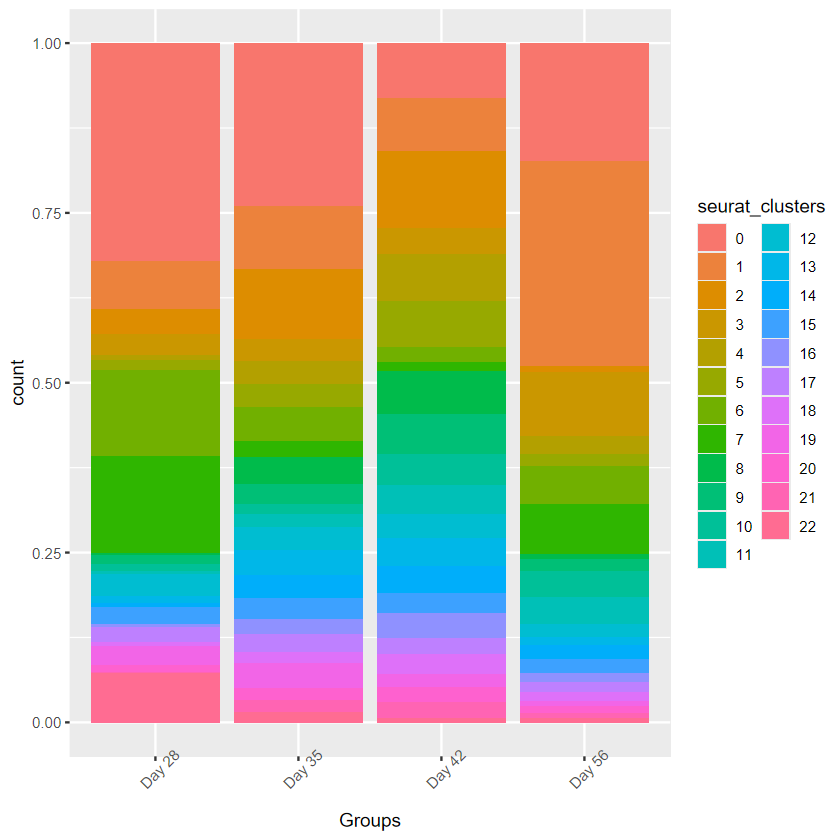

In [121]:

# Extracting cell counts for bar graphs
cell_counts <- FetchData(seurat,vars=c('seurat_clusters', "Sample")) 
cell_counts <- arrange(cell_counts, Sample)


counts <- cell_counts %>% add_count(Sample, name='total_cell_count_by_sample') #%>%  ungroup() %>% arrange( seurat_clusters , desc(hash.ID) ) #%>% arrange('seurat_clusters')

counts <- counts %>% 
    dplyr::count(seurat_clusters, Sample, total_cell_count_by_sample,name='cluster_count')  |> 
        mutate(frequency_within_sample=cluster_count*100/total_cell_count_by_sample)  |> 
        mutate(Sample = as.character(Sample)) |> 

        arrange( Sample, desc(Sample)) #%>% arrange('seurat_clusters')

new_counts <- counts |> 
    arrange(Sample) |>     
    pivot_wider(id_cols = seurat_clusters, names_from = 'Sample', values_from = frequency_within_sample)
    
write.csv(new_counts,file=paste0(path,"number of cells per cluster per condition.csv"),row.names=F)

# Barplot of proportion of cells in each cluster by sample
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Sample, fill=seurat_clusters), position=position_fill())+ theme(axis.text.x = element_text(angle = 45, vjust = 1))
ggsave(paste0(path, 'cells_per_cluster_per_sample.pdf'))
    
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Groups, fill=seurat_clusters), position=position_fill()) + theme(axis.text.x = element_text(angle = 45, vjust = 1)) 
ggsave(paste0(path, 'cells_per_cluster_per_group.pdf'))

## Top genes per cluster

In [122]:
# #slot(object = seurat@assays$SCT@SCTModel.list[[3]], name="umi.assay") <- 'Xenium'
# for (i in 1:17) {
#     slot(object = seurat@assays$SCT@SCTModel.list[[i]], name="umi.assay") <- 'Xenium'
# }

# SCTResults(object=seurat, slot="umi.assay")

In [123]:
object_annotations <- ''
 
Idents(seurat) <- 'seurat_clusters'

seurat <- PrepSCTFindMarkers(seurat, assay = "SCT", verbose = TRUE)
seurat.markers <- FindAllMarkers(seurat, only.pos = TRUE, min.pct = 0.01)

# saveRDS(seurat.markers, file = 'seurat.markers.rds')



#Add gene annotations:
annotations <- read.csv("M:/LPD-MIS members' data/Eduard Ansaldo/Bioinformatics/analysis_templates/annotations.csv")
seurat.markers <- seurat.markers |>
                left_join(y= unique(annotations[,c('gene_name', 'description')]),
                    by = c('gene' = 'gene_name'))

                    

#Top10 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 10) -> top10

#Top25 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 25) -> top25

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 100) -> top100

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 3) -> top3

write.table(top100,file=paste0(path,'top100',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
# write.table(top25,file=paste0(path,'top25',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
write.table(top10,file=paste0(path,'top10',object_annotations, ".tsv"), sep="\t",row.names = FALSE)


# # #Top5 markers
# seurat.markers %>%
#     group_by(cluster) %>%
#     slice_head(n = 5) -> top5
# DoHeatmap(seurat, features = top5$gene, size = 1) + NoLegend() & theme(text=element_text(size=6))
# ggsave(paste0("Heatmap_Top5_per_cluster", object_annotations, ".pdf"), path = path)

# #Top10 markers
# seurat.markers %>%
#      group_by(cluster) %>%
#      slice_head(n = 10) -> top10
#  DoHeatmap(seurat, features = top10$gene, size = 1) + NoLegend() & theme(text=element_text(size=4)) 
#  ggsave(paste0("Heatmap_Top10_per_cluster", object_annotations, ".pdf"), path = path)

gene_list_plot <- top3 |> pull(gene)

pdf(paste0(path, 'Clustered_dotplot', object_annotations, '.pdf'))
Clustered_DotPlot(seurat, features=gene_list_plot, k=length(unique(seurat$seurat_clusters)), plot_km_elbow = FALSE, cluster_ident=FALSE, ggplot_default_colors = T)
dev.off()


    

Only one SCT model is stored - skipping recalculating corrected counts

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Warning message:
"Feature list contains duplicates, making unique."


pdf 
  2

## Further analysis

In [124]:
levels(seurat$seurat_clusters)

[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14"
[16] "15" "16" "17" "18" "19" "20" "21" "22"

In [125]:
Idents(seurat) <- 'seurat_clusters'
#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 4) -> top3
    gene_list_plot <- top3 |> pull(gene)
gene_list_plot_3 <- gene_list_plot

gene_list_plot <- c(gene_list_plot_3)
gene_list_plot <- c(gene_list_plot, 'Cd68', 'Csf1r', 'Mafb', 'Itgam', 'Siglecf', 'Mertk', 'Maf', 'Spi1', 'Zeb2')

pdf(paste0(path, 'Clustered_dotplot_additional_markers', '.pdf'))
Clustered_DotPlot(seurat, features=gene_list_plot, k=length(unique(seurat$seurat_clusters)), plot_km_elbow = FALSE, cluster_ident=FALSE, ggplot_default_colors = T,column_label_size = 8,row_label_size = 6)
dev.off()

Warning message:
"Feature list contains duplicates, making unique."
Warning message:
"The following features were omitted as they were not found:
ℹ Siglecf"


pdf 
  2

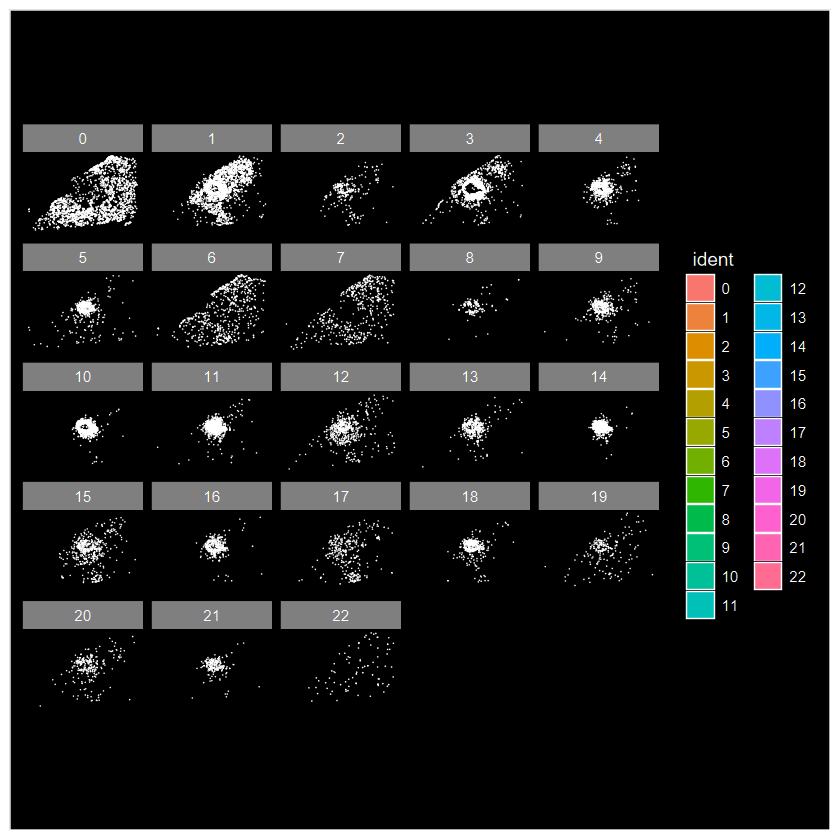

In [126]:
ImageDimPlot(seurat, fov = 'fov_d56_2', split.by = 'seurat_clusters', size = 0.02, alpha = 0.1)
ggsave('D_56_ImageDimPlot.png', width = 10, height = 10, path = path)

## Automatic cell annotation

Warning message in ImmGenData(ensembl = FALSE):
"'ImmGenData' is deprecated.
Use 'celldex::ImmGenData' instead.
See help("Deprecated")"


Warning message:
"Layer 'data' is empty"
Warning message:
"Layer 'scale.data' is empty"
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



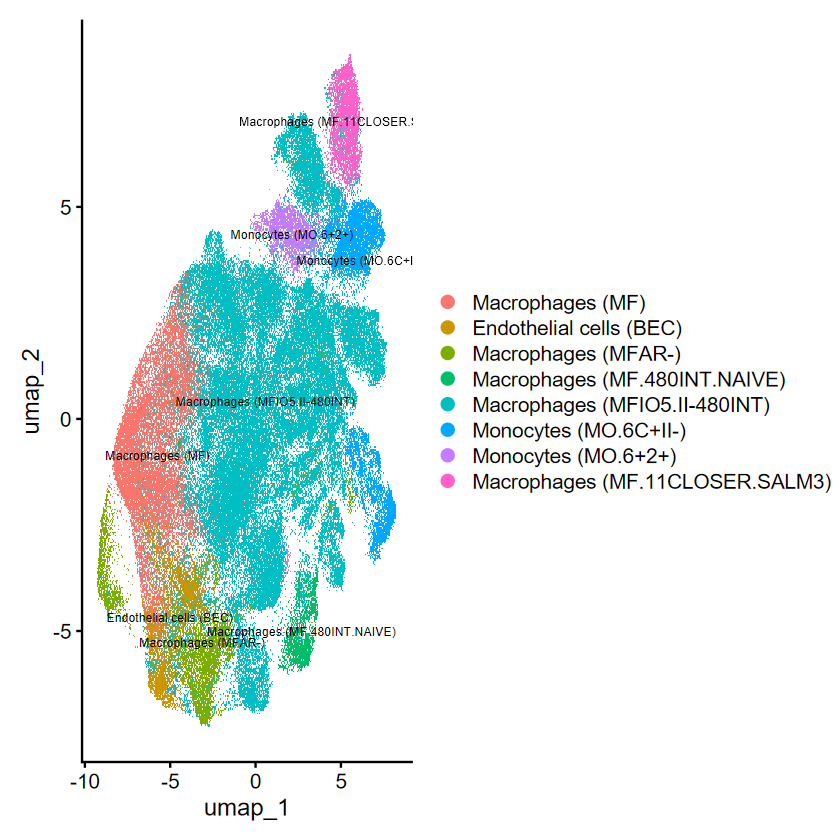

In [127]:
immgen <- ImmGenData(ensembl = FALSE)
predictions_cluster <- SingleR(test = as.SingleCellExperiment(seurat), assay.type.test = 1, ref = immgen, labels = immgen$label.fine, cluster = seurat$seurat_clusters)

row.names <- rownames(predictions_cluster)

predictions_cluster <- predictions_cluster |>
    as_tibble() |> 
    dplyr::select(c('labels')) 

predictions_cluster$cluster <- row.names

#predictions_cluster <- predictions_cluster |> rename('labels_per_cluster' = 'labels')

annotations <- seurat@meta.data |>
    left_join(predictions_cluster, by = join_by('seurat_clusters' == 'cluster')) |>
    pull(labels)

seurat$labels_per_cluster <- annotations

Idents(seurat) <- 'labels_per_cluster'
DimPlot(seurat, label = T, label.size = 2.5)
ggsave(paste0('UMAP_cluster_SingleR_annotations','.pdf'), path = path, width = 8, height = 5)
# DimPlot(seurat, label = T, label.size = 2.5, split.by = 'Groups')
# ggsave(paste0('UMAP_cluster_SingleR_annotations_by_group_R_0_15','.pdf'), path = path, width = 13, height = 5)

### Annotations per cell

In [ ]:
immgen <- ImmGenData(ensembl = FALSE)
predictions_cell_basis <- SingleR(test = as.SingleCellExperiment(seurat), assay.type.test = 1, ref = immgen, labels = immgen$label.main)

predictions_cell_basis <- predictions_cell_basis |>
    as_tibble() |> 
    dplyr::select(c('labels')) 

predictions_cell_basis <- predictions_cell_basis |> rename('labels_per_cell_coarse' = 'labels')

seurat$labels_per_cell_coarse <- predictions_cell_basis |> pull(labels_per_cell_coarse)
    
Idents(seurat) <- 'labels_per_cell_coarse'
DimPlot_scCustom(seurat, label = F)#+ theme(legend.position = 'none')
ggsave(paste0('UMAP_cell_SingleR_annotations_coarse','.pdf'), path = path, width = 5, height = 5)



In [ ]:
immgen <- ImmGenData(ensembl = FALSE)
predictions_cell_basis <- SingleR(test = as.SingleCellExperiment(seurat), assay.type.test = 1, ref = immgen, labels = immgen$label.fine)

predictions_cell_basis <- predictions_cell_basis |>
    as_tibble() |> 
    dplyr::select(c('labels')) 

predictions_cell_basis <- predictions_cell_basis |> rename('labels_per_cell_fine' = 'labels')

seurat$labels_per_cell_fine <- predictions_cell_basis |> pull(labels_per_cell_fine)
    
Idents(seurat) <- 'labels_per_cell_fine'
DimPlot_scCustom(seurat, label = F)#+ theme(legend.position = 'none')
ggsave(paste0('UMAP_cell_SingleR_annotations_fine','.pdf'), path =path, width = 35, height = 5)



## Renaming clusters

In [262]:
Idents(seurat) <- 'seurat_clusters'

seurat <- RenameIdents(seurat,

    '0'	 =  'Other/distal',
    '1'	 =  'Gpnmb+',
    '2'	 =  'Arg1+',
    '3'	 =  'Gpnmb+',
    '4'	 =  'Marcksl1+',
    '5'	 =  'Cd24a+',
    '6'	 =  'Other/distal',
    '7'	 =  'Other/distal',
    '8'	 =  'Cxcl10+',
    '9'	 =  'Oasl2+',
    '10' = 	'Arg1+',
    '11' = 	'Cd14+',
    '12' = 	'Mxd1+',
    '13' = 	'Socs3+',
    '14' = 	'Il1rn+',
    '15' = 	'Cd274+',
    '16' = 	'Il1rn+',
    '17' = 	'Gpb2+',
    '18' = 	'Il1rn+',
    '19' = 	'Il1rn+',
    '20' = 	'Il1rn+',
    '21' = 	'Acod1+',
    '22' = 	'Other/distal'


)

seurat[['cell_types']] <- Idents(seurat)

seurat@meta.data <- seurat@meta.data |> mutate(cell_types = factor(cell_types, levels = str_sort(unique(seurat$cell_types))))

new_levels <- c(setdiff(levels(seurat$cell_types), 'Other/distal'), 'Other/distal')

seurat@meta.data <- seurat@meta.data |> mutate(cell_types = factor(cell_types, levels = new_levels))

# setdiff()

In [9]:
Idents(seurat) <- 'seurat_clusters'

seurat <- RenameIdents(seurat,

    '0'	 =  'M4',
    '1'	 =  'M3',
    '2'	 =  'M3',
    '3'	 =  'M3',
    '4'	 =  'M1',
    '5'	 =  'M1',
    '6'	 =  'M4',
    '7'	 =  'M4',
    '8'	 =  'M1',
    '9'	 =  'M1',
    '10' = 	'M3',
    '11' = 	'M2',
    '12' = 	'M1',
    '13' = 	'M1',
    '14' = 	'M2',
    '15' = 	'M2',
    '16' = 	'M2',
    '17' = 	'M2',
    '18' = 	'M2',
    '19' = 	'M2',
    '20' = 	'M2',
    '21' = 	'M2',
    '22' = 	'M4'


)

seurat[['four_subsets']] <- Idents(seurat)

seurat@meta.data <- seurat@meta.data |> mutate(four_subsets = factor(four_subsets, levels = str_sort(unique(seurat$four_subsets))))



# setdiff()

In [10]:
levels(seurat$cell_types)
levels(seurat$four_subsets)

[1] "Acod1+"       "Arg1+"        "Cd14+"        "Cd24a+"       "Cd274+"      
 [6] "Cxcl10+"      "Gpb2+"        "Gpnmb+"       "Il1rn+"       "Marcksl1+"   
[11] "Mxd1+"        "Oasl2+"       "Socs3+"       "Other/distal"

[1] "M1" "M2" "M3" "M4"

In [153]:
colnames(seurat@meta.data)
seurat@meta.data <- seurat@meta.data |>
    dplyr::select(-contains('<-'))
colnames(seurat@meta.data)

[1] "orig.ident"                 "nCount_Xenium"             
 [3] "nFeature_Xenium"            "segmentation_method"       
 [5] "nCount_BlankCodeword"       "nFeature_BlankCodeword"    
 [7] "nCount_ControlCodeword"     "nFeature_ControlCodeword"  
 [9] "nCount_ControlProbe"        "nFeature_ControlProbe"     
[11] "nCount_GenomicControl"      "nFeature_GenomicControl"   
[13] "slide"                      "Sample"                    
[15] "nCount_SCT"                 "nFeature_SCT"              
[17] "SCT_snn_res.0.05"           "SCT_snn_res.0.1"           
[19] "SCT_snn_res.0.15"           "SCT_snn_res.0.2"           
[21] "SCT_snn_res.0.3"            "seurat_clusters"           
[23] "labels_per_cluster"         "Groups"                    
[25] "Samples"                    "major_cell_types"          
[27] "major_cell_types_no_spaces" "SCT_snn_res.0.4"           
[29] "SCT_snn_res.0.5"            "SCT_snn_res.1"             
[31] "cell_types"

[1] "orig.ident"                 "nCount_Xenium"             
 [3] "nFeature_Xenium"            "segmentation_method"       
 [5] "nCount_BlankCodeword"       "nFeature_BlankCodeword"    
 [7] "nCount_ControlCodeword"     "nFeature_ControlCodeword"  
 [9] "nCount_ControlProbe"        "nFeature_ControlProbe"     
[11] "nCount_GenomicControl"      "nFeature_GenomicControl"   
[13] "slide"                      "Sample"                    
[15] "nCount_SCT"                 "nFeature_SCT"              
[17] "SCT_snn_res.0.05"           "SCT_snn_res.0.1"           
[19] "SCT_snn_res.0.15"           "SCT_snn_res.0.2"           
[21] "SCT_snn_res.0.3"            "seurat_clusters"           
[23] "labels_per_cluster"         "Groups"                    
[25] "Samples"                    "major_cell_types"          
[27] "major_cell_types_no_spaces" "SCT_snn_res.0.4"           
[29] "SCT_snn_res.0.5"            "SCT_snn_res.1"             
[31] "cell_types"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



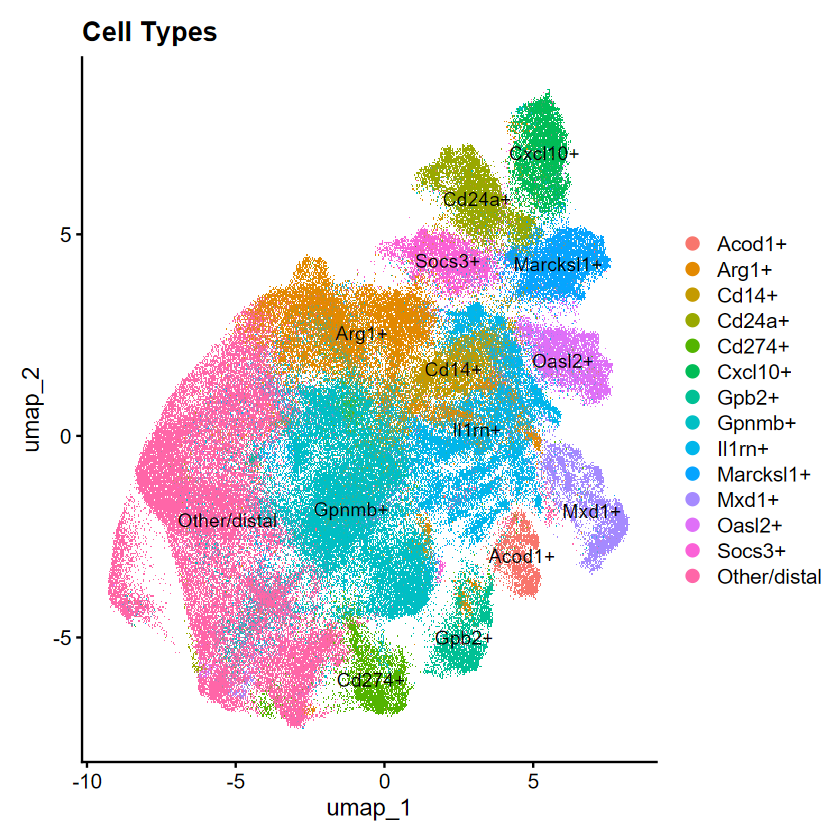

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



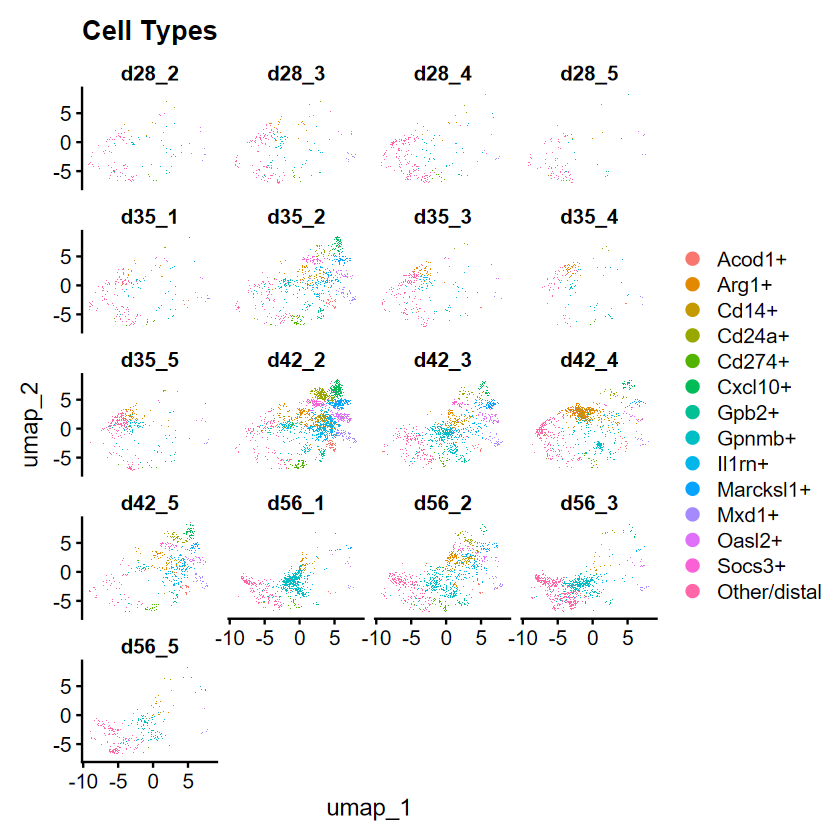

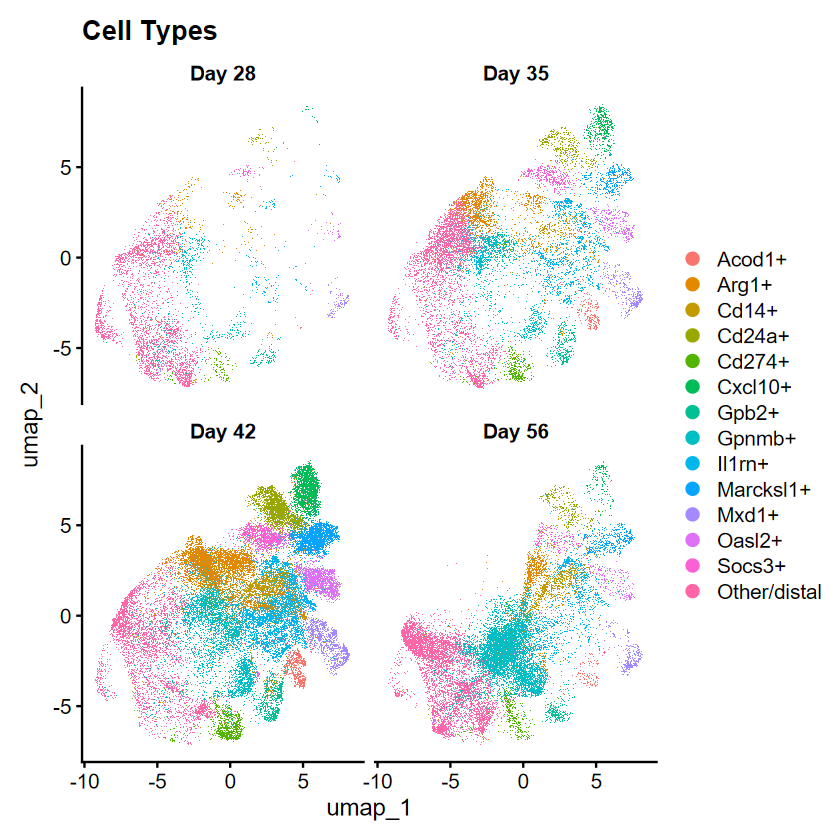

In [264]:
Idents(seurat) <- 'cell_types'
DimPlot(seurat, reduction = "umap", label = TRUE) + ggtitle(paste0('Cell Types'))
ggsave('UMAP_cell_types.pdf', path = path)
DimPlot(seurat, reduction = "umap", label = F, split.by = 'Sample', ncol = 4) + ggtitle(paste0('Cell Types'))
ggsave('UMAP_cell_types_by_sample.pdf', path = path, width = 12, height = 5)
DimPlot(seurat, reduction = "umap", label = F, split.by = 'Groups', ncol = 2) + ggtitle(paste0('Cell Types'))
ggsave('UMAP_cell_types_by_group.pdf', path = path, width = 10, height = 10)



Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



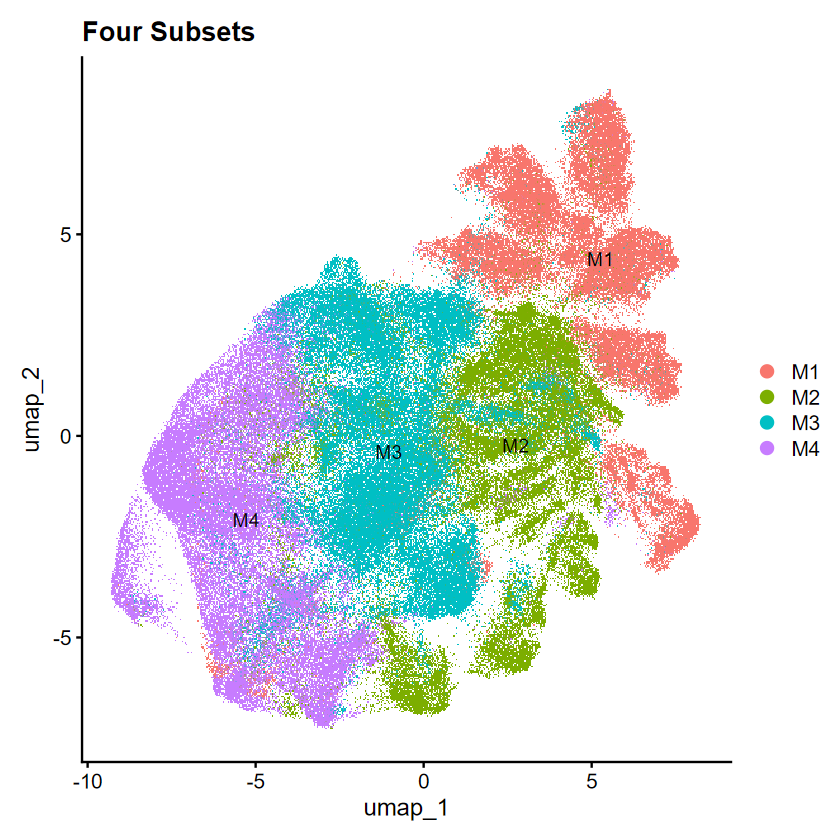

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



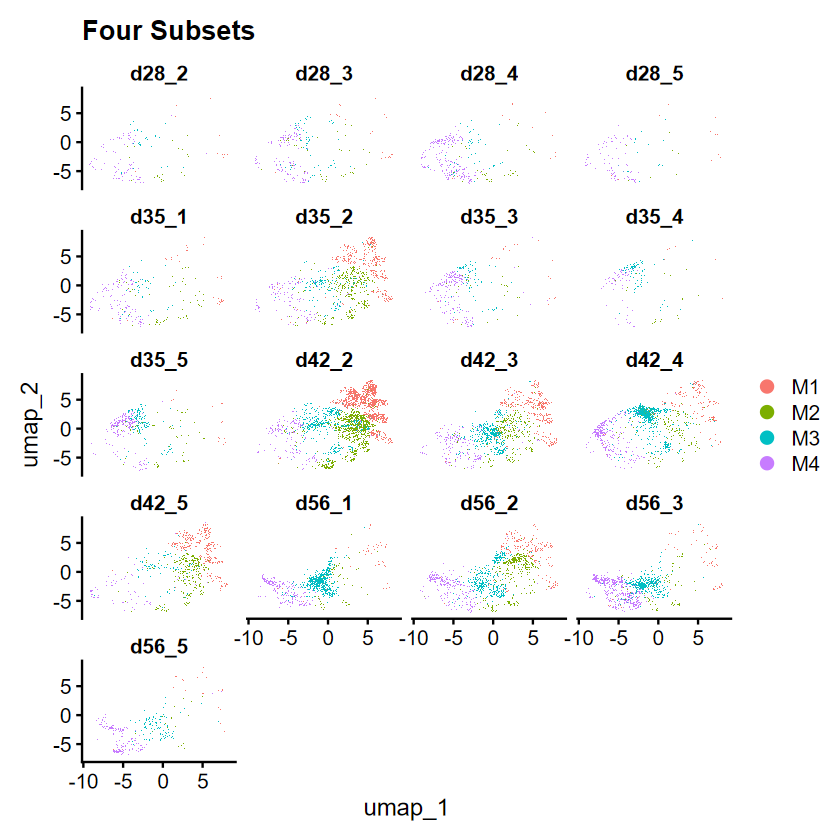

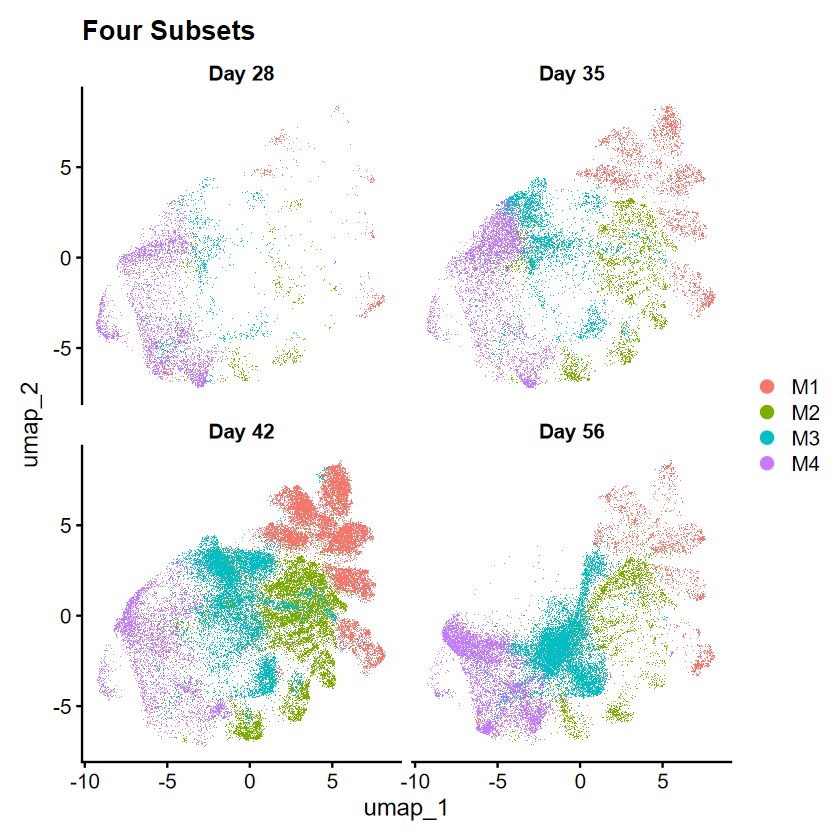

In [11]:
Idents(seurat) <- 'four_subsets'
DimPlot(seurat, reduction = "umap", label = TRUE) + ggtitle(paste0('Four Subsets'))
ggsave('UMAP_four_subsets.pdf', path = path)
DimPlot(seurat, reduction = "umap", label = F, split.by = 'Sample', ncol = 4) + ggtitle(paste0('Four Subsets'))
ggsave('UMAP_four_subsets_by_sample.pdf', path = path, width = 12, height = 5)
DimPlot(seurat, reduction = "umap", label = F, split.by = 'Groups', ncol = 2) + ggtitle(paste0('Four Subsets'))
ggsave('UMAP_four_subsets_by_group.pdf', path = path, width = 10, height = 10)



Saving 7 x 7 in image


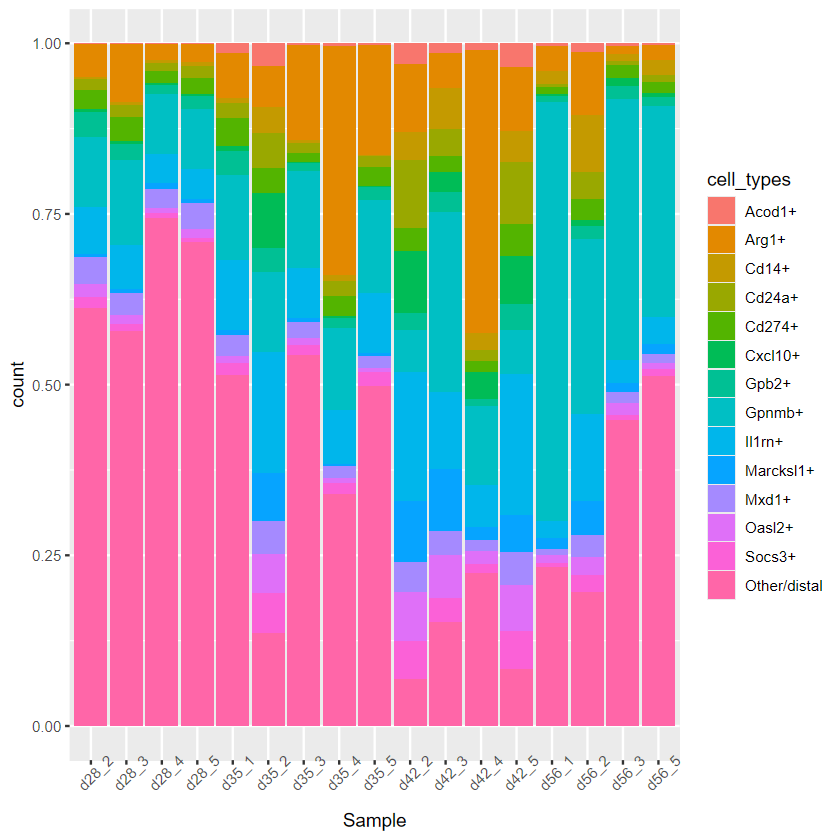

Saving 7 x 7 in image


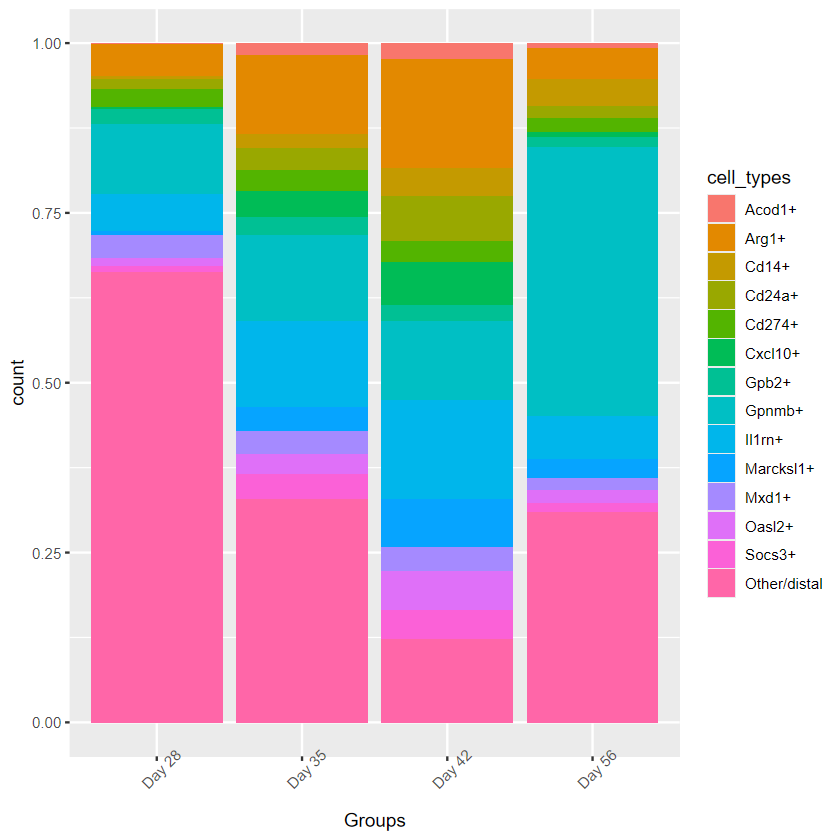

In [161]:

# Extracting cell counts for bar graphs
cell_counts <- FetchData(seurat,vars=c('cell_types', "Sample")) 
cell_counts <- arrange(cell_counts, Sample)


counts <- cell_counts %>% add_count(Sample, name='total_cell_count_by_sample') #%>%  ungroup() %>% arrange( cell_types , desc(hash.ID) ) #%>% arrange('cell_types')

counts <- counts %>% 
    dplyr::count(cell_types, Sample, total_cell_count_by_sample,name='cluster_count')  |> 
        mutate(frequency_within_sample=cluster_count*100/total_cell_count_by_sample)  |> 
        mutate(Sample = as.character(Sample)) |> 

        arrange( Sample, desc(Sample)) #%>% arrange('cell_types')

new_counts <- counts |> 
    arrange(Sample) |>     
    pivot_wider(id_cols = cell_types, names_from = 'Sample', values_from = frequency_within_sample)
    
write.csv(new_counts,file=paste0(path,"number of cells per cell_type per condition.csv"),row.names=F)

# Barplot of proportion of cells in each cluster by sample
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Sample, fill=cell_types), position=position_fill())+ theme(axis.text.x = element_text(angle = 45, vjust = 1))
ggsave(paste0(path, 'cells_per_cell_type_per_sample.pdf'))
    
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Groups, fill=cell_types), position=position_fill()) + theme(axis.text.x = element_text(angle = 45, vjust = 1)) 
ggsave(paste0(path, 'cells_per_cell_type_per_group.pdf'))

Saving 7 x 7 in image


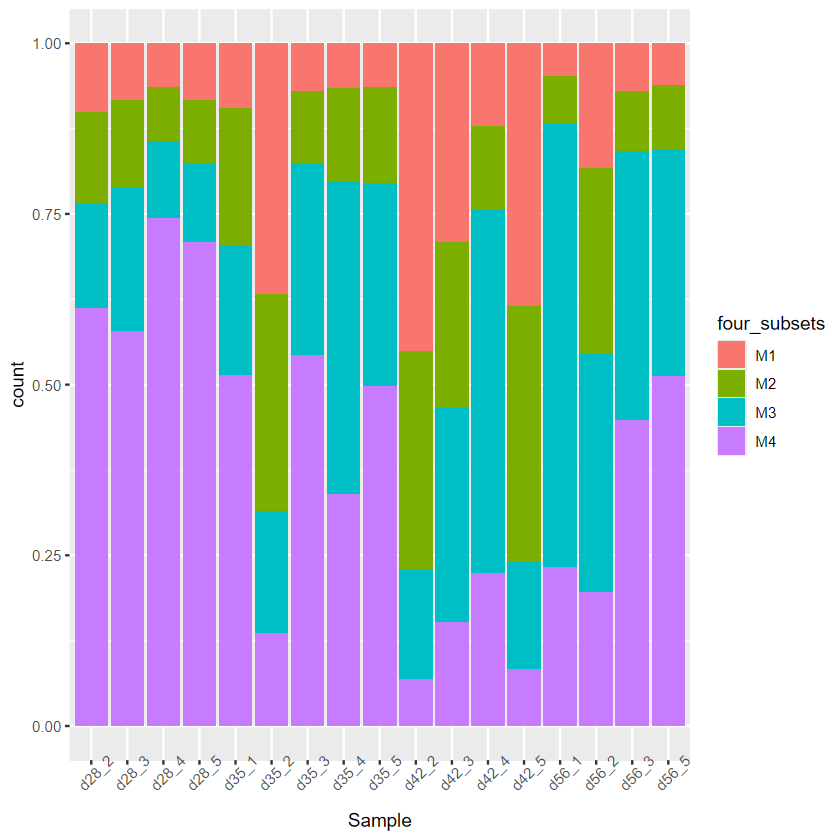

Saving 7 x 7 in image


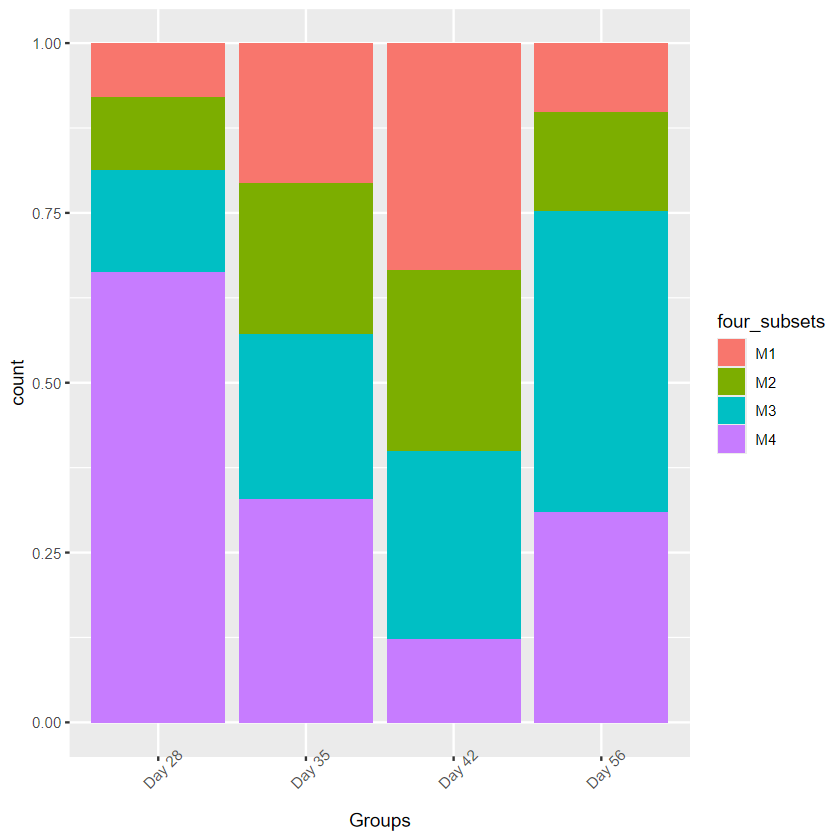

In [12]:

# Extracting cell counts for bar graphs
cell_counts <- FetchData(seurat,vars=c('four_subsets', "Sample")) 
cell_counts <- arrange(cell_counts, Sample)


counts <- cell_counts %>% add_count(Sample, name='total_cell_count_by_sample') #%>%  ungroup() %>% arrange( four_subsets , desc(hash.ID) ) #%>% arrange('four_subsets')

counts <- counts %>% 
    dplyr::count(four_subsets, Sample, total_cell_count_by_sample,name='cluster_count')  |> 
        mutate(frequency_within_sample=cluster_count*100/total_cell_count_by_sample)  |> 
        mutate(Sample = as.character(Sample)) |> 

        arrange( Sample, desc(Sample)) #%>% arrange('four_subsets')

new_counts <- counts |> 
    arrange(Sample) |>     
    pivot_wider(id_cols = four_subsets, names_from = 'Sample', values_from = frequency_within_sample)
    
write.csv(new_counts,file=paste0(path,"number of cells per four_subsets per condition.csv"),row.names=F)

# Barplot of proportion of cells in each cluster by sample
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Sample, fill=four_subsets), position=position_fill())+ theme(axis.text.x = element_text(angle = 45, vjust = 1))
ggsave(paste0(path, 'cells_per_four_subsets_per_sample.pdf'))
    
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Groups, fill=four_subsets), position=position_fill()) + theme(axis.text.x = element_text(angle = 45, vjust = 1)) 
ggsave(paste0(path, 'cells_per_four_subsets_per_group.pdf'))

## Extracting cluster annotations

In [ ]:
local_path <- paste0(path, 'Xenium_explorer_annotations/')
dir.create(local_path)
metadata_variable <- 'seurat_clusters'

for (image in levels(seurat$Samples)) {
    local_path2 <- paste0(local_path, image, '/')
    dir.create(local_path2)

    seurat_small <- subset(seurat, subset = Samples == image)
    table <- seurat_small@meta.data  |> dplyr::select(all_of(metadata_variable)) |> rownames_to_column('cell_id')
    table <- table |>
        separate_wider_delim(cell_id, '_', names = 'cell_id', too_many = 'drop') |> rename('group' = metadata_variable)
    write.csv(table, paste0(local_path2, image, 'seurat_clusters' ,'.csv'), row.names = F)    

}


Warning message in dir.create(local_path):
"'.\Macrophage_analysis\Xenium_explorer_annotations' already exists"


Warning message in dir.create(local_path2):
"'.\Macrophage_analysis\Xenium_explorer_annotations\d28_2' already exists"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning mes

In [13]:
local_path <- paste0(path, 'Xenium_explorer_annotations/')
dir.create(local_path)
metadata_variable <- 'four_subsets'

for (image in levels(seurat$Samples)) {
    local_path2 <- paste0(local_path, image, '/')
    dir.create(local_path2)

    seurat_small <- subset(seurat, subset = Samples == image)
    table <- seurat_small@meta.data  |> dplyr::select(all_of(metadata_variable)) |> rownames_to_column('cell_id')
    table <- table |>
        separate_wider_delim(cell_id, '_', names = 'cell_id', too_many = 'drop') |> rename('group' = metadata_variable)
    write.csv(table, paste0(local_path2, image, '_', 'four_subsets' ,'.csv'), row.names = F)    

}


Warning message in dir.create(local_path):
"'.\Macrophage_analysis\Xenium_explorer_annotations' already exists"
Warning message in dir.create(local_path2):
"'.\Macrophage_analysis\Xenium_explorer_annotations\d28_2' already exists"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat object

In [162]:
local_path <- paste0(path, 'Xenium_explorer_annotations/')
dir.create(local_path)
metadata_variable <- 'cell_types'

for (image in levels(seurat$Samples)) {
    local_path2 <- paste0(local_path, image, '/')
    dir.create(local_path2)

    seurat_small <- subset(seurat, subset = Samples == image)
    table <- seurat_small@meta.data  |> dplyr::select(all_of(metadata_variable)) |> rownames_to_column('cell_id')
    table <- table |>
        separate_wider_delim(cell_id, '_', names = 'cell_id', too_many = 'drop') |> rename('group' = metadata_variable)
    write.csv(table, paste0(local_path2, image, '_', 'cell_types' ,'.csv'), row.names = F)    

}


Warning message in dir.create(local_path):
"'.\Macrophage_analysis\Xenium_explorer_annotations' already exists"
Warning message in dir.create(local_path2):
"'.\Macrophage_analysis\Xenium_explorer_annotations\d28_2' already exists"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat object

## Saving objects

In [163]:
saveRDS(seurat, 'Xenium_Ivan_Macrophages.rds')

# B cells analysis

## Initialization

In [60]:
path <- './B_cell_analysis/'
#unlink(path, recursive = T)
dir.create(path)

In [62]:
seurat <- readRDS(paste0('Z:/xenium_Ivan/cell_type_subclustering/', "Xenium_Ivan_B_cells_d30.rds"))

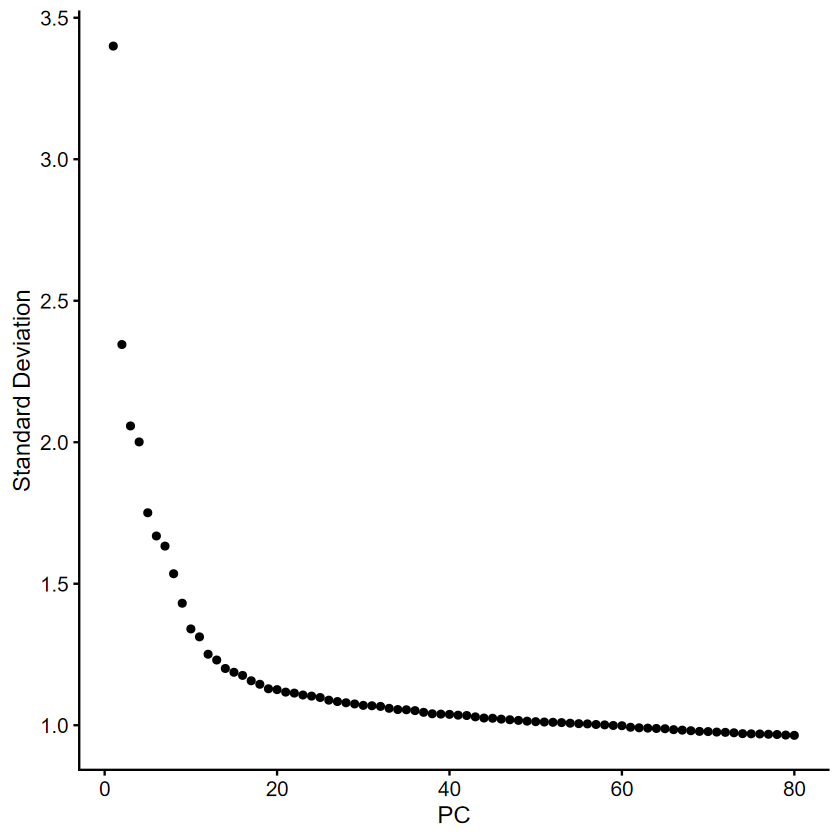

In [63]:
ElbowPlot(seurat,ndims = 80)

In [64]:
dimensions <- 
resolutions <-c(0.1, 0.2, 0.3, 0.4, 0.5, 1)


Saving 7 x 7 in image


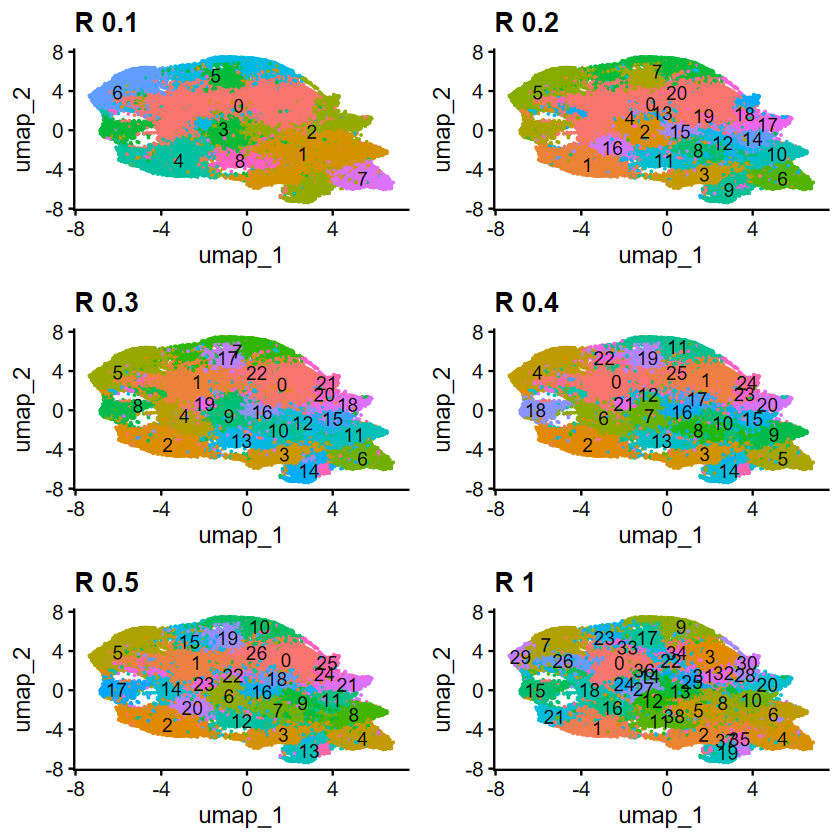

In [65]:
p <- list()
i <- 1
for (resolution in resolutions ) {
    Idents(seurat) <- paste0('SCT_snn_res.', resolution) 
    p2 <- DimPlot(seurat, reduction = "umap", label = TRUE) + ggtitle(paste0('R ', resolution)) + theme(legend.position = "none")    
    p[[i]] <- p2
    i <- i+1
}

plot <- grid.arrange(grobs = p)
ggsave('clustering_results_by_resolution.pdf', path = path, plot = plot)

## Chosen resolution and dimensions

In [67]:
dimensions <- 30
resolution <- 0.1
#seurat <- readRDS('Z:/xenium_Ivan/Xenium_Ivan_2024_merged_dim_40.rds')

## Initial plots and calculations

[1] "0" "1" "2" "3" "4" "5" "6" "7" "8"

Saving 7 x 7 in image


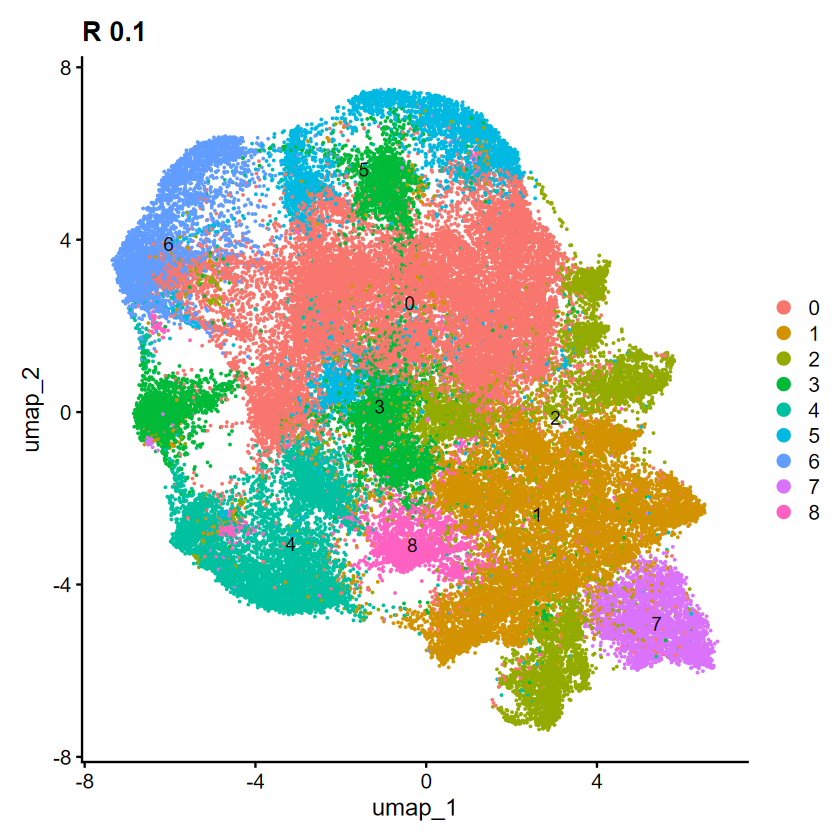

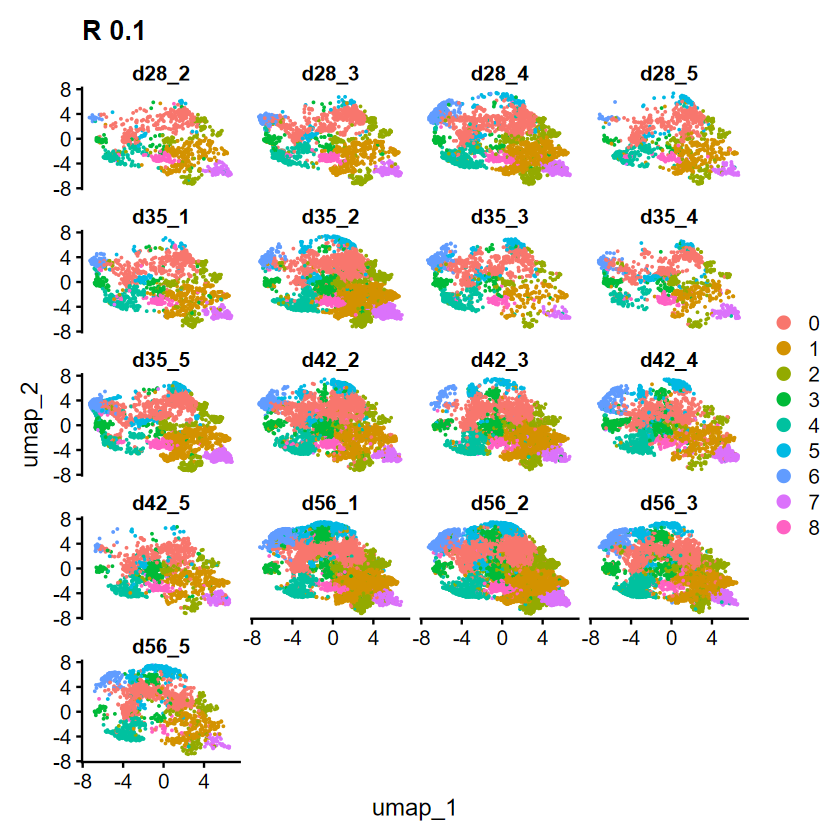

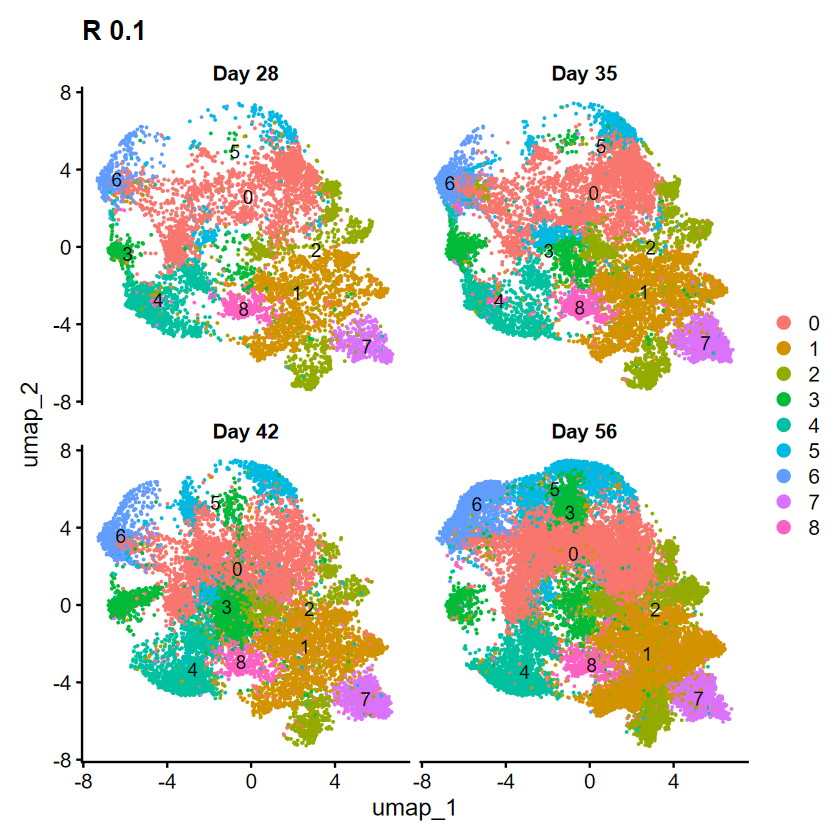

In [69]:
Idents(seurat) <- paste0('SCT_snn_res.', resolution)
seurat[['seurat_clusters']]<- Idents(seurat)

seurat@meta.data <- seurat@meta.data |>
    mutate(
        seurat_clusters = factor(seurat_clusters, levels = c('0', '1', '2', '3', '4', '5', '6', '7', '8'))
    )

levels(seurat$seurat_clusters)
Idents(seurat) <- 'seurat_clusters'
DimPlot(seurat, reduction = "umap", label = TRUE) + ggtitle(paste0('R ', resolution))
ggsave('UMAP.pdf', path = path)
DimPlot(seurat, reduction = "umap", label = FALSE, split.by = 'Samples', ncol = 4) + ggtitle(paste0('R ', resolution))
ggsave('UMAP_by_sample.pdf', path = path, width = 12, height = 10)
DimPlot(seurat, reduction = "umap", label = TRUE, split.by = 'Groups', ncol = 2) + ggtitle(paste0('R ', resolution))
ggsave('UMAP_by_group.pdf', path = path, width = 10, height = 10)

Saving 7 x 7 in image


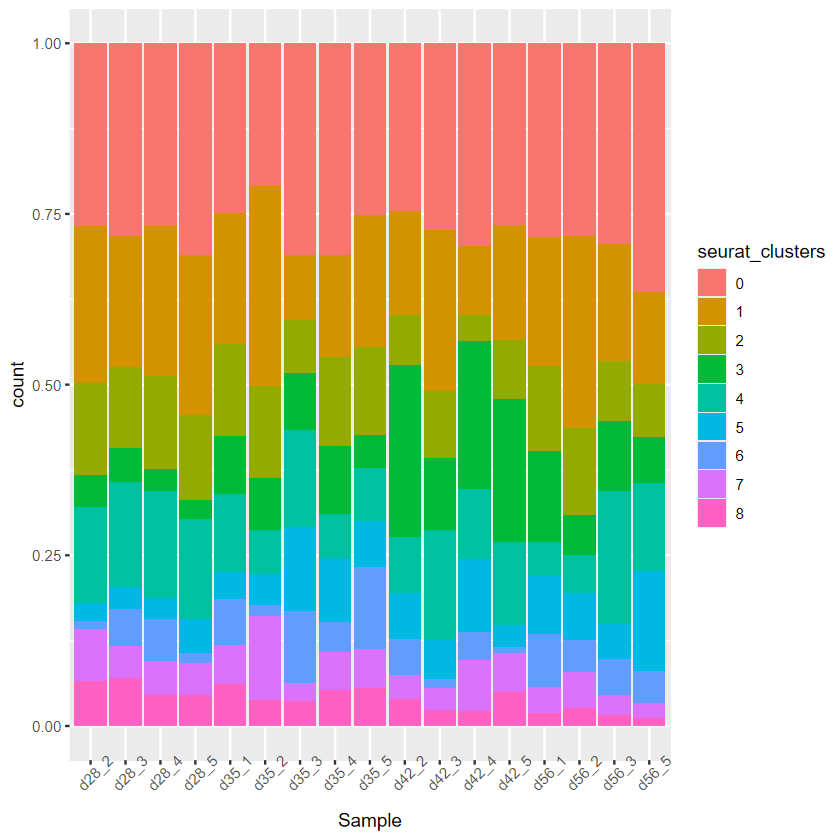

Saving 7 x 7 in image


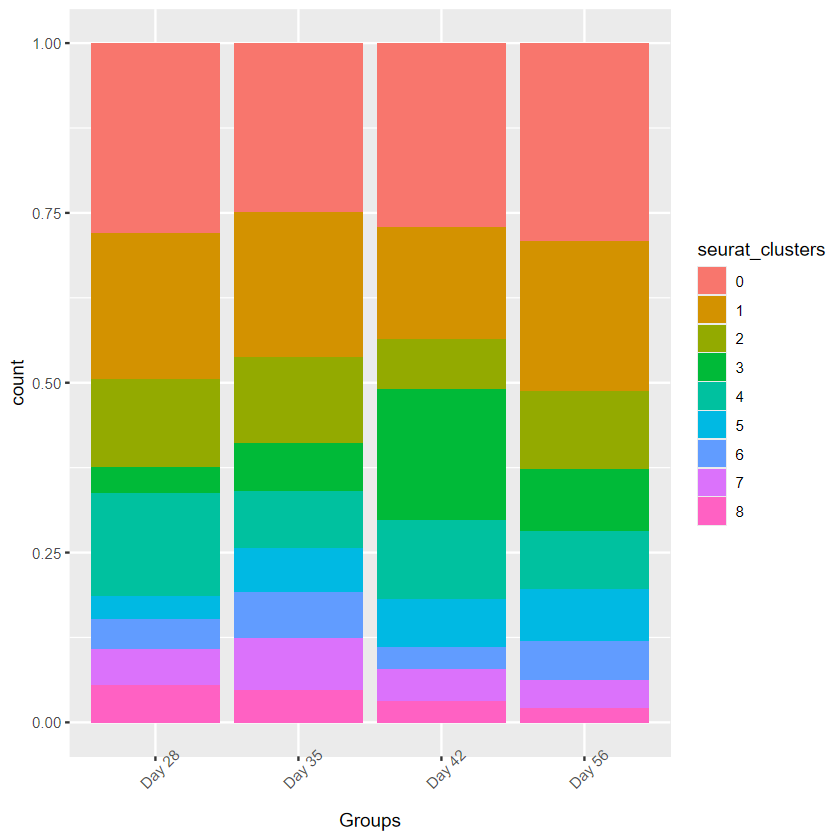

In [70]:

# Extracting cell counts for bar graphs
cell_counts <- FetchData(seurat,vars=c('seurat_clusters', "Sample")) 
cell_counts <- arrange(cell_counts, Sample)


counts <- cell_counts %>% add_count(Sample, name='total_cell_count_by_sample') #%>%  ungroup() %>% arrange( seurat_clusters , desc(hash.ID) ) #%>% arrange('seurat_clusters')

counts <- counts %>% 
    dplyr::count(seurat_clusters, Sample, total_cell_count_by_sample,name='cluster_count')  |> 
        mutate(frequency_within_sample=cluster_count*100/total_cell_count_by_sample)  |> 
        mutate(Sample = as.character(Sample)) |> 

        arrange( Sample, desc(Sample)) #%>% arrange('seurat_clusters')

new_counts <- counts |> 
    arrange(Sample) |>     
    pivot_wider(id_cols = seurat_clusters, names_from = 'Sample', values_from = frequency_within_sample)
    
write.csv(new_counts,file=paste0(path,"number of cells per cluster per condition.csv"),row.names=F)

# Barplot of proportion of cells in each cluster by sample
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Sample, fill=seurat_clusters), position=position_fill())+ theme(axis.text.x = element_text(angle = 45, vjust = 1))
ggsave(paste0(path, 'cells_per_cluster_per_sample.pdf'))
    
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Groups, fill=seurat_clusters), position=position_fill()) + theme(axis.text.x = element_text(angle = 45, vjust = 1)) 
ggsave(paste0(path, 'cells_per_cluster_per_group.pdf'))

## Top genes per cluster

In [71]:
# #slot(object = seurat@assays$SCT@SCTModel.list[[3]], name="umi.assay") <- 'Xenium'
# for (i in 1:17) {
#     slot(object = seurat@assays$SCT@SCTModel.list[[i]], name="umi.assay") <- 'Xenium'
# }

# SCTResults(object=seurat, slot="umi.assay")

In [72]:
object_annotations <- ''
 
Idents(seurat) <- 'seurat_clusters'

seurat <- PrepSCTFindMarkers(seurat, assay = "SCT", verbose = TRUE)
seurat.markers <- FindAllMarkers(seurat, only.pos = TRUE, min.pct = 0.01)

# saveRDS(seurat.markers, file = 'seurat.markers.rds')



#Add gene annotations:
annotations <- read.csv("M:/LPD-MIS members' data/Eduard Ansaldo/Bioinformatics/analysis_templates/annotations.csv")
seurat.markers <- seurat.markers |>
                left_join(y= unique(annotations[,c('gene_name', 'description')]),
                    by = c('gene' = 'gene_name'))

                    

#Top10 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 10) -> top10

#Top25 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 25) -> top25

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 100) -> top100

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 3) -> top3

write.table(top100,file=paste0(path,'top100',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
# write.table(top25,file=paste0(path,'top25',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
write.table(top10,file=paste0(path,'top10',object_annotations, ".tsv"), sep="\t",row.names = FALSE)


# # #Top5 markers
# seurat.markers %>%
#     group_by(cluster) %>%
#     slice_head(n = 5) -> top5
# DoHeatmap(seurat, features = top5$gene, size = 1) + NoLegend() & theme(text=element_text(size=6))
# ggsave(paste0("Heatmap_Top5_per_cluster", object_annotations, ".pdf"), path = path)

# #Top10 markers
# seurat.markers %>%
#      group_by(cluster) %>%
#      slice_head(n = 10) -> top10
#  DoHeatmap(seurat, features = top10$gene, size = 1) + NoLegend() & theme(text=element_text(size=4)) 
#  ggsave(paste0("Heatmap_Top10_per_cluster", object_annotations, ".pdf"), path = path)

gene_list_plot <- top3 |> pull(gene)

pdf(paste0(path, 'Clustered_dotplot', object_annotations, '.pdf'))
Clustered_DotPlot(seurat, features=gene_list_plot, k=length(unique(seurat$seurat_clusters)), plot_km_elbow = FALSE, cluster_ident=FALSE, ggplot_default_colors = T)
dev.off()


    

Only one SCT model is stored - skipping recalculating corrected counts

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Warning message:
"Feature list contains duplicates, making unique."


pdf 
  2

## Further analysis

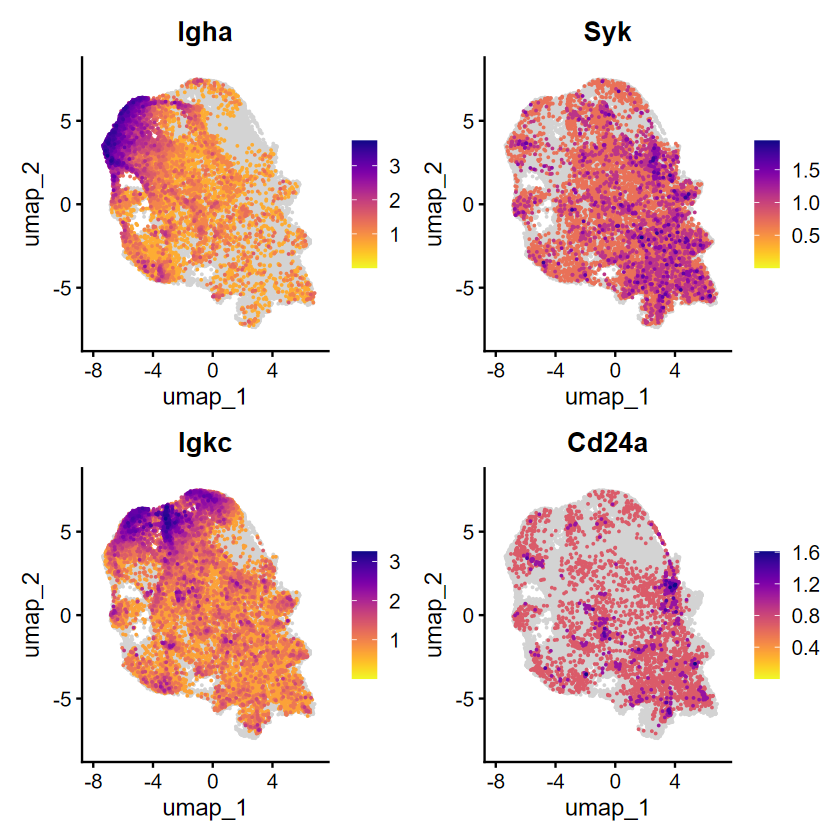

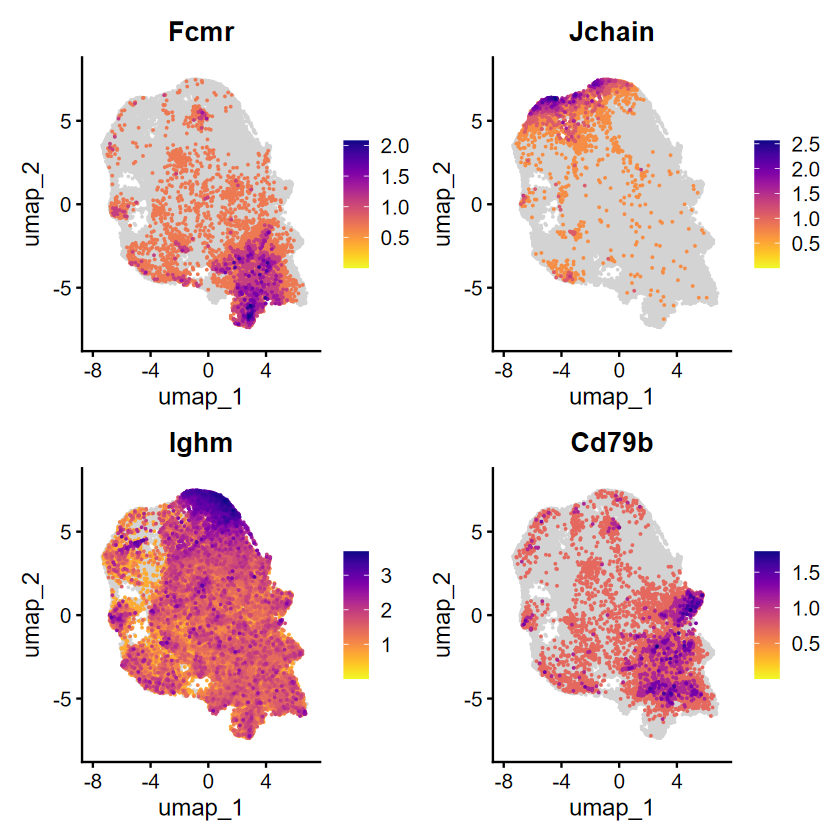

In [81]:
FeaturePlot_scCustom(seurat, features = c('Igha', 'Syk', 'Igkc', 'Cd24a'))
FeaturePlot_scCustom(seurat, features = c('Fcmr', 'Jchain', 'Ighm', 'Cd79b'))

Warning message:
"The following features were omitted as they were not found:
ℹ Cd20 and Ighg"


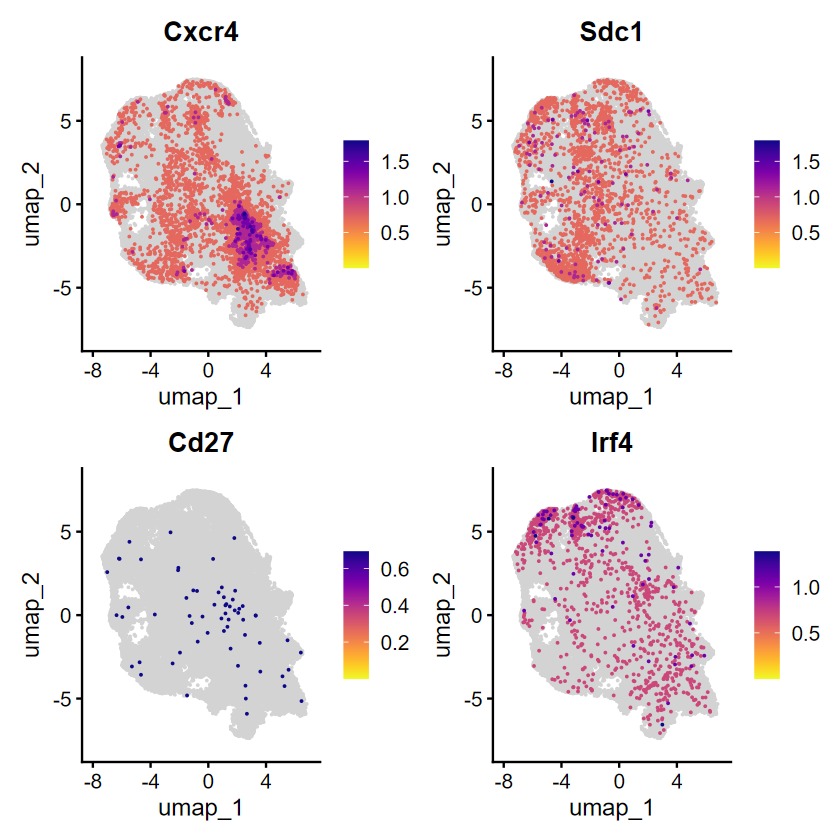

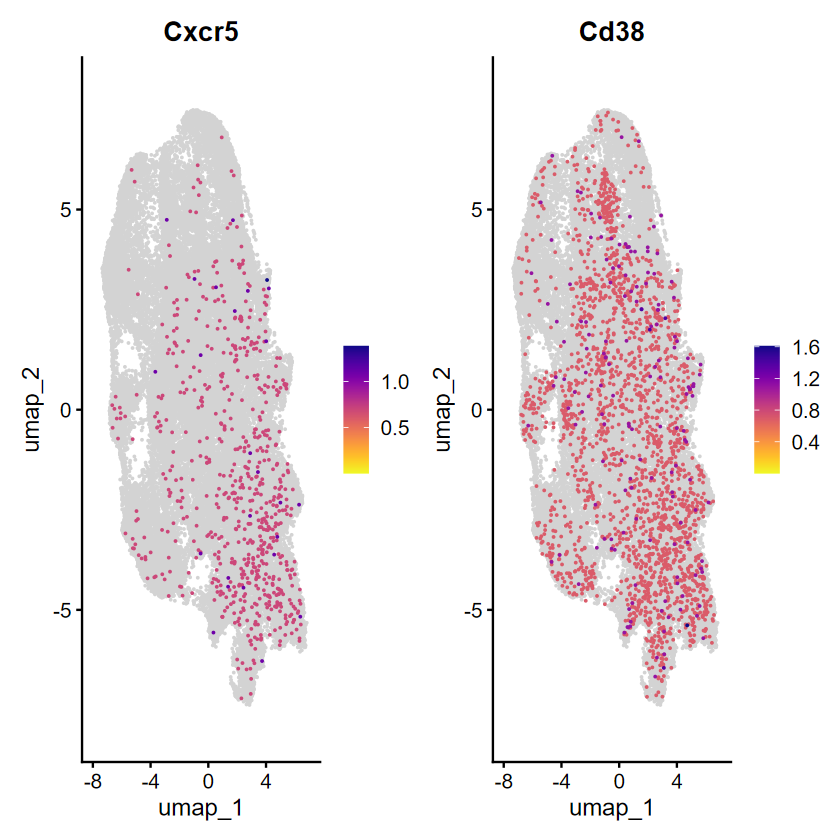

In [85]:
FeaturePlot_scCustom(seurat, features = c('Cxcr4', 'Sdc1', 'Cd27', 'Irf4'))
FeaturePlot_scCustom(seurat, features = c('Cxcr5', 'Cd20', 'Cd38', 'Ighg'))

Warning message:
"The following features were omitted as they were not found:
ℹ Slamf7"


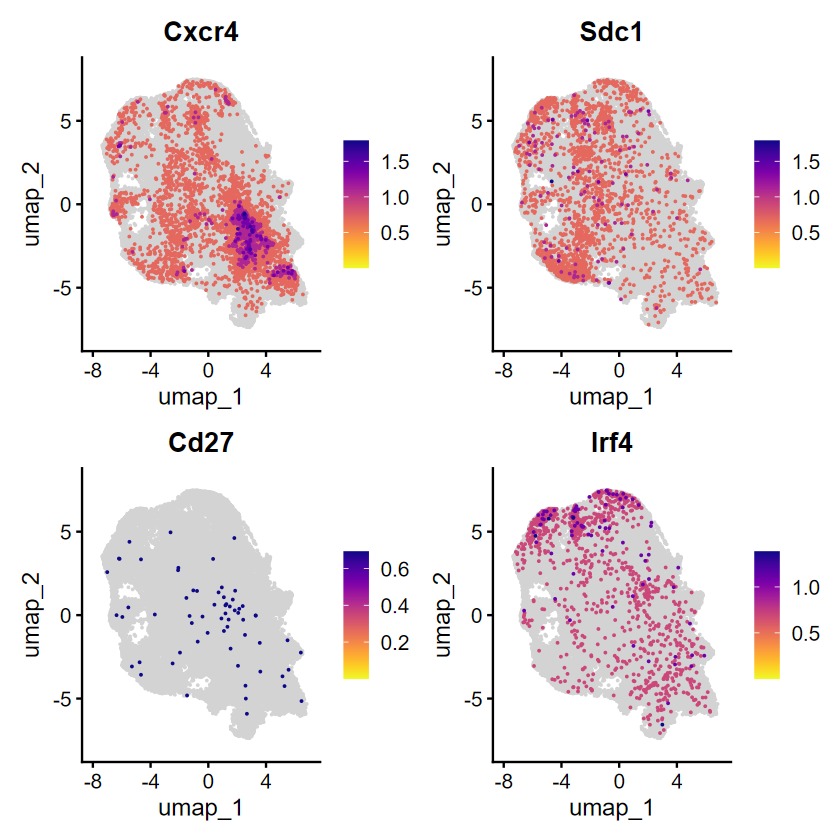

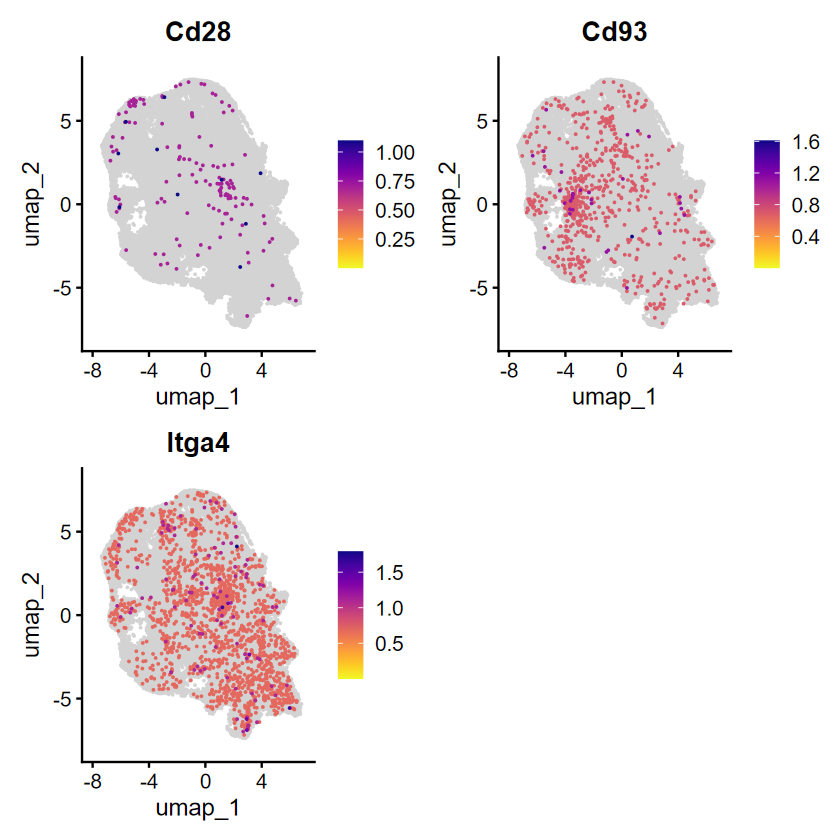

In [87]:
FeaturePlot_scCustom(seurat, features = c('Cxcr4', 'Sdc1', 'Cd27', 'Irf4'))
FeaturePlot_scCustom(seurat, features = c('Cd28', 'Cd93', 'Slamf7', 'Itga4'))

In [ ]:
Idents(seurat) <- 'seurat_clusters'
#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 4) -> top3
    gene_list_plot <- top3 |> pull(gene)
gene_list_plot_3 <- gene_list_plot

gene_list_plot <- c(gene_list_plot_3)
gene_list_plot <- c(gene_list_plot, 'Cd68', 'Csf1r', 'Mafb', 'Itgam', 'Siglecf', 'Mertk', 'Maf', 'Spi1', 'Zeb2')

pdf(paste0(path, 'Clustered_dotplot_additional_markers', '.pdf'))
Clustered_DotPlot(seurat, features=gene_list_plot, k=length(unique(seurat$seurat_clusters)), plot_km_elbow = FALSE, cluster_ident=FALSE, ggplot_default_colors = T,column_label_size = 8,row_label_size = 6)
dev.off()

Warning message:
"Feature list contains duplicates, making unique."
Warning message:
"The following features were omitted as they were not found:
ℹ Siglecf"


pdf 
  2

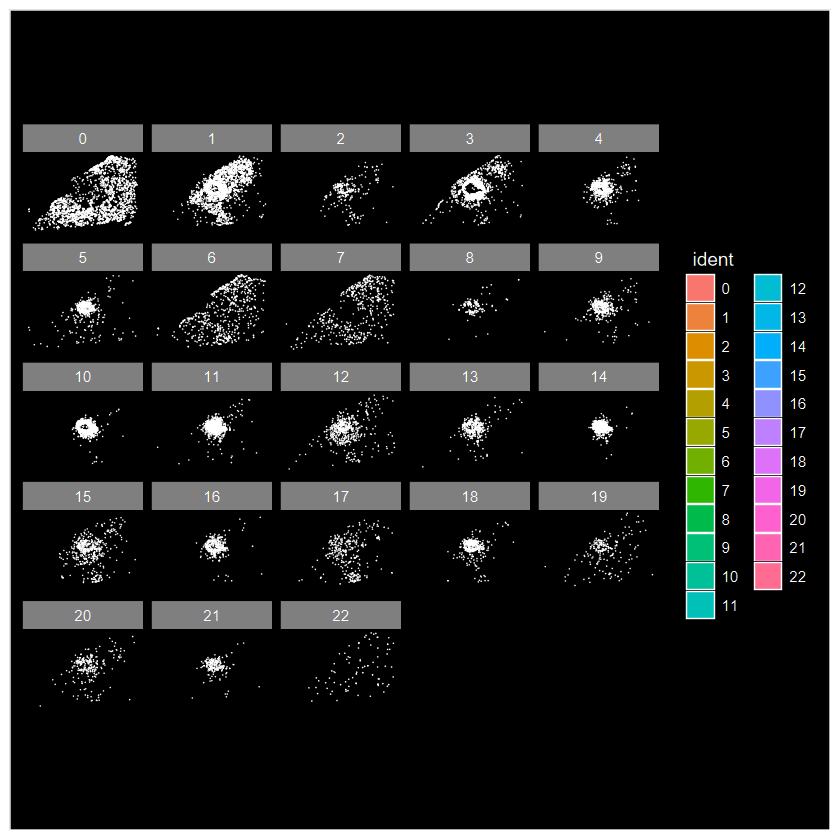

In [ ]:
ImageDimPlot(seurat, fov = 'fov_d56_2', split.by = 'seurat_clusters', size = 0.02, alpha = 0.1)
ggsave('D_56_ImageDimPlot.png', width = 10, height = 10, path = path)

## Automatic cell annotation

Warning message in ImmGenData(ensembl = FALSE):
"'ImmGenData' is deprecated.
Use 'celldex::ImmGenData' instead.
See help("Deprecated")"


Warning message:
"Layer 'data' is empty"
Warning message:
"Layer 'scale.data' is empty"
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



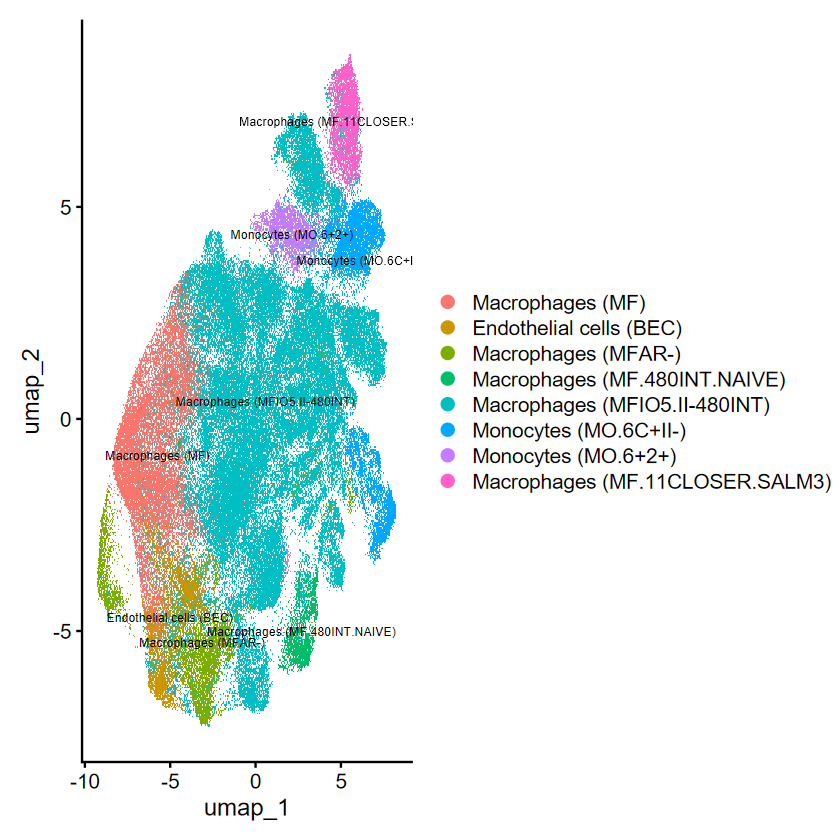

In [ ]:
immgen <- ImmGenData(ensembl = FALSE)
predictions_cluster <- SingleR(test = as.SingleCellExperiment(seurat), assay.type.test = 1, ref = immgen, labels = immgen$label.fine, cluster = seurat$seurat_clusters)

row.names <- rownames(predictions_cluster)

predictions_cluster <- predictions_cluster |>
    as_tibble() |> 
    dplyr::select(c('labels')) 

predictions_cluster$cluster <- row.names

#predictions_cluster <- predictions_cluster |> rename('labels_per_cluster' = 'labels')

annotations <- seurat@meta.data |>
    left_join(predictions_cluster, by = join_by('seurat_clusters' == 'cluster')) |>
    pull(labels)

seurat$labels_per_cluster <- annotations

Idents(seurat) <- 'labels_per_cluster'
DimPlot(seurat, label = T, label.size = 2.5)
ggsave(paste0('UMAP_cluster_SingleR_annotations','.pdf'), path = path, width = 8, height = 5)
# DimPlot(seurat, label = T, label.size = 2.5, split.by = 'Groups')
# ggsave(paste0('UMAP_cluster_SingleR_annotations_by_group_R_0_15','.pdf'), path = path, width = 13, height = 5)

### Annotations per cell

In [ ]:
immgen <- ImmGenData(ensembl = FALSE)
predictions_cell_basis <- SingleR(test = as.SingleCellExperiment(seurat), assay.type.test = 1, ref = immgen, labels = immgen$label.main)

predictions_cell_basis <- predictions_cell_basis |>
    as_tibble() |> 
    dplyr::select(c('labels')) 

predictions_cell_basis <- predictions_cell_basis |> rename('labels_per_cell_coarse' = 'labels')

seurat$labels_per_cell_coarse <- predictions_cell_basis |> pull(labels_per_cell_coarse)
    
Idents(seurat) <- 'labels_per_cell_coarse'
DimPlot_scCustom(seurat, label = F)#+ theme(legend.position = 'none')
ggsave(paste0('UMAP_cell_SingleR_annotations_coarse','.pdf'), path = path, width = 5, height = 5)



In [ ]:
immgen <- ImmGenData(ensembl = FALSE)
predictions_cell_basis <- SingleR(test = as.SingleCellExperiment(seurat), assay.type.test = 1, ref = immgen, labels = immgen$label.fine)

predictions_cell_basis <- predictions_cell_basis |>
    as_tibble() |> 
    dplyr::select(c('labels')) 

predictions_cell_basis <- predictions_cell_basis |> rename('labels_per_cell_fine' = 'labels')

seurat$labels_per_cell_fine <- predictions_cell_basis |> pull(labels_per_cell_fine)
    
Idents(seurat) <- 'labels_per_cell_fine'
DimPlot_scCustom(seurat, label = F)#+ theme(legend.position = 'none')
ggsave(paste0('UMAP_cell_SingleR_annotations_fine','.pdf'), path =path, width = 35, height = 5)



## Renaming clusters

In [ ]:
Idents(seurat) <- 'seurat_clusters'

seurat <- RenameIdents(seurat,
    '0' = 'T cells',
    '1' = 'Epithelial cells',
    '2' = 'Stromal cells',
    '3' = 'Endothelial cells',
    '4' = 'Macrophages',
    '5' = 'Macrophages',
    '6' = 'Epithelial cells',
    '7' = 'Macrophages',
    '8' = 'B cells',
    '9' = 'Endothelial cells',
    '10' = 'Endothelial cells',
    '11' = 'Stromal cells',
    '12' = 'Stromal cells',
    '13' = 'Macrophages',
    '14' = 'B cells',
    '15' = 'B cells',
    '16' = 'Other',
    '17' = 'Endothelial cells',
    '18' = 'Endothelial cells',
    '19' = 'Other'

)

seurat[['major_cell_types']] <- Idents(seurat)

seurat@meta.data <- seurat@meta.data |> mutate(major_cell_types = factor(major_cell_types, levels = str_sort(unique(seurat$major_cell_types))))

In [ ]:
Idents(seurat) <- 'seurat_clusters'

seurat <- RenameIdents(seurat,
    '0' = 'T_cells',
    '1' = 'Epithelial_cells',
    '2' = 'Stromal_cells',
    '3' = 'Endothelial_cells',
    '4' = 'Macrophages',
    '5' = 'Macrophages',
    '6' = 'Epithelial_cells',
    '7' = 'Macrophages',
    '8' = 'B_cells',
    '9' = 'Endothelial_cells',
    '10' = 'Endothelial_cells',
    '11' = 'Stromal_cells',
    '12' = 'Stromal_cells',
    '13' = 'Macrophages',
    '14' = 'B_cells',
    '15' = 'B_cells',
    '16' = 'Other',
    '17' = 'Endothelial_cells',
    '18' = 'Endothelial_cells',
    '19' = 'Other'

)

seurat[['major_cell_types_no_spaces']] <- Idents(seurat)

seurat@meta.data <- seurat@meta.data |> mutate(major_cell_types_no_spaces = factor(major_cell_types_no_spaces, levels = str_sort(unique(seurat$major_cell_types_no_spaces))))

In [ ]:
Idents(seurat) <- 'major_cell_types'
DimPlot(seurat, reduction = "umap", label = TRUE) + ggtitle(paste0('Major Cell Types'))
ggsave('UMAP_major_cell_types.pdf', path = path)
DimPlot(seurat, reduction = "umap", label = F, split.by = 'Sample') + ggtitle(paste0('Major Cell Types'))
ggsave('UMAP_major_cell_types_by_sample.pdf', path = path, width = 12, height = 5)
DimPlot(seurat, reduction = "umap", label = F, split.by = 'Groups', ncol = 2) + ggtitle(paste0('Major Cell Types'))
ggsave('UMAP_major_cell_types_by_group.pdf', path = path, width = 10, height = 10)



In [ ]:

# Extracting cell counts for bar graphs
cell_counts <- FetchData(seurat,vars=c('major_cell_types', "Sample")) 
cell_counts <- arrange(cell_counts, Sample)


counts <- cell_counts %>% add_count(Sample, name='total_cell_count_by_sample') #%>%  ungroup() %>% arrange( major_cell_types , desc(hash.ID) ) #%>% arrange('major_cell_types')

counts <- counts %>% 
    dplyr::count(major_cell_types, Sample, total_cell_count_by_sample,name='cluster_count')  |> 
        mutate(frequency_within_sample=cluster_count*100/total_cell_count_by_sample)  |> 
        mutate(Sample = as.character(Sample)) |> 

        arrange( Sample, desc(Sample)) #%>% arrange('major_cell_types')

new_counts <- counts |> 
    arrange(Sample) |>     
    pivot_wider(id_cols = major_cell_types, names_from = 'Sample', values_from = frequency_within_sample)
    
write.csv(new_counts,file=paste0(path,"number of cells per cluster per condition.csv"),row.names=F)

# Barplot of proportion of cells in each cluster by sample
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Sample, fill=major_cell_types), position=position_fill())+ theme(axis.text.x = element_text(angle = 45, vjust = 1))
ggsave(paste0(path, 'cells_per_major_cell_type_per_sample.pdf'))
    
ggplot(seurat@meta.data) +
    geom_bar(aes(x=Groups, fill=major_cell_types), position=position_fill()) + theme(axis.text.x = element_text(angle = 45, vjust = 1)) 
ggsave(paste0(path, 'cells_per_major_cell_type_per_group.pdf'))

## Extracting cluster annotations

In [ ]:
local_path <- paste0(path, 'Xenium_explorer_annotations/')
dir.create(local_path)
metadata_variable <- 'seurat_clusters'

for (image in levels(seurat$Samples)) {
    local_path2 <- paste0(local_path, image, '/')
    dir.create(local_path2)

    seurat_small <- subset(seurat, subset = Samples == image)
    table <- seurat_small@meta.data  |> dplyr::select(all_of(metadata_variable)) |> rownames_to_column('cell_id')
    table <- table |>
        separate_wider_delim(cell_id, '_', names = 'cell_id', too_many = 'drop') |> rename('group' = metadata_variable)
    write.csv(table, paste0(local_path2, image, 'seurat_clusters' ,'.csv'), row.names = F)    

}


Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating

## Saving objects

In [ ]:
saveRDS(seurat, 'Xenium_Ivan_Macrophages.rds')

# Manuscript figures

## Full object

In [4]:
path <- './Manuscript_figures/'
dir.create(path)
seurat <- readRDS("Xenium_Ivan_merged_clustered.rds")

Warning message in dir.create(path):
"'.\Manuscript_figures' already exists"


In [5]:
levels(seurat$major_cell_types)

[1] "B cells"           "Endothelial cells" "Epithelial cells" 
[4] "Mac/Mon"           "Other"             "Stromal cells"    
[7] "T cells"

In [180]:
seurat@meta.data <- seurat@meta.data |>
    mutate(
        major_cell_types = factor(major_cell_types, levels = c('Mac/Mon', 'T cells', 'B cells', 'Epithelial cells', 'Endothelial cells', 'Stromal cells', 'Other'))
    )

In [181]:
default_7 <- c(
    
    'Stromal cells'     = '#9d63cb',  
    'Mac/Mon'           = '#729f48',
    'Epithelial cells'  = '#c65b89',
    'B cells'           = '#4aac8b',
    'Other'             = '#c66447',
    'T cells'           = '#7189c8',
    'Endothelial cells' = '#c39c30'    

)

fancy_light_7 <- c(
    
    'Stromal cells'     = '#70d3e3',
    'Mac/Mon'           = '#eca9b9',
    'Epithelial cells'  = '#e4bf97',
    'B cells'           = '#98c2ec',
    'Other'             = '#bed7a0',
    'T cells'           = '#d0b5e7',
    'Endothelial cells' = '#9adbc5')

default_lighter_7 <- c(

    'Stromal cells'     = '#dd785a',
    'Mac/Mon'           = '#de72a1',
    'Epithelial cells'  = '#a384dd',
    'B cells'           = '#70c75b',
    'Other'             = '#96b874',
    'T cells'           = '#56c5bf',
    'Endothelial cells' = '#c9a839'

)

default_lighter_7_v2 <- c(
    'Stromal cells'     = '#dd785a',
    'Mac/Mon'           = '#96b874',
    'Epithelial cells'  = '#a384dd',
    'B cells'           = '#70c75b',
    'Other'             = '#de72a1',
    'T cells'           = '#56c5bf',
    'Endothelial cells' = '#c9a839')

 Ivan_7 <- c(
        
    'Stromal cells'     ='#90BE6D' , 
    'Mac/Mon'           ='#F94144' ,
    'Epithelial cells'  ='#577590' ,
    'B cells'           ='#F9C74F' ,
    'Other'             ='#ABABAB' ,
    'T cells'           ='#F3722C' ,
    'Endothelial cells' ='#43AA8B' )

color_palette_list <- list('default_7' = default_7,
                         'fancy_light_7' = fancy_light_7,
                         'default_lighter_7' =  default_lighter_7,
                         'default_lighter_7_v2' = default_lighter_7_v2,
                         'Ivan_7' = Ivan_7)


library(openxlsx)

color_table <- as.data.frame(color_palette_list, row.names = names(default_7)) |> rownames_to_column('Cell Type')
#row.names(color_table) <- names(default_7)

write.xlsx(color_table, file = paste0("color_palettes.xlsx"))

Warning message in file.create(to[okay]):
"cannot create file 'color_palettes.xlsx', reason 'Permission denied'"


In [182]:
local_path <- paste0(path, 'testing_color_palettes/')
unlink(local_path, recursive = T)
dir.create(local_path)

Idents(seurat) <- 'major_cell_types'

for (palette in names(color_palette_list)) {

    DimPlot(seurat, reduction = "umap", label = TRUE, cols = color_palette_list[[palette]])
    ggsave(paste0('UMAP_',  palette , '.pdf'), path = local_path)
    DimPlot(seurat, reduction = "umap", label = FALSE, split.by = 'Samples', ncol = 4, cols = color_palette_list[[palette]])
    ggsave(paste0('UMAP_by_sample_', palette,'.pdf'), path = local_path, width = 12, height = 10)
    DimPlot(seurat, reduction = "umap", label = TRUE, split.by = 'Groups', ncol = 2, cols = color_palette_list[[palette]])
    ggsave(paste0('UMAP_by_group_', palette,'.pdf'), path = local_path, width = 10, height = 10)

}

Warning message in dir.create(local_path):
"'.\Manuscript_figures\testing_color_palettes' already exists"
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALS

In [183]:
## Top genes per cluster

object_annotations <- '_major_cell_types'
 
Idents(seurat) <- 'major_cell_types'

# seurat <- PrepSCTFindMarkers(seurat, assay = "SCT", verbose = TRUE)
seurat.markers <- FindAllMarkers(seurat, only.pos = TRUE, min.pct = 0.01)

# saveRDS(seurat.markers, file = 'seurat.markers.rds')



#Add gene annotations:
annotations <- read.csv("M:/LPD-MIS members' data/Eduard Ansaldo/Bioinformatics/analysis_templates/annotations.csv")
seurat.markers <- seurat.markers |>
                left_join(y= unique(annotations[,c('gene_name', 'description')]),
                    by = c('gene' = 'gene_name'))

                    

#Top10 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 10) -> top10

#Top25 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 25) -> top25

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 100) -> top100

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 3) -> top3

# write.table(top100,file=paste0(path,'top100',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
write.table(top25,file=paste0(path,'top25',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
# write.table(top10,file=paste0(path,'top10',object_annotations, ".tsv"), sep="\t",row.names = FALSE)


#gene_list_plot <- top5 |> pull(gene)

# pdf(paste0(path, 'Clustered_dotplot', object_annotations, '.pdf'))
# # Clustered_DotPlot(seurat, features=gene_list_plot, k=length(unique(seurat$seurat_clusters)), plot_km_elbow = FALSE, cluster_ident=FALSE, ggplot_default_colors = T)
# dev.off()


    

Calculating cluster Mac/Mon

Calculating cluster T cells

Calculating cluster B cells

Calculating cluster Epithelial cells

Calculating cluster Endothelial cells

Calculating cluster Stromal cells

Calculating cluster Other



In [184]:
sequential_palette <- hcl.colors(n = 10, palette = 'OrYel',rev = T)

In [192]:
#gene_list_plot <- c(gene_list_plot, 'Cd3e', 'Cd3d', 'Cd4', 'Cd8b', 'Cd8a', 'Trbc1', 'Cd20', 'Cd19', 'Ighm', 'Igha', 'Ighg1', 'Cd68', 'Csf1r', 'Mafb', 'Itgam', 'Siglecf', 'Mertk', 'Maf', 'Spi1', 'Zeb2')

insert_before <- function(vec, after, new_element) {
    pos <- match(after, vec)
    if (!is.na(pos)) {
        vec <- append(vec, new_element, after = pos)
    }
    return(vec)
}

replace_element <- function(vec, old_element, new_element) {
    pos <- match(old_element, vec)
    if (!is.na(pos)) {
        vec[pos] <- new_element
    }
    return(vec)
}
remove_element <- function(vec, element) {
    vec <- vec[vec != element]
    return(vec)
}

# Example usage:
# gene_list_plot <- remove_element(gene_list_plot, 'Cd3d')

# gene_list_plot <- replace_element(gene_list_plot, 'Cd3d', 'NewCd3d')

# gene_list_plot <- insert_after(gene_list_plot, 'Cd8a', 'NewGene')

In [217]:
levels(seurat$major_cell_types)

[1] "Mac/Mon"           "T cells"           "B cells"          
[4] "Epithelial cells"  "Endothelial cells" "Stromal cells"    
[7] "Other"

[1] "Other"             "Stromal cells"     "Endothelial cells"
[4] "Epithelial cells"  "B cells"           "T cells"          
[7] "Mac/Mon"

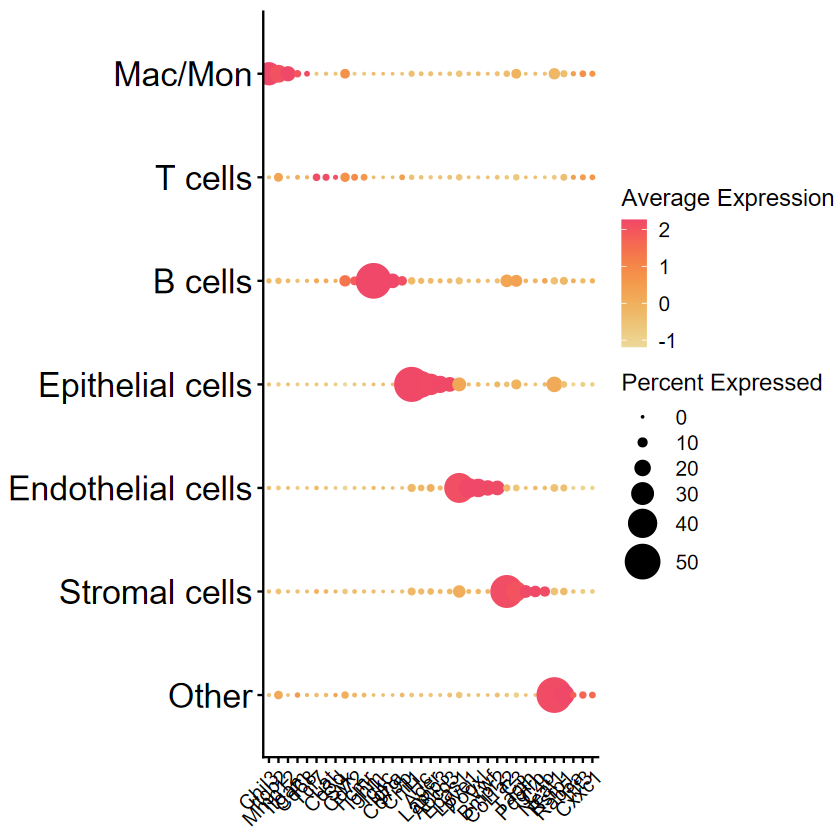

In [227]:
seurat@meta.data <- seurat@meta.data |>
    mutate(major_cell_types=factor(major_cell_types, levels = rev(levels(seurat$major_cell_types))))

levels(seurat$major_cell_types)
Idents(seurat) <- 'major_cell_types'

seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 5) -> top5
    
gene_list_plot <- top5 |> pull(gene) |> unique() |> rev()

gene_list_plot <- remove_element(gene_list_plot, 'Cd274') |> replace_element('Arg1', 'Cd68') |> insert_before('Syk', 'Cd3d') |> insert_before('Cd68', 'Itgam') |> rev()

#DotPlot_scCustom(seurat, features = gene_list_plot, colors_use = hcl.colors(n = 10, palette = 'Mako',rev = T), flip_axes = T)

DotPlot_scCustom(seurat, features = gene_list_plot, colors_use=sequential_palette, flip_axes = F, dot.scale = 9, dot.min = 0, scale.min = 0, scale.max = 50, x_lab_rotate = T, y_lab_rotate = F)  + theme(axis.text.y = element_text(size = 20))


ggsave('full_object_dot_plot_major_cell_types_top5_genes_on_x_axis.pdf', path = path, width = 12, height = 8)


seurat@meta.data <- seurat@meta.data |>
    mutate(major_cell_types=factor(major_cell_types, levels = rev(levels(seurat$major_cell_types))))

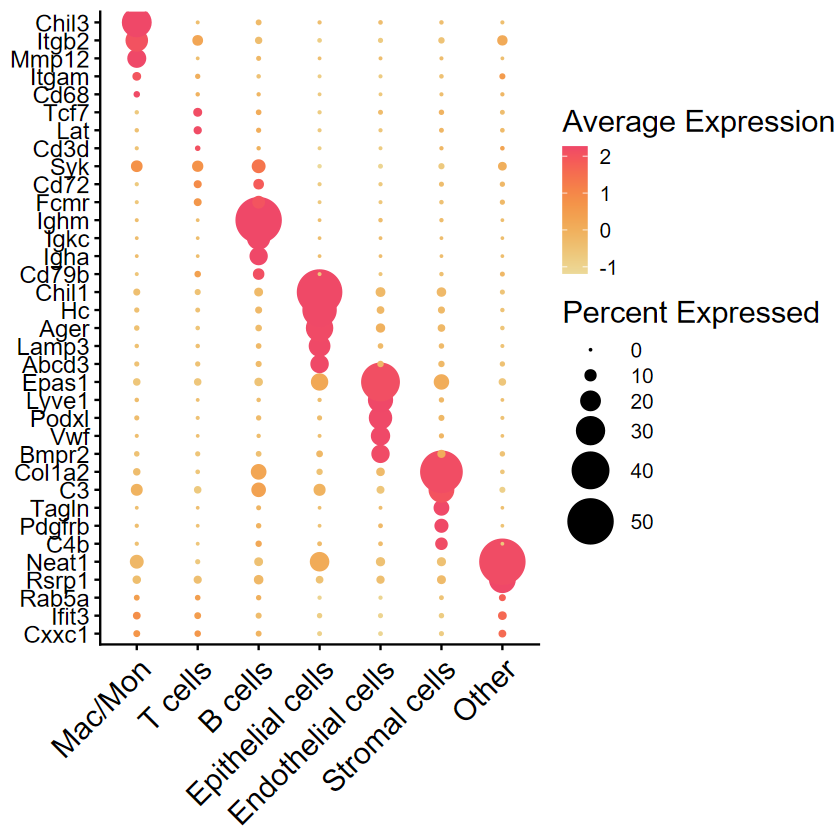

In [ ]:
Idents(seurat) <- 'major_cell_types'

seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 5) -> top5
    
gene_list_plot <- top5 |> pull(gene) |> unique() |> rev()

gene_list_plot <- remove_element(gene_list_plot, 'Cd274') |> replace_element('Arg1', 'Cd68') |> insert_before('Syk', 'Cd3d') |> insert_before('Cd68', 'Itgam')

#DotPlot_scCustom(seurat, features = gene_list_plot, colors_use = hcl.colors(n = 10, palette = 'Mako',rev = T), flip_axes = T)

DotPlot_scCustom(seurat, features = gene_list_plot, colors_use=sequential_palette, flip_axes = T, dot.scale = 12, dot.min = 0, scale.min = 0, scale.max = 50, x_lab_rotate = T, y_lab_rotate = F)  + theme(axis.text.x = element_text(size = 18), axis.text.y = element_text(size = 14), legend.title = element_text(size = 18))


ggsave('full_object_dot_plot_major_cell_types_top5_genes_on_y_axis.pdf', path = path, width = 7, height = 12)

### Top genes per cluster

In [ ]:
#slot(object = seurat@assays$SCT@SCTModel.list[[3]], name="umi.assay") <- 'Xenium'
for (i in 1:17) {
    slot(object = seurat@assays$SCT@SCTModel.list[[i]], name="umi.assay") <- 'Xenium'
}

SCTResults(object=seurat, slot="umi.assay")

$`1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2`
[1] "Xenium"

$`2.1`
[1] "Xenium"

$`2.1.1`
[1] "Xenium"

$`2.1.1.1`
[1] "Xenium"

$`2.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

$`2.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1`
[1] "Xenium"

In [ ]:
object_annotations <- ''
 
Idents(seurat) <- 'seurat_clusters'

seurat <- PrepSCTFindMarkers(seurat, assay = "SCT", verbose = TRUE)
seurat.markers <- FindAllMarkers(seurat, only.pos = TRUE, min.pct = 0.01)

# saveRDS(seurat.markers, file = 'seurat.markers.rds')



#Add gene annotations:
annotations <- read.csv("M:/LPD-MIS members' data/Eduard Ansaldo/Bioinformatics/analysis_templates/annotations.csv")
seurat.markers <- seurat.markers |>
                left_join(y= unique(annotations[,c('gene_name', 'description')]),
                    by = c('gene' = 'gene_name'))

                    

#Top10 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 10) -> top10

#Top25 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 25) -> top25

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 100) -> top100

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 3) -> top3

write.table(top100,file=paste0(path,'top100',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
# write.table(top25,file=paste0(path,'top25',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
write.table(top10,file=paste0(path,'top10',object_annotations, ".tsv"), sep="\t",row.names = FALSE)


# # #Top5 markers
# seurat.markers %>%
#     group_by(cluster) %>%
#     slice_head(n = 5) -> top5
# DoHeatmap(seurat, features = top5$gene, size = 1) + NoLegend() & theme(text=element_text(size=6))
# ggsave(paste0("Heatmap_Top5_per_cluster", object_annotations, ".pdf"), path = path)

# #Top10 markers
# seurat.markers %>%
#      group_by(cluster) %>%
#      slice_head(n = 10) -> top10
#  DoHeatmap(seurat, features = top10$gene, size = 1) + NoLegend() & theme(text=element_text(size=4)) 
#  ggsave(paste0("Heatmap_Top10_per_cluster", object_annotations, ".pdf"), path = path)

gene_list_plot <- top3 |> pull(gene)

pdf(paste0(path, 'Clustered_dotplot', object_annotations, '.pdf'))
Clustered_DotPlot(seurat, features=gene_list_plot, k=length(unique(seurat$seurat_clusters)), plot_km_elbow = FALSE, cluster_ident=FALSE, ggplot_default_colors = T)
dev.off()


    

Found 17 SCT models. Recorrecting SCT counts using minimum median counts: 16

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Warning message:
"Feature list contains duplicates, making unique."


pdf 
  2

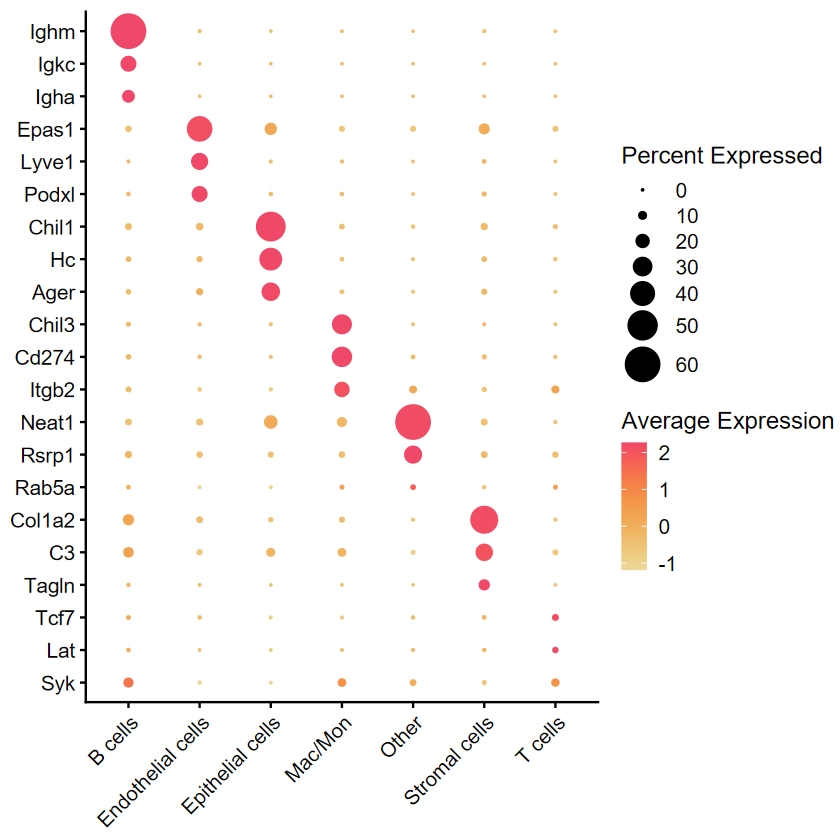

In [172]:
#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 3) -> top3
    
gene_list_plot <- top3 |> pull(gene) |> unique() |> rev()

#DotPlot_scCustom(seurat, features = gene_list_plot, colors_use = hcl.colors(n = 10, palette = 'Mako',rev = T), flip_axes = T)

DotPlot_scCustom(seurat, features = gene_list_plot, colors_use=sequential_palette, flip_axes = T, dot.scale = 9, dot.min = 0, scale.min = 0, scale.max = 60, x_lab_rotate = T, y_lab_rotate = F)


ggsave('full_object_dot_plot_major_cell_types_top3.pdf', path = path, width = 6, height = 6)


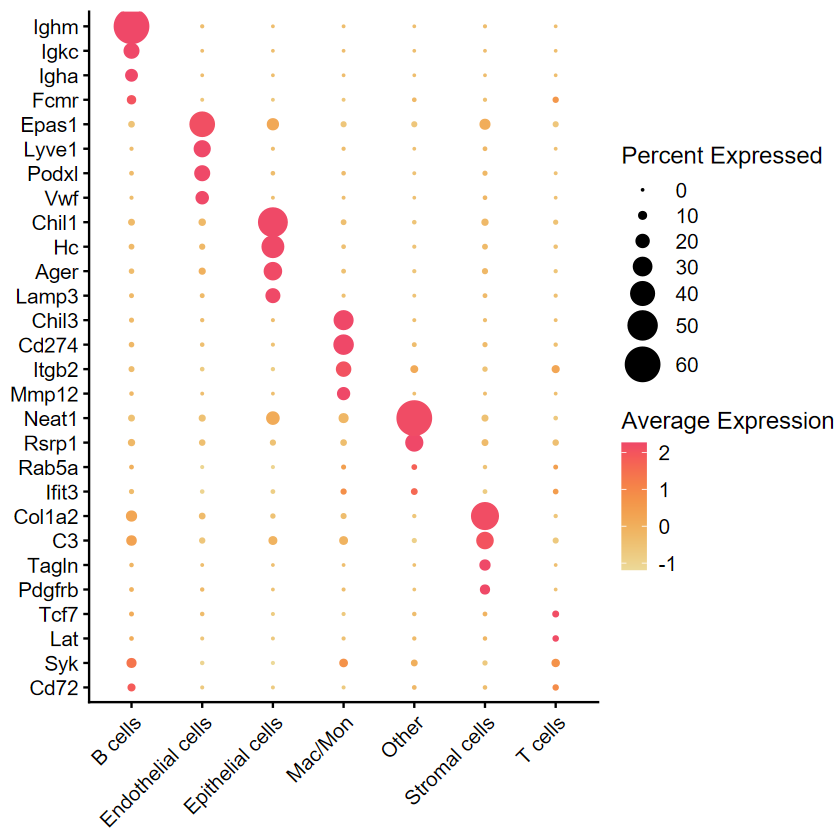

In [173]:
#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 4) -> top4
    
gene_list_plot <- top4 |> pull(gene) |> unique() |> rev()

#DotPlot_scCustom(seurat, features = gene_list_plot, colors_use = hcl.colors(n = 10, palette = 'Mako',rev = T), flip_axes = T)

DotPlot_scCustom(seurat, features = gene_list_plot, colors_use=sequential_palette, flip_axes = T, dot.scale = 9, dot.min = 0, scale.min = 0, scale.max = 60, x_lab_rotate = T, y_lab_rotate = F)


ggsave('full_object_dot_plot_major_cell_types_top4.pdf', path = path, width = 6, height = 7)


In [60]:
hcl.pals(type = 'sequential')

[1] "Grays"         "Light Grays"   "Blues 2"       "Blues 3"      
 [5] "Purples 2"     "Purples 3"     "Reds 2"        "Reds 3"       
 [9] "Greens 2"      "Greens 3"      "Oslo"          "Purple-Blue"  
[13] "Red-Purple"    "Red-Blue"      "Purple-Orange" "Purple-Yellow"
[17] "Blue-Yellow"   "Green-Yellow"  "Red-Yellow"    "Heat"         
[21] "Heat 2"        "Terrain"       "Terrain 2"     "Viridis"      
[25] "Plasma"        "Inferno"       "Rocket"        "Mako"         
[29] "Dark Mint"     "Mint"          "BluGrn"        "Teal"         
[33] "TealGrn"       "Emrld"         "BluYl"         "ag_GrnYl"     
[37] "Peach"         "PinkYl"        "Burg"          "BurgYl"       
[41] "RedOr"         "OrYel"         "Purp"          "PurpOr"       
[45] "Sunset"        "Magenta"       "SunsetDark"    "ag_Sunset"    
[49] "BrwnYl"        "YlOrRd"        "YlOrBr"        "OrRd"         
[53] "Oranges"       "YlGn"          "YlGnBu"        "Reds"         
[57] "RdPu"          "PuRd"          "Purples"       "PuBuGn"       
[61] "PuBu"          "Greens"        "BuGn"          "GnBu"         
[65] "BuPu"          "Blues"         "Lajolla"       "Turku"        
[69] "Hawaii"        "Batlow"

In [178]:
levels(seurat$major_cell_types)

[1] "B cells"           "Endothelial cells" "Epithelial cells" 
[4] "Mac/Mon"           "Other"             "Stromal cells"    
[7] "T cells"

## Macrophages

In [14]:
path <- './Manuscript_figures/'
dir.create(path)
# seurat <- readRDS("Xenium_Ivan_Macrophages.rds")

Warning message in dir.create(path):
"'.\Manuscript_figures' already exists"


In [7]:
levels(seurat$cell_types)
length(unique(seurat$cell_types))

[1] "Acod1+"       "Arg1+"        "Cd14+"        "Cd24a+"       "Cd274+"      
 [6] "Cxcl10+"      "Gpb2+"        "Gpnmb+"       "Il1rn+"       "Marcksl1+"   
[11] "Mxd1+"        "Oasl2+"       "Socs3+"       "Other/distal"

[1] 14

In [18]:
roses_14 <- c(
    
'Acod1+' = '#d465d6',
'Arg1+' = '#ae3351',
'Cd14+' = '#d937de',
'Cd24a+' = '#dcaabf',
'Cd274+' = '#e136a9',
'Cxcl10+' = '#945565',
'Gpb2+' = '#9b399f',
'Gpnmb+' = '#e93b70',
'Il1rn+' = '#de92d5',
'Marcksl1+' = '#b9346a',
'Mxd1+' = '#955884',
'Oasl2+' = '#e567ab',
'Socs3+' = '#d9778f',
'Other/distal' = '#ae347e'
)

roses_14_v2 <- c(

'Acod1+' = '#b15f72' ,
'Arg1+' = '#ae38e2' ,
'Cd14+' = '#de5e2b' ,
'Cd24a+' = '#a256c8' ,
'Cd274+' = '#d93a36' ,
'Cxcl10+' = '#d88ed3' ,
'Gpb2+' = '#a34b35' ,
'Gpnmb+' = '#d43fa8' ,
'Il1rn+' = '#e18c76' ,
'Marcksl1+' = '#974e91' ,
'Mxd1+' = '#ddb3c5' ,
'Oasl2+' = '#d4446d' ,
'Socs3+' = '#8b6582' ,
'Other/distal' = '#956960' 
)

roses_14_v3 <- c(

'Acod1+' = '#df4166',
'Arg1+' = '#a939dd',
'Cd14+' = '#dc4c29',
'Cd24a+' = '#c274de',
'Cd274+' = '#a74a36',
'Cxcl10+' = '#d53fac',
'Gpb2+' = '#e28a73',
'Gpnmb+' = '#8c4a9e',
'Il1rn+' = '#dbb2be',
'Marcksl1+' = '#b54872',
'Mxd1+' = '#dc93cb',
'Oasl2+' = '#966264',
'Socs3+' = '#886286',

'Other/distal' = 'gray' 
)

default_14 <- c(

'Acod1+' = '#5cab47',
'Arg1+' = '#cf5553',
'Cd14+' = '#b65cc6',
'Cd24a+' = '#baa433',
'Cd274+' = '#6b6bd6',
'Cxcl10+' = '#cf622f',
'Gpb2+' = '#698fca',
'Gpnmb+' = '#98894c',
'Il1rn+' = '#bc65b0',
'Marcksl1+' = '#4aaa86',
'Mxd1+' = '#d2427e',
'Oasl2+' = '#ba709f',
'Socs3+' = '#bf6673',

'Other/distal' = 'gray' 
)


color_palette_list <- list('roses_14' = roses_14,
    'roses_14_v2'=roses_14_v2,
    'roses_14_v3' = roses_14_v3,
    'default_14' = default_14)




library(openxlsx)

color_table <- as.data.frame(color_palette_list)
#row.names(color_table) <- names(default_7)

write.xlsx(color_table, file = paste0("color_palettes_macrophages.xlsx"))

In [37]:
roses_4 <- c(
    
    'M1' = '#bc7f94', 
    'M2' = '#da3fb6', 
    'M3' = '#d44970', 
    'M4' = '#c85b9c'  
    
)

roses_4_v2 <- c(
    
    'M1' = '#ca44d0', 
    'M2' = '#ca5ca2', 
    'M3' = '#d34857', 
    'M4' = '#bb7b8b'  
    
)

roses_4_v3 <- c(
    
    'M1' = '#9b50dd', 
    'M2' = '#bf738b', 
    'M3' = '#d1583e', 
    'M4' = '#ac6cbd'  
    
)

roses_4_v4 <- c(
    
    'M1' = '#f27929', 
    'M2' = '#e1d230', 
    'M3' = '#f94fb1', 
    'M4' = '#dc62ef'  
    
)

color_palette_list_4 <- list('roses_4' = roses_4,
                'roses_4_v2' = roses_4_v2,
                'roses_4_v3' = roses_4_v3,
                'roses_4_v4' = roses_4_v4)


library(openxlsx)

color_table <- as.data.frame(color_palette_list_4)
#row.names(color_table) <- names(default_7)

write.xlsx(color_table, file = paste0("color_palettes_macrophages_four_subtypes.xlsx"))

In [267]:
local_path <- paste0(path, 'testing_color_palettes_macrophages/')
unlink(local_path, recursive = T)
dir.create(local_path)

Idents(seurat) <- 'cell_types'

for (palette in names(color_palette_list)) {

    DimPlot(seurat, reduction = "umap", label = TRUE, cols = color_palette_list[[palette]])
    ggsave(paste0('UMAP_',  palette , '.pdf'), path = local_path)
    DimPlot(seurat, reduction = "umap", label = FALSE, split.by = 'Samples', ncol = 4, cols = color_palette_list[[palette]])
    ggsave(paste0('UMAP_by_sample_', palette,'.pdf'), path = local_path, width = 12, height = 10)
    DimPlot(seurat, reduction = "umap", label = TRUE, split.by = 'Groups', ncol = 2, cols = color_palette_list[[palette]])
    ggsave(paste0('UMAP_by_group_', palette,'.pdf'), path = local_path, width = 10, height = 10)

}

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

In [40]:
local_path <- paste0(path, 'testing_color_palettes_macrophages_for_subtypes/')
unlink(local_path, recursive = T)
dir.create(local_path)

Idents(seurat) <- 'four_subsets'

for (palette in names(color_palette_list_4)) {

    DimPlot(seurat, reduction = "umap", label = TRUE, cols = color_palette_list_4[[palette]])
    ggsave(paste0('UMAP_',  palette , '.pdf'), path = local_path)
    DimPlot(seurat, reduction = "umap", label = FALSE, split.by = 'Samples', ncol = 4, cols = color_palette_list_4[[palette]])
    ggsave(paste0('UMAP_by_sample_', palette,'.pdf'), path = local_path, width = 12, height = 10)
    DimPlot(seurat, reduction = "umap", label = TRUE, split.by = 'Groups', ncol = 2, cols = color_palette_list_4[[palette]])
    ggsave(paste0('UMAP_by_group_', palette,'.pdf'), path = local_path, width = 10, height = 10)

}

Warning message in dir.create(local_path):
"'.\Manuscript_figures\testing_color_palettes_macrophages_for_subtypes' already exists"
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this 

In [268]:
## Top genes per cluster

object_annotations <- '_cell_types_macrophages'
 
Idents(seurat) <- 'cell_types'

# seurat <- PrepSCTFindMarkers(seurat, assay = "SCT", verbose = TRUE)
seurat.markers <- FindAllMarkers(seurat, only.pos = TRUE, min.pct = 0.01)

# saveRDS(seurat.markers, file = 'seurat.markers.rds')



#Add gene annotations:
annotations <- read.csv("M:/LPD-MIS members' data/Eduard Ansaldo/Bioinformatics/analysis_templates/annotations.csv")
seurat.markers <- seurat.markers |>
                left_join(y= unique(annotations[,c('gene_name', 'description')]),
                    by = c('gene' = 'gene_name'))

                    

#Top10 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 10) -> top10

#Top25 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 25) -> top25

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 100) -> top100

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 3) -> top3

# write.table(top100,file=paste0(path,'top100',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
write.table(top25,file=paste0(path,'top25',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
# write.table(top10,file=paste0(path,'top10',object_annotations, ".tsv"), sep="\t",row.names = FALSE)


#gene_list_plot <- top5 |> pull(gene)

# pdf(paste0(path, 'Clustered_dotplot', object_annotations, '.pdf'))
# # Clustered_DotPlot(seurat, features=gene_list_plot, k=length(unique(seurat$seurat_clusters)), plot_km_elbow = FALSE, cluster_ident=FALSE, ggplot_default_colors = T)
# dev.off()


    

Calculating cluster Acod1+

Calculating cluster Arg1+

Calculating cluster Cd14+

Calculating cluster Cd24a+

Calculating cluster Cd274+

Calculating cluster Cxcl10+

Calculating cluster Gpb2+

Calculating cluster Gpnmb+

Calculating cluster Il1rn+

Calculating cluster Marcksl1+

Calculating cluster Mxd1+

Calculating cluster Oasl2+

Calculating cluster Socs3+

Calculating cluster Other/distal



In [41]:
## Top genes per cluster

object_annotations <- '_four_subsets_macrophages'
 
Idents(seurat) <- 'four_subsets'

# seurat <- PrepSCTFindMarkers(seurat, assay = "SCT", verbose = TRUE)
seurat.markers <- FindAllMarkers(seurat, only.pos = TRUE, min.pct = 0.01)

# saveRDS(seurat.markers, file = 'seurat.markers.rds')



#Add gene annotations:
annotations <- read.csv("M:/LPD-MIS members' data/Eduard Ansaldo/Bioinformatics/analysis_templates/annotations.csv")
seurat.markers <- seurat.markers |>
                left_join(y= unique(annotations[,c('gene_name', 'description')]),
                    by = c('gene' = 'gene_name'))

                    

#Top10 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 10) -> top10

#Top25 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 25) -> top25

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 100) -> top100

#Top100 markers
seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 3) -> top3

# write.table(top100,file=paste0(path,'top100',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
write.table(top25,file=paste0(path,'top25',object_annotations, ".tsv"), sep="\t",row.names = FALSE)
# write.table(top10,file=paste0(path,'top10',object_annotations, ".tsv"), sep="\t",row.names = FALSE)


#gene_list_plot <- top5 |> pull(gene)

# pdf(paste0(path, 'Clustered_dotplot', object_annotations, '.pdf'))
# # Clustered_DotPlot(seurat, features=gene_list_plot, k=length(unique(seurat$seurat_clusters)), plot_km_elbow = FALSE, cluster_ident=FALSE, ggplot_default_colors = T)
# dev.off()


    

Calculating cluster M1

Calculating cluster M2

Calculating cluster M3

Calculating cluster M4



In [11]:
sequential_palette <- hcl.colors(n = 10, palette = 'PuRd',rev = T)

In [43]:
#gene_list_plot <- c(gene_list_plot, 'Cd3e', 'Cd3d', 'Cd4', 'Cd8b', 'Cd8a', 'Trbc1', 'Cd20', 'Cd19', 'Ighm', 'Igha', 'Ighg1', 'Cd68', 'Csf1r', 'Mafb', 'Itgam', 'Siglecf', 'Mertk', 'Maf', 'Spi1', 'Zeb2')

insert_before <- function(vec, after, new_element) {
    pos <- match(after, vec)
    if (!is.na(pos)) {
        vec <- append(vec, new_element, after = pos)
    }
    return(vec)
}

replace_element <- function(vec, old_element, new_element) {
    pos <- match(old_element, vec)
    if (!is.na(pos)) {
        vec[pos] <- new_element
    }
    return(vec)
}
remove_element <- function(vec, element) {
    vec <- vec[vec != element]
    return(vec)
}

# Example usage:
# gene_list_plot <- remove_element(gene_list_plot, 'Cd3d')

# gene_list_plot <- replace_element(gene_list_plot, 'Cd3d', 'NewCd3d')

# gene_list_plot <- insert_after(gene_list_plot, 'Cd8a', 'NewGene')

In [54]:
sequential_palette <- hcl.colors(n = 10, palette = 'YlOrRd',rev = T)

[1] "M4" "M3" "M2" "M1"

Warning message:
"Scaling data with a low number of groups may produce misleading results"


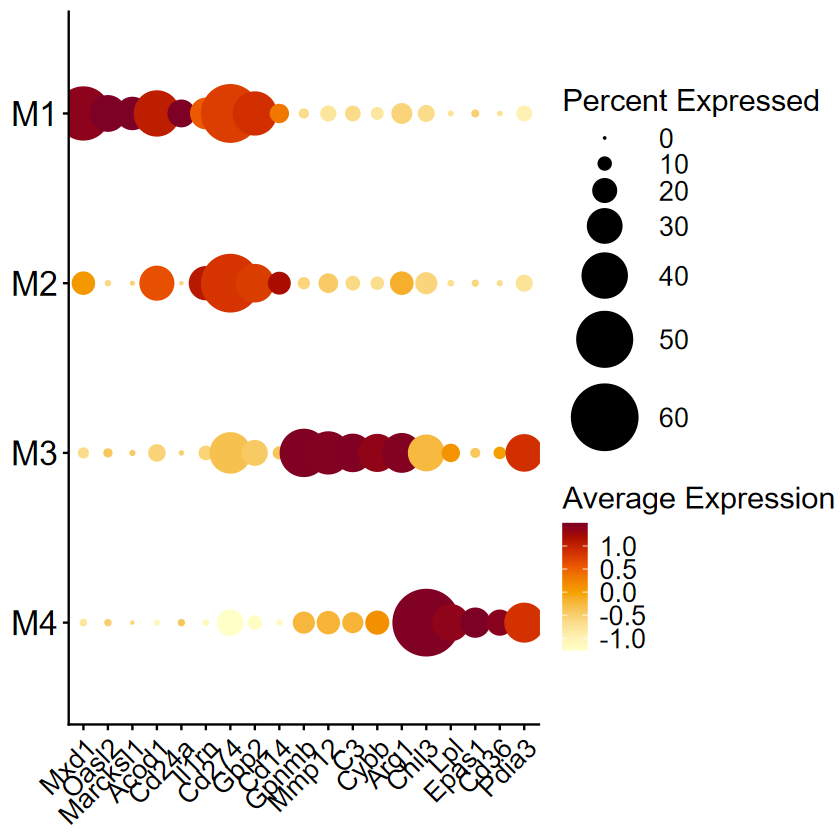

In [55]:
seurat@meta.data <- seurat@meta.data |>
    mutate(four_subsets=factor(four_subsets, levels = rev(levels(seurat$four_subsets))))

levels(seurat$four_subsets)
Idents(seurat) <- 'four_subsets'

seurat.markers %>%
    group_by(cluster) %>%
    slice_head(n = 5) -> top5
    
gene_list_plot <- top5 |> pull(gene) |> unique()

# gene_list_plot <- gene_list_plot |> insert_before('Gbp2', 'Arg1') |> remove_element('Cd274') |>
#     insert_before('Mxd1', 'Cd274') |> insert_before('Col1a2', 'Il1rn') |>
#     remove_element('Mxd1') |> insert_before('Marcksl1', 'Mxd1') |> remove_element('Gbp2') |>
#     insert_before('Cxcl10', 'Gbp2')  |> 
#         remove_element('Nampt') |>
#         remove_element('Sell') |>
#         remove_element('Fscn1') |>
#         unique()
 
#DotPlot_scCustom(seurat, features = gene_list_plot, colors_use = hcl.colors(n = 10, palette = 'Mako',rev = T), flip_axes = T)

DotPlot_scCustom(seurat, features = gene_list_plot, colors_use=sequential_palette, flip_axes = F, dot.scale = 18, dot.min = 0, scale.min = 0, scale.max = 60, x_lab_rotate = T, y_lab_rotate = F)  + theme(axis.text.y = element_text(size = 20), axis.text.x = element_text(size = 16), legend.title = element_text(size = 18), legend.text = element_text(size = 16))


ggsave('macrophage_object_dot_plot_four_subsets_top5_genes_on_x_axis.pdf', path = path, width = 13, height = 8)


seurat@meta.data <- seurat@meta.data |>
    mutate(four_subsets=factor(four_subsets, levels = rev(levels(seurat$four_subsets))))

In [60]:
features_to_plot <- c('Nos2', 'Arg1', 'Fcgr1', 'Itgam')
local_path <- paste0(path, 'Feature_plots/')
dir.create(local_path)

for (gene in features_to_plot) {
    
    FeaturePlot_scCustom(seurat, features = gene, colors_use = sequential_palette, pt.size = 0.1)
    ggsave(paste0('FeaturePlot_', gene,'.pdf'), path = local_path, width = 5, height = 5)
    
    FeaturePlot_scCustom(seurat, features = gene, split.by = 'Groups', colors_use = sequential_palette, pt.size = 0.1, num_columns = 2)
    ggsave(paste0('FeaturePlot_by_groups_', gene,'.pdf'), path = local_path, width = 10, height = 10)
}

Warning message in dir.create(local_path):
"'.\Manuscript_figures\Feature_plots' already exists"


# Plots for hanna

In [4]:
path <- './Plots_for_Hannah/'
dir.create(path)

seurat <- readRDS("Xenium_Ivan_merged_clustered.rds")
levels(seurat$major_cell_types)

Warning message in dir.create(path):
"'.\Plots_for_Hannah' already exists"


[1] "B cells"           "Endothelial cells" "Epithelial cells" 
[4] "Mac/Mon"           "Other"             "Stromal cells"    
[7] "T cells"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image


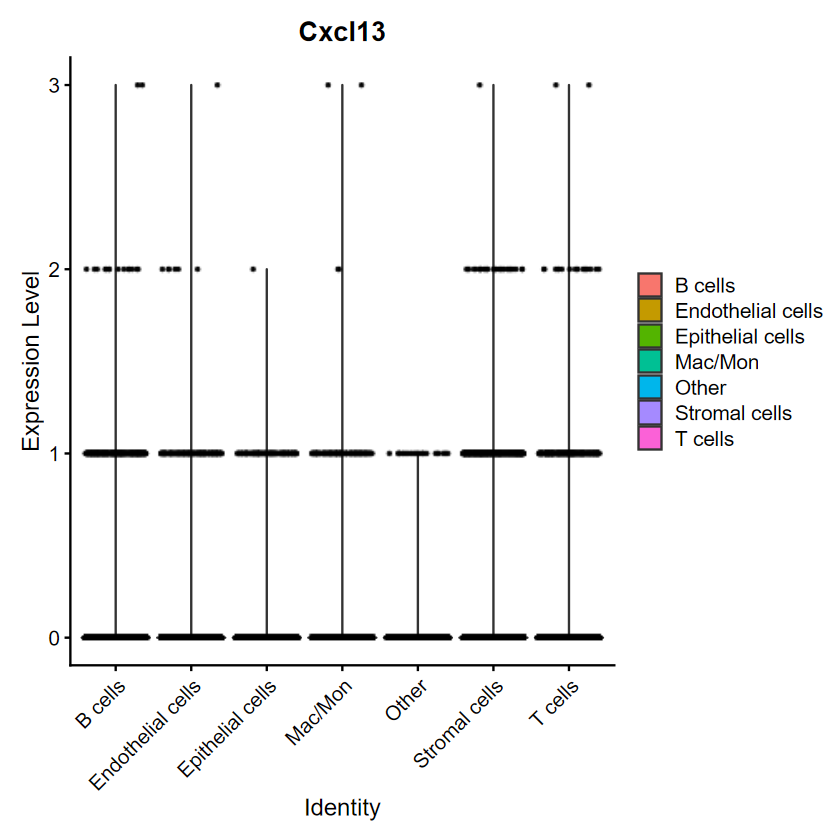

In [ ]:
VlnPlot(seurat, features = 'Cxcl13', layer = 'counts')
ggsave('Cxcl13.pdf', path = path)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



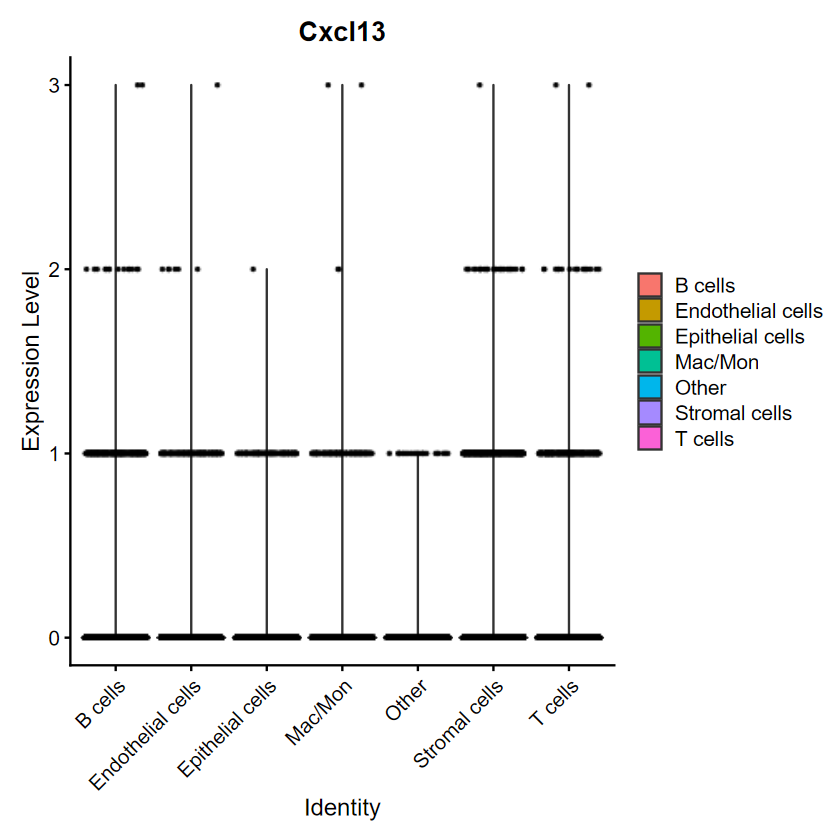

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



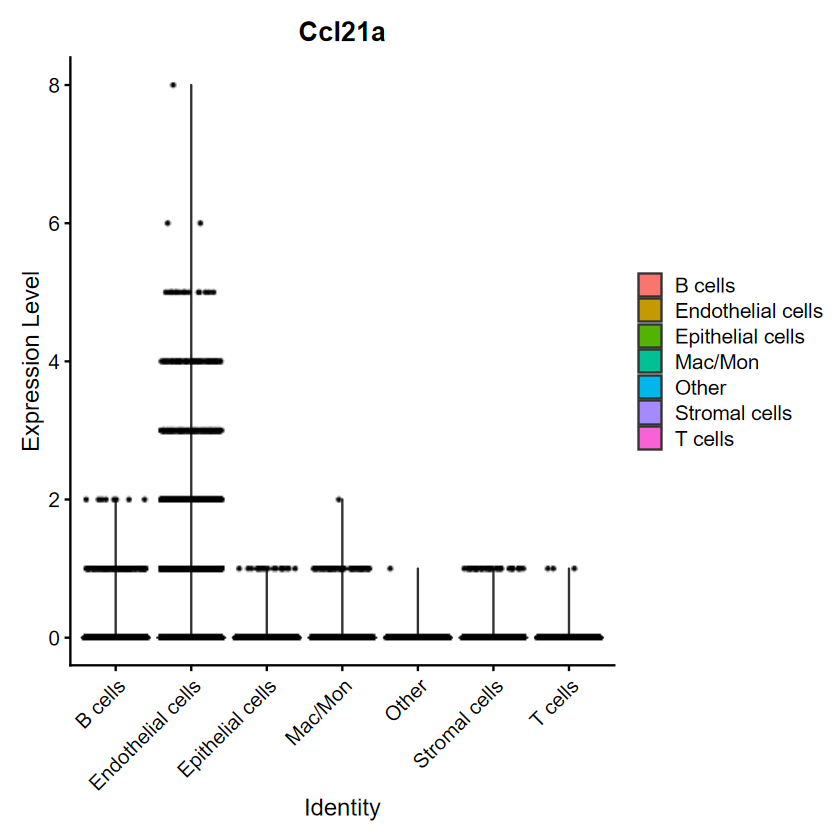

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



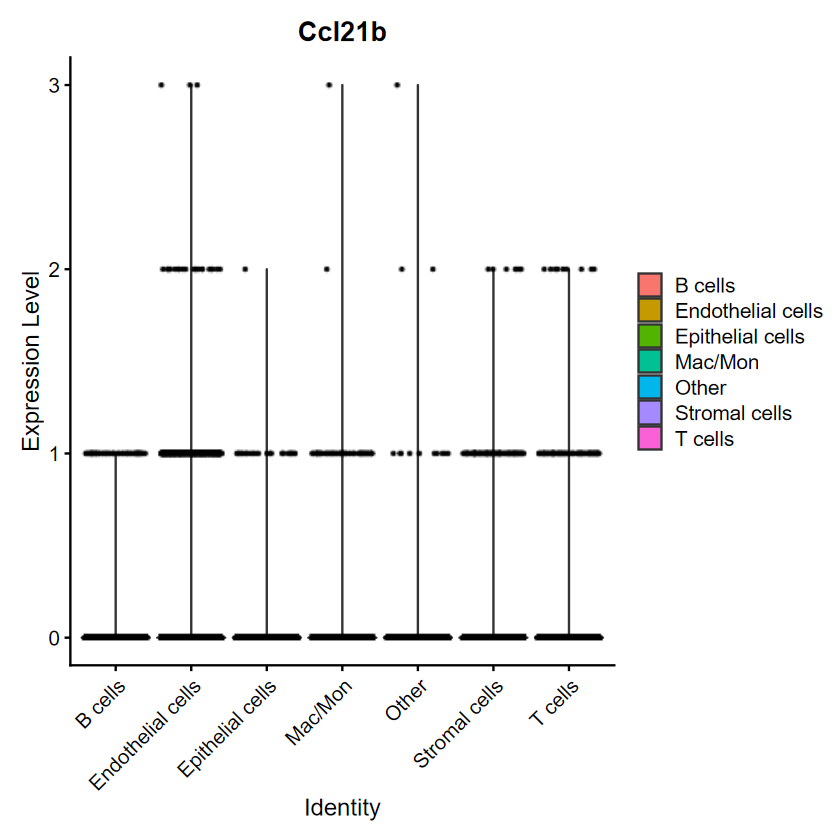

Saving 7 x 7 in image
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



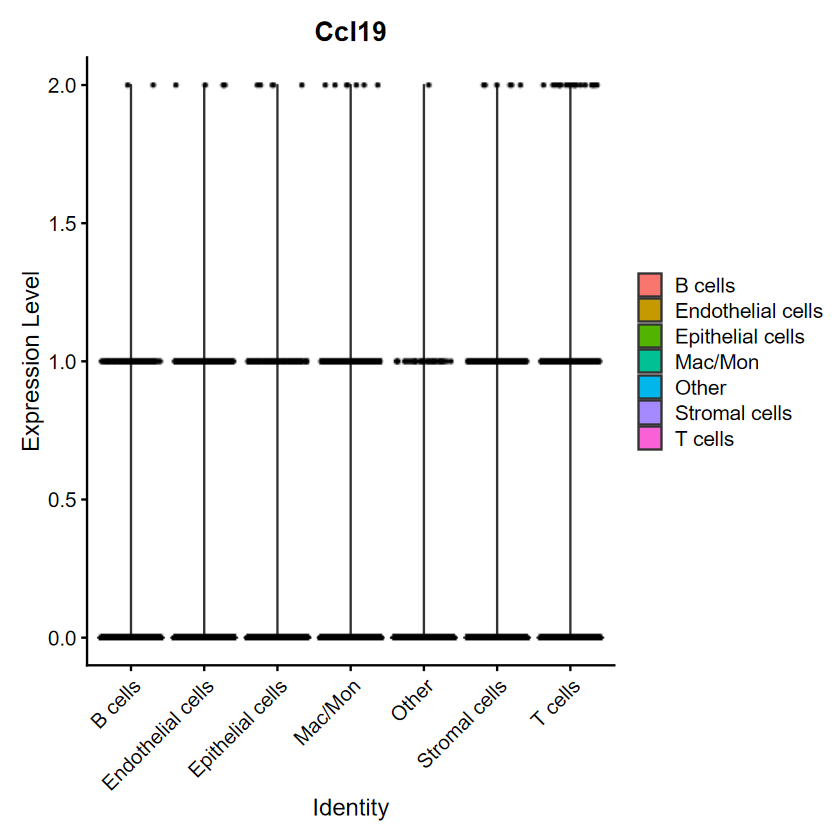

Saving 7 x 7 in image


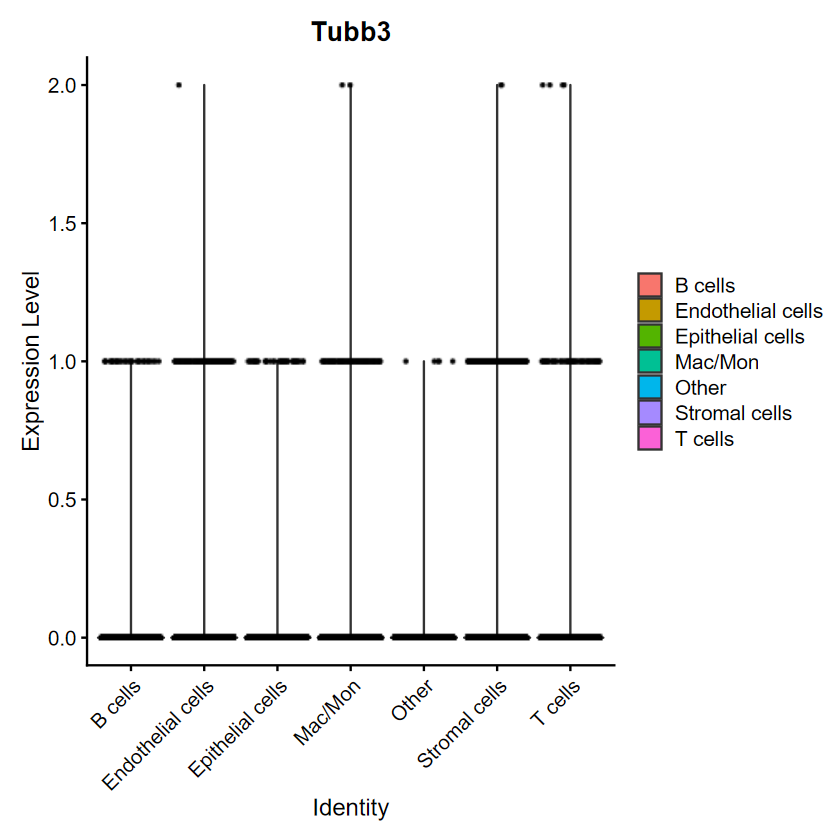

In [9]:
VlnPlot(seurat, features = 'Cxcl13', layer = 'counts')
ggsave('Cxcl13.pdf', path = path)

VlnPlot(seurat, features = 'Ccl21a', layer = 'counts')
ggsave('Ccl21a.pdf', path = path)

VlnPlot(seurat, features = 'Ccl21b', layer = 'counts')
ggsave('Ccl21b.pdf', path = path)

VlnPlot(seurat, features = 'Ccl19', layer = 'counts')
ggsave('Ccl19.pdf', path = path)

VlnPlot(seurat, features = 'Tubb3', layer = 'counts')
ggsave('Tubb3.pdf', path = path)

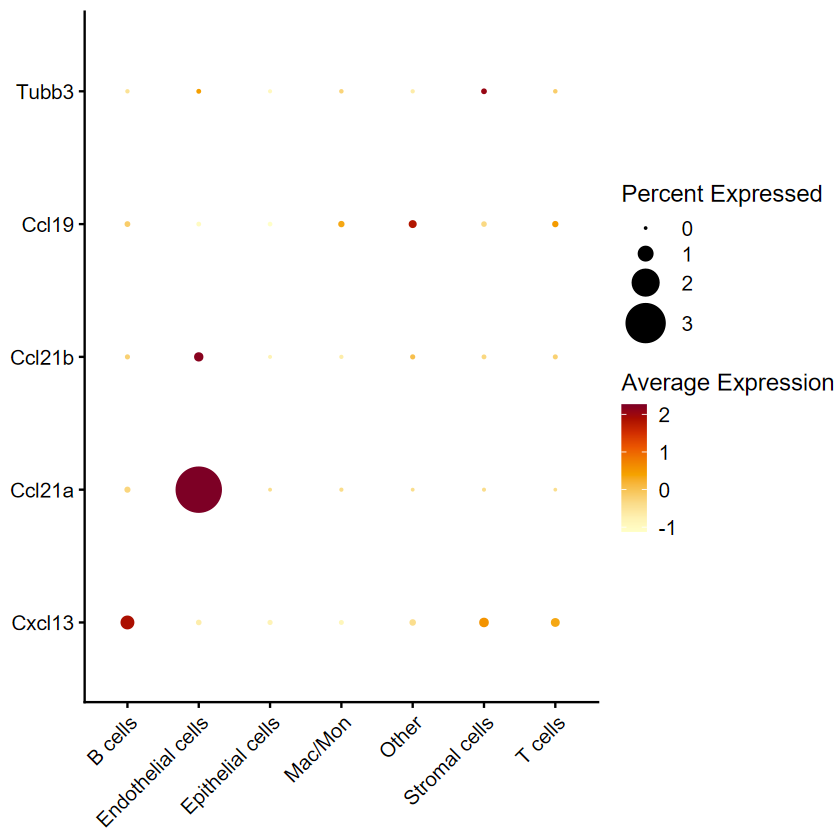

In [22]:
genes <- c('Cxcl13', 'Ccl21a', 'Ccl21b', 'Ccl19', 'Tubb3')
sequential_palette <- hcl.colors(n = 10, palette = 'YlOrRd',rev = T)

DotPlot_scCustom(seurat, features = c('Cxcl13', 'Ccl21a', 'Ccl21b', 'Ccl19', 'Tubb3'), dot.scale = 12, scale.min = 0, scale.max = 3.5, colors_use=sequential_palette, flip_axes = T, x_lab_rotate = T)
ggsave('DotPlot.pdf', path = path, width = 5, height = 5)

Warning message:
"Key 'fovd562_' taken, using 'vtjdp_' instead"
Warning message in brewer.pal(n = length(x = levels(x = molecules$molecule)), name = "Set1"):
"minimal value for n is 3, returning requested palette with 3 different levels
"
Saving 7 x 7 in image


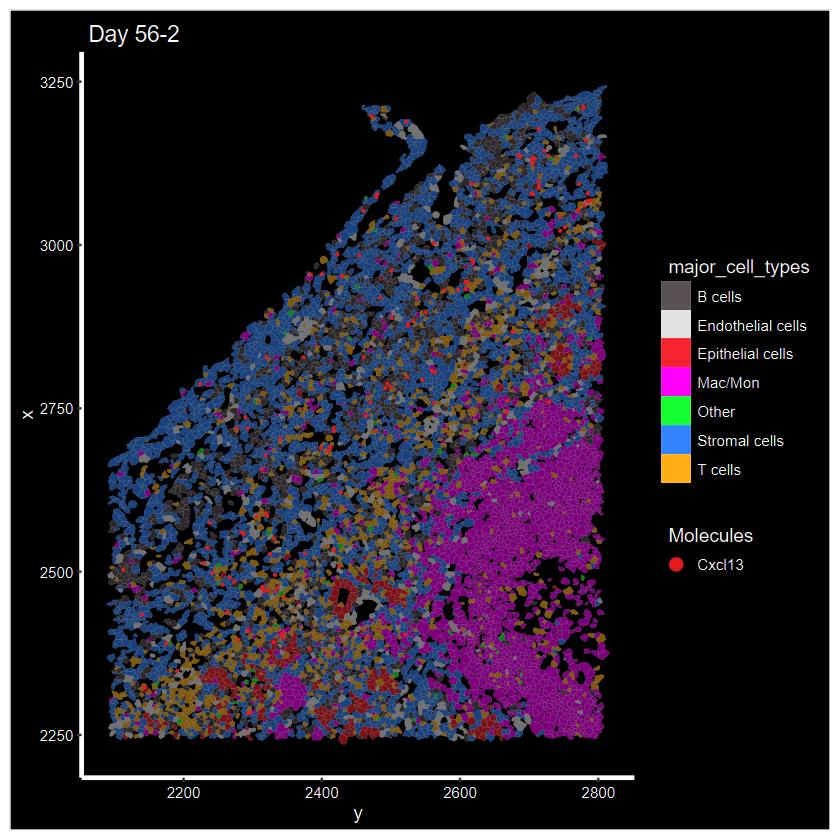

In [47]:
cropped.coords <- Crop(seurat[["fov_d56_2"]], x = c(2100, 2800), y = c(2250, 3250), coords = "plot")

seurat[["zoomd562"]] <- cropped.coords

# visualize cropped area with cell segmentations & selected molecules
DefaultBoundary(seurat[["zoomd562"]]) <- "segmentation"
ImageDimPlot(seurat, fov = "zoomd562", axes = TRUE, border.color = "white", border.size = 0.02, cols = "polychrome", alpha = 0.5, coord.fixed = FALSE, molecules = c('Cxcl13'), nmols = 10000, group.by = 'major_cell_types')+ggtitle('Day 56-2')

ggsave('Cxcl13 zoom.pdf', path = path)

In [49]:
seurat_filtered <- subset(seurat, subset =  Cxcl13  > 0)

Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not 

In [61]:
#path <- './'
# Extracting cell counts for bar graphs
cell_counts <- FetchData(seurat_filtered,vars=c('major_cell_types')) 


counts <- cell_counts |> dplyr::count(major_cell_types, name = 'count') #%>%  ungroup() %>% arrange( major_cell_types , desc(hash.ID) ) #%>% arrange('major_cell_types')
head(counts, 10)

write.csv(counts, paste0(path, 'Cxcl13_expressing_cell_type_counts.csv'))

# counts <- counts %>% 
#     dplyr::count(major_cell_types, Samples, total_cell_count_by_sample,name='cluster_count')  |> 
#         mutate(frequency_within_sample=cluster_count*100/total_cell_count_by_sample)  |> 
#         mutate(Samples = as.character(Samples)) |> 

#         arrange( Samples, desc(Samples)) #%>% arrange('major_cell_types')

# new_counts <- counts |> 
#     arrange(Samples) |>     
#     pivot_wider(id_cols = major_cell_types, names_from = 'Samples', values_from = frequency_within_sample)
    
# write.csv(new_counts,file=paste0(path,"number of cells per cell type per condition .csv"),row.names=F)

# colors <- c('deeppink', 'deeppink3', 'hotpink', 'hotpink4', 'cadetblue', 'cadetblue2', 'deepskyblue', 'deepskyblue4')
# # Barplot of proportion of cells in each cluster by sample
# ggplot(seurat_filtered@meta.data) +
#     geom_bar(aes(x=Groups, fill=major_cell_types), position=position_fill()) 
# ggsave(paste0(path, 'cells_per_cell_type_per_group.pdf'))

# # Barplot of proportion of cells in each cluster by sample
# ggplot(seurat_filtered@meta.data) +
#     geom_bar(aes(x=Samples, fill=major_cell_types), position=position_fill())+ theme(axis.text.x = element_text(angle = 45, vjust = 1))
# ggsave(paste0(path, 'cells_per_cell_type_per_sample.pdf'))
    


,major_cell_types,count
,<fct>,<int>
1,B cells,552
2,Endothelial cells,268
3,Epithelial cells,180
4,Mac/Mon,192
5,Other,26
6,Stromal cells,770
7,T cells,492


# Plots for Eric Tubb3

In [3]:
path <- './Plots_for_Eric/'
dir.create(path)

seurat <- readRDS("Xenium_Ivan_merged_clustered.rds")
levels(seurat$major_cell_types)

Warning message in dir.create(path):
"'.\Plots_for_Hannah' already exists"


[1] "B cells"           "Endothelial cells" "Epithelial cells" 
[4] "Mac/Mon"           "Other"             "Stromal cells"    
[7] "T cells"

In [4]:
path <- './Plots_for_Eric/'
dir.create(path)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Saving 7 x 7 in image


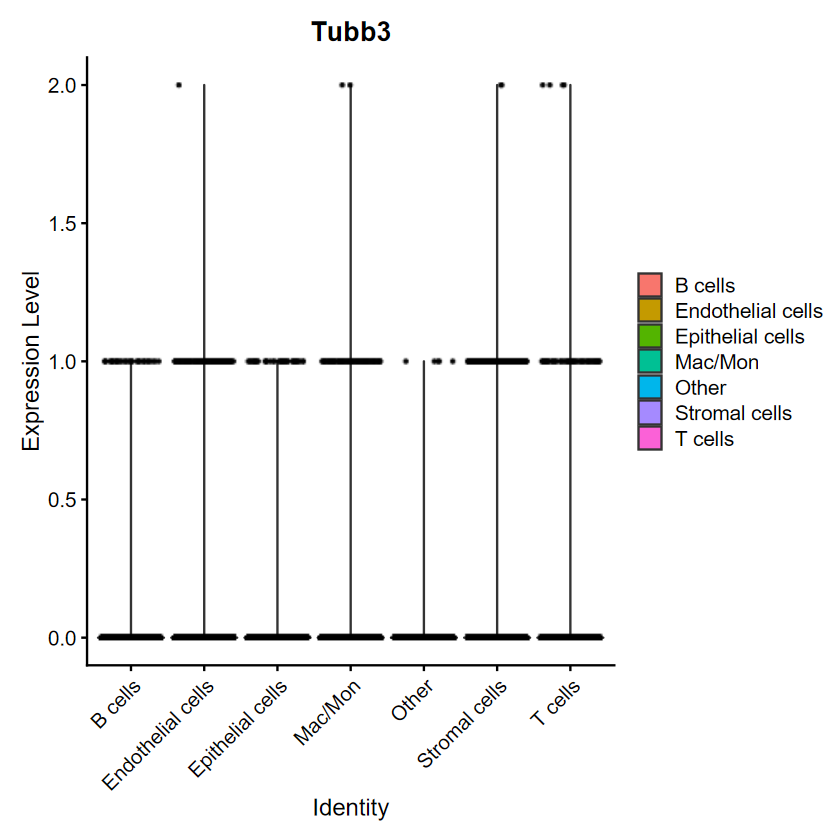

In [5]:
VlnPlot(seurat, features = 'Tubb3', layer = 'counts')
ggsave('Tubb3.pdf', path = path)

Saving 7 x 7 in image


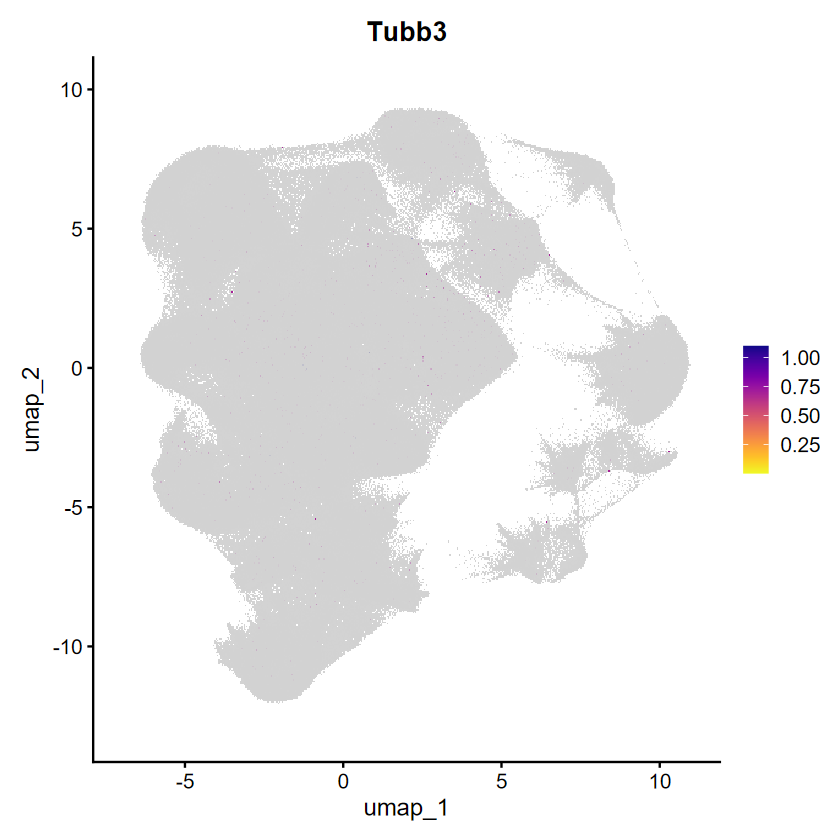

In [25]:
FeaturePlot_scCustom(seurat, features = 'Tubb3', order = T)
ggsave('UMAP_Tubb3.pdf', path = path)

Warning message:
"The following features were omitted as they were not found:
ℹ Syt1"
Warning message:
"Could not find Ascl1 in the default search locations, found in 'Xenium' assay instead"
Warning message:
"No layers found matching search pattern provided"
Warning message in FetchData.Assay5(object = object[[assay]], vars = keyed.var, :
"data layer is not found and counts layer is used"


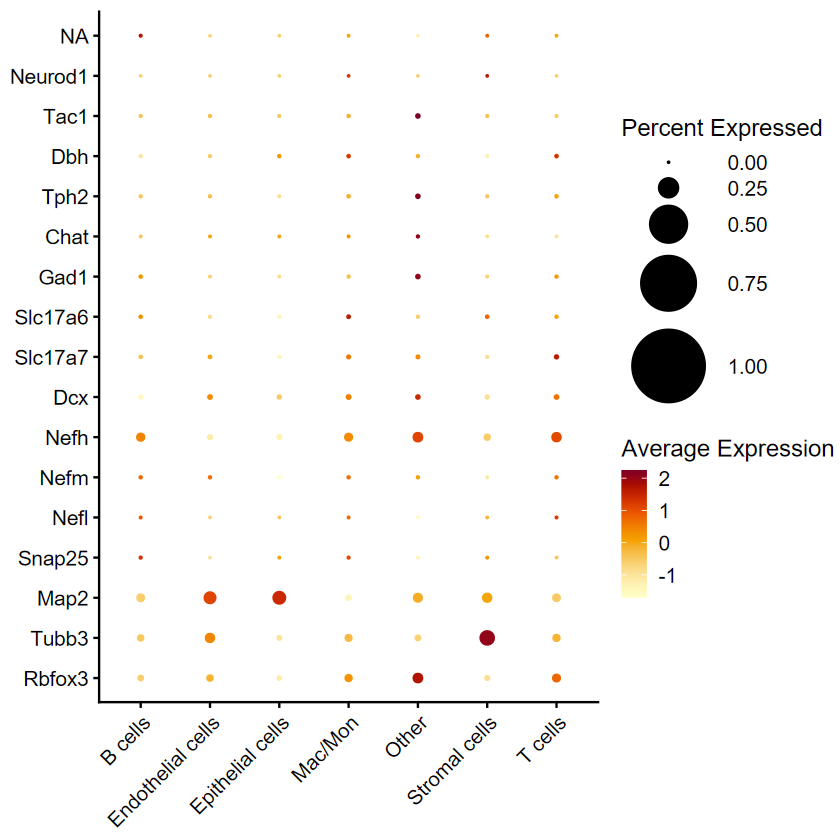

In [29]:
genes <- c('Rbfox3', 'Tubb3', 'Map2', 'Syt1', 'Snap25', 'Nefl', 'Nefm', 'Nefh', 'Dcx', 'Slc17a7', 'Slc17a6', 'Gad1', 'Chat', 'Tph2', 'Dbh', 'Tac1', 'Neurod1', 'Ascl1')
sequential_palette <- hcl.colors(n = 10, palette = 'YlOrRd',rev = T)

DotPlot_scCustom(seurat, features = genes, dot.scale = 20, scale.min = 0, scale.max = 1, colors_use=sequential_palette, flip_axes = T, x_lab_rotate = T)
ggsave('DotPlot.pdf', path = path, width = 5, height = 15)

Warning message:
"Key 'fovd562_' taken, using 'zoomd562_' instead"
Warning message in brewer.pal(n = length(x = levels(x = molecules$molecule)), name = "Set1"):
"minimal value for n is 3, returning requested palette with 3 different levels
"
Saving 7 x 7 in image


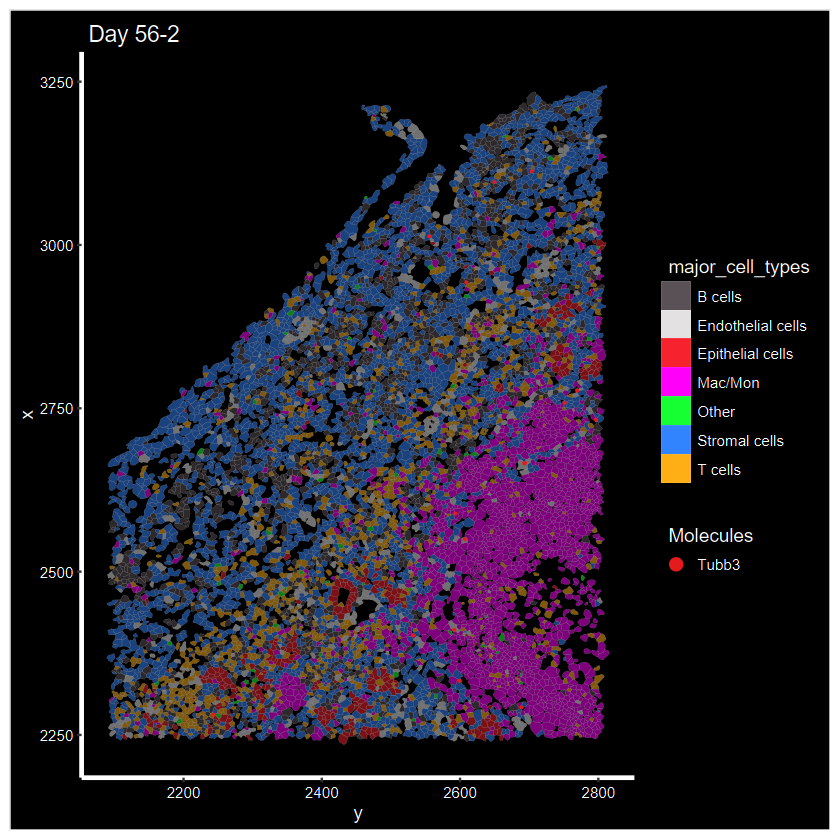

In [16]:
cropped.coords <- Crop(seurat[["fov_d56_2"]], x = c(2100, 2800), y = c(2250, 3250), coords = "plot")

seurat[["zoomd562"]] <- cropped.coords

# visualize cropped area with cell segmentations & selected molecules
DefaultBoundary(seurat[["zoomd562"]]) <- "segmentation"
ImageDimPlot(seurat, fov = "zoomd562", axes = TRUE, border.color = "white", border.size = 0.02, cols = "polychrome", alpha = 0.5, coord.fixed = FALSE, molecules = c('Tubb3'), nmols = 10000, group.by = 'major_cell_types')+ggtitle('Day 56-2')

ggsave('Tubb3 zoom.pdf', path = path)

In [17]:
seurat_filtered <- subset(seurat, subset =  Tubb3  > 0)

Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not validating Seurat objects"
Warning message:
"Not validating FOV objects"
Warning message:
"Not 

In [18]:
#path <- './'
# Extracting cell counts for bar graphs
cell_counts <- FetchData(seurat_filtered,vars=c('major_cell_types')) 


counts <- cell_counts |> dplyr::count(major_cell_types, name = 'count') #%>%  ungroup() %>% arrange( major_cell_types , desc(hash.ID) ) #%>% arrange('major_cell_types')
head(counts, 10)

write.csv(counts, paste0(path, 'Tubb3_expressing_cell_type_counts.csv'))

# counts <- counts %>% 
#     dplyr::count(major_cell_types, Samples, total_cell_count_by_sample,name='cluster_count')  |> 
#         mutate(frequency_within_sample=cluster_count*100/total_cell_count_by_sample)  |> 
#         mutate(Samples = as.character(Samples)) |> 

#         arrange( Samples, desc(Samples)) #%>% arrange('major_cell_types')

# new_counts <- counts |> 
#     arrange(Samples) |>     
#     pivot_wider(id_cols = major_cell_types, names_from = 'Samples', values_from = frequency_within_sample)
    
# write.csv(new_counts,file=paste0(path,"number of cells per cell type per condition .csv"),row.names=F)

# colors <- c('deeppink', 'deeppink3', 'hotpink', 'hotpink4', 'cadetblue', 'cadetblue2', 'deepskyblue', 'deepskyblue4')
# # Barplot of proportion of cells in each cluster by sample
# ggplot(seurat_filtered@meta.data) +
#     geom_bar(aes(x=Groups, fill=major_cell_types), position=position_fill()) 
# ggsave(paste0(path, 'cells_per_cell_type_per_group.pdf'))

# # Barplot of proportion of cells in each cluster by sample
# ggplot(seurat_filtered@meta.data) +
#     geom_bar(aes(x=Samples, fill=major_cell_types), position=position_fill())+ theme(axis.text.x = element_text(angle = 45, vjust = 1))
# ggsave(paste0(path, 'cells_per_cell_type_per_sample.pdf'))
    


,major_cell_types,count
,<fct>,<int>
1,B cells,35
2,Endothelial cells,162
3,Epithelial cells,46
4,Mac/Mon,118
5,Other,5
6,Stromal cells,266
7,T cells,75
